In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import torch
print("pytorch ver . ",torch.__version__)
print("Is CUDA available?",torch.cuda.is_available())
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset,DataLoader
import torch.utils.data as Data
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks.early_stopping import EarlyStopping
import xarray as xr
import os
os.environ['R_HOME'] = '/home/luhung3080/miniconda3/envs/chou/lib/R'
from rpy2.robjects import r, numpy2ri
numpy2ri.activate()
from rpy2.robjects.packages import importr
sinkr = importr('sinkr')
import Nio
print ("pynio ver . ",Nio.__version__)

/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


pytorch ver .  1.11.0+cu113
Is CUDA available? True
pynio ver .  1.5.5


In [2]:
data=pd.read_csv('v100_hr_20200101-0930_cut_utf8.csv')

/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3524: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
x1=np.zeros([243,1704])
x2=np.zeros([243,6816])

#x1 (0th~1703th column as x)
for i in range (0,243):
    for j in range (0,71):
        a=np.array(data['obs_PMf'][6816*i+96*j:6816*i+96*j+24])
        for k in range (0,24):
            if a[k]=='\\N' :
                a[k]=np.nan
        for k in range (0,24):
            x1[i][j*24+k]=a[k]

#x2 (1704th~8519th column as x)
for i in range (1,244):
    b=np.array(data['cal_PMf'][6816*i:6816*i+6816])
    for j in range(0,6816):
        if b[j]=='\\N' :
            b[j]=np.nan
    for j in range(0,6816):
        x2[i-1][j]=b[j]
        
print(np.shape(x1))
print(np.shape(x2))

(243, 1704)
(243, 6816)


In [4]:
x1Restruct=sinkr.dineof(x1)
x2Restruct=sinkr.dineof(x2)

[1] "1 EOF ; RMS = 7.33837042"
[1] "1 EOF ; RMS = 7.30247425"
[1] "1 EOF ; RMS = 7.30277463"
[1] "2 EOF ; RMS = 6.48083577"
[1] "2 EOF ; RMS = 6.47621649"
[1] "2 EOF ; RMS = 6.47548768"
[1] "2 EOF ; RMS = 6.47529531"
[1] "2 EOF ; RMS = 6.47524417"
[1] "2 EOF ; RMS = 6.47523048"
[1] "2 EOF ; RMS = 6.47522677"
[1] "3 EOF ; RMS = 6.05142171"
[1] "3 EOF ; RMS = 6.04898767"
[1] "3 EOF ; RMS = 6.04881686"
[1] "3 EOF ; RMS = 6.04874437"
[1] "3 EOF ; RMS = 6.04871401"
[1] "3 EOF ; RMS = 6.04870236"
[1] "3 EOF ; RMS = 6.04869808"
[1] "4 EOF ; RMS = 5.83919359"
[1] "4 EOF ; RMS = 5.85062782"
[1] "5 EOF ; RMS = 5.62776494"
[1] "5 EOF ; RMS = 5.63034141"
[1] "6 EOF ; RMS = 5.48179276"
[1] "6 EOF ; RMS = 5.48324822"
[1] "7 EOF ; RMS = 5.3737587"
[1] "7 EOF ; RMS = 5.37748012"
[1] "8 EOF ; RMS = 5.26631946"
[1] "8 EOF ; RMS = 5.26473216"
[1] "8 EOF ; RMS = 5.26498112"
[1] "9 EOF ; RMS = 5.17844545"
[1] "9 EOF ; RMS = 5.18206599"
[1] "10 EOF ; RMS = 5.14847662"
[1] "10 EOF ; RMS = 5.1605887"
[1] "11 

In [5]:
x1Restruct_Fun=np.array(x1Restruct[0])
x2Restruct_Fun=np.array(x2Restruct[0])
print(np.shape(x1Restruct_Fun))
print(np.shape(x2Restruct_Fun))

(243, 1704)
(243, 6816)


In [6]:
YRestruct_Fun=np.zeros([239,6816])
for i in range (0,239):
    for j in range (0,1704):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+1][j]
    for j in range (1704,3408):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+2][j-1704]
    for j in range (3408,5112):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+3][j-3408]
    for j in range (5112,6816):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+4][j-5112]
print(np.shape(YRestruct_Fun))

(239, 6816)


In [7]:
XRestruct_Fun=np.zeros([239,8520])
for i in range (0,239):
    for j in range (0,1704):
        XRestruct_Fun[i][j]=x1Restruct_Fun[i][j]
    for j in range (1704,8520):
        XRestruct_Fun[i][j]=x2Restruct_Fun[i][j-1704]
print(np.shape(XRestruct_Fun))

(239, 8520)


In [8]:
Xhat=XRestruct_Fun
Yhat=YRestruct_Fun
Xhat_train = np.zeros([239,8520])
Yhat_train = np.zeros([239,6816])
for i in range (0,239):
    for j in range (0,1704):
        Xhat_train[i][j] = Xhat[i][j]
    for j in range (0,6816):    
        Xhat_train[i][j+1704] = Xhat[i][j+1704]
        Yhat_train[i][j] = Yhat[i][j]
print('Xhat_train')
print(np.shape(Xhat_train))
print('Yhat_train')
print(np.shape(Yhat_train))

Xhat_train
(239, 8520)
Yhat_train
(239, 6816)


In [9]:
x1=np.zeros([273,1704])
x2=np.zeros([273,6816])

#x1 (0th~1703th column as x)
for i in range (0,273):
    for j in range (0,71):
        a=np.array(data['obs_PMf'][6816*i+96*j:6816*i+96*j+24])
        for k in range (0,24):
            if a[k]=='\\N' :
                a[k]=np.nan
        for k in range (0,24):
            x1[i][j*24+k]=a[k]

#x2 (1704th~8519th column as x)
for i in range (1,274):
    b=np.array(data['cal_PMf'][6816*i:6816*i+6816])
    for j in range(0,6816):
        if b[j]=='\\N' :
            b[j]=np.nan
    for j in range(0,6816):
        x2[i-1][j]=b[j]
        
x1Restruct=sinkr.dineof(x1)
x2Restruct=sinkr.dineof(x2)
x1Restruct_Fun=np.array(x1Restruct[0])
x2Restruct_Fun=np.array(x2Restruct[0])

YRestruct_Fun=np.zeros([269,6816])
for i in range (0,269):
    for j in range (0,1704):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+1][j]
    for j in range (1704,3408):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+2][j-1704]
    for j in range (3408,5112):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+3][j-3408]
    for j in range (5112,6816):
        YRestruct_Fun[i][j]=x1Restruct_Fun[i+4][j-5112]
        
XRestruct_Fun=np.zeros([269,8520])
for i in range (0,269):
    for j in range (0,1704):
        XRestruct_Fun[i][j]=x1Restruct_Fun[i][j]
    for j in range (1704,8520):
        XRestruct_Fun[i][j]=x2Restruct_Fun[i][j-1704]     

[1] "1 EOF ; RMS = 7.18658191"
[1] "1 EOF ; RMS = 7.13834773"
[1] "1 EOF ; RMS = 7.13675206"
[1] "1 EOF ; RMS = 7.13656431"
[1] "1 EOF ; RMS = 7.13653118"
[1] "1 EOF ; RMS = 7.13652443"
[1] "2 EOF ; RMS = 6.297108"
[1] "2 EOF ; RMS = 6.29569318"
[1] "2 EOF ; RMS = 6.29553526"
[1] "2 EOF ; RMS = 6.29547123"
[1] "2 EOF ; RMS = 6.29545192"
[1] "2 EOF ; RMS = 6.29544645"
[1] "3 EOF ; RMS = 5.82524306"
[1] "3 EOF ; RMS = 5.82842097"
[1] "4 EOF ; RMS = 5.57014398"
[1] "4 EOF ; RMS = 5.57367418"
[1] "5 EOF ; RMS = 5.28495584"
[1] "5 EOF ; RMS = 5.2807934"
[1] "5 EOF ; RMS = 5.28040582"
[1] "5 EOF ; RMS = 5.28032334"
[1] "5 EOF ; RMS = 5.28030007"
[1] "5 EOF ; RMS = 5.28029289"
[1] "6 EOF ; RMS = 5.16329421"
[1] "6 EOF ; RMS = 5.16507562"
[1] "7 EOF ; RMS = 5.06808026"
[1] "7 EOF ; RMS = 5.06965421"
[1] "8 EOF ; RMS = 5.0247625"
[1] "8 EOF ; RMS = 5.03087228"
[1] "9 EOF ; RMS = 4.94976939"
[1] "9 EOF ; RMS = 4.95151118"
[1] "10 EOF ; RMS = 4.85767356"
[1] "10 EOF ; RMS = 4.8578775"
[1] "11 EOF

In [10]:
Xhat=XRestruct_Fun
Yhat=YRestruct_Fun        
        
Xhat_test = np.zeros([30,8520])
Yhat_test = np.zeros([30,6816])
for i in range (239,269):
    for j in range (0,1704):
        Xhat_test[i-239][j] = Xhat[i][j]
    for j in range (0,6816):
        Xhat_test[i-239][j+1704] = Xhat[i][j+1704]
        Yhat_test[i-239][j] = Yhat[i][j]
        
print('Xhat_test')
print(np.shape(Xhat_test))
print('Yhat_test')
print(np.shape(Yhat_test))   

Xhat_test
(30, 8520)
Yhat_test
(30, 6816)


In [11]:
print('Xhat_train')
print(np.shape(Xhat_train))
print('Yhat_train')
print(np.shape(Yhat_train))
print('Xhat_test')
print(np.shape(Xhat_test))
print('Yhat_test')
print(np.shape(Yhat_test))

Xhat_train
(239, 8520)
Yhat_train
(239, 6816)
Xhat_test
(30, 8520)
Yhat_test
(30, 6816)


In [12]:
Xhat_train_n = np.zeros([71,239,120])
Yhat_train_n = np.zeros([71,239,96])
Xhat_test_n = np.zeros([71,30,120])
Yhat_test_n = np.zeros([71,30,96])
for i in range (0,71):
    for j in range (0,239):
        for k in range (0,24):
            Xhat_train_n[i][j][k] = Xhat_train[j][24*i+k]
        for k in range (0,96):
            Xhat_train_n[i][j][k+24] = Xhat_train[j][1704+(96*i)+k]
            Yhat_train_n[i][j][k] = Yhat_train[j][(96*i)+k]
    for j in range (0,30):
        for k in range (0,24):
            Xhat_test_n[i][j][k] = Xhat_test[j][24*i+k]
        for k in range (0,96):
            Xhat_test_n[i][j][k+24] = Xhat_test[j][1704+(96*i)+k]
            Yhat_test_n[i][j][k] = Yhat_test[j][(96*i)+k]
print('Xhat_train')
print(np.shape(Xhat_train_n))
print('Yhat_train')
print(np.shape(Yhat_train_n))
print('Xhat_test')
print(np.shape(Xhat_test_n))
print('Yhat_test')
print(np.shape(Yhat_test_n))
Xhat_val=Xhat_test_n
Yhat_val=Yhat_test_n
print('Xhat_val')
print(np.shape(Xhat_val))
print('Yhat_val')
print(np.shape(Yhat_val))

Xhat_train
(71, 239, 120)
Yhat_train
(71, 239, 96)
Xhat_test
(71, 30, 120)
Yhat_test
(71, 30, 96)
Xhat_val
(71, 30, 120)
Yhat_val
(71, 30, 96)


In [13]:
print(Xhat_train_n[0][0].shape[0])
print(np.shape(Xhat_train_n[0]))
print(Xhat_train_n[0])

120
(239, 120)
[[ 6.       7.       5.      ...  6.71947  6.74289  6.79627]
 [ 7.       8.       7.      ... 13.9214  16.5754  34.1558 ]
 [ 9.       9.      10.      ...  7.30361  7.29528  7.22208]
 ...
 [11.      12.       9.      ...  8.79978  8.82738  8.80784]
 [15.      11.      13.      ...  6.83519  6.83301  6.82955]
 [15.      13.      15.      ...  2.15221  2.14026  2.13854]]


# Model

In [205]:
x_train = torch.from_numpy(Xhat_train_n[0]).float()
y_train = torch.from_numpy(Yhat_train_n[0]).float()
x_test = torch.from_numpy(Xhat_test_n[0]).float()
y_test = torch.from_numpy(Yhat_test_n[0]).float()
x_val = torch.from_numpy(Xhat_val[0]).float()
y_val = torch.from_numpy(Yhat_val[0]).float()

In [14]:
class PytorchLightningModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.layer1 = nn.Conv1d(1 , 32 , 2)
        self.act1 = nn.ReLU()
        self.layer2 = nn.Conv1d(32 , 32 , 2)
        self.act2 = nn.ReLU()
        self.layer3 = nn.Conv1d(32, 32 , 2)
        self.act3 = nn.ReLU()
        self.layer4 = nn.Conv1d(32 , 32 , 2)
        self.act4 = nn.ReLU()
        self.layer5 = nn.Conv1d(32 , 32 , 2)
        self.act5 = nn.ReLU()
        self.fl = nn.Flatten()
        self.fc1 = nn.Linear(115*32,264)
        self.fc2 = nn.Linear(264,96)
    
    def forward(self, x): 
#         ouput = torch.reshape(x,(x.shape[0] , 1 , 120))
        ouput = torch.unsqueeze(x,1)
#         ouput = self.act1(self.layer1(x))
        ouput = self.act1(self.layer1(ouput))
        ouput = self.act2(self.layer2(ouput))
        ouput = self.act3(self.layer3(ouput))
        ouput = self.act4(self.layer4(ouput))
        ouput = self.act5(self.layer5(ouput))
        ouput = self.fl(ouput)
        ouput = self.fc1(ouput)
        ouput = self.fc2(ouput)
        return ouput

    def configure_optimizers(self): 
        return optim.Adam(self.parameters(), lr=1e-4) 

    def prepare_data(self): 
        self.train_set = Data.TensorDataset(x_train , y_train) 
        self.test_set = Data.TensorDataset(x_test, y_test)
        self.val_set = Data.TensorDataset(x_val, y_val)

    def train_dataloader(self):
        return Data.DataLoader(dataset=self.train_set , batch_size=239 , shuffle=True)

    def test_dataloader(self):
        return Data.DataLoader(dataset=self.test_set , batch_size=30 , shuffle=False)

    def val_dataloader(self):
        return Data.DataLoader(dataset=self.val_set , batch_size=30 , shuffle=False)

    def training_step(self, batch, batch_idx): 
        x, y = batch 
        output  = self.forward(x)
        loss = nn.L1Loss(reduction='mean')(output, y)
        logs = {'loss' : loss}
        self.log("train_loss_MAE", loss)
        return {'loss' : loss , 'log' : logs}

    def test_step(self, batch, batch_idx):
        x, y = batch 
        output  = self.forward(x)
        loss = nn.L1Loss(reduction='mean')(output, y)
        logs = {'loss' : loss}
        self.log("test_loss_MAE", loss)
        return {'loss' : loss , 'log' : logs}

    def validation_step(self, batch, batch_idx):
        x, y = batch 
        output  = self.forward(x)
        loss = nn.L1Loss(reduction='mean')(output, y)
        logs = {'loss' : loss}
        self.log("val_loss_MAE", loss)
        return {'loss' : loss , 'log' : logs}

In [214]:
logger1 = TensorBoardLogger("jupyterNB_logs", name="paper01_test01")
logger2 = CSVLogger("jupyterNB_logs", name="paper01_test01_csv")
model = PytorchLightningModel() 

trainer = pl.Trainer(max_epochs=500 , gpus=1 , logger=logger2)
trainer.fit(model)
trainer.test(model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1942: PossibleUserWarning: The number

Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 145.16it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 23.90it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 12.94it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  8.93it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  6.74it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.42it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.54it/s, loss=15.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  3.90it/s, loss=15.1, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.43it/s, loss=15.1, v_num=1]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=9.48, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:02<00:02,  2.13s/it, loss=9.33, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|████████        | 1/2 [00:02<00:02,  2.16s/it, loss=9.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.20s/it, loss=9.07, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.23s/it, loss=8.96, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.27s/it, loss=8.86, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.30s/it, loss=8.76, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.34s/it, loss=8.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.37s/it, loss=8.61, v_num=1]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:04<00:04,  4.07s/it, loss=7.74, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.10s/it, loss=7.73, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.13s/it, loss=7.72, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:04<00:04,  4.17s/it, loss=7.71, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████▌       | 1/2 [00:04<00:04,  4.20s/it, loss=7.7, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.24s/it, loss=7.69, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.27s/it, loss=7.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.31s/it, loss=7.67, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.34s/it, loss=7.66, v_num=1]
Validation: 0it [00:00,

/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:727: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, test_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 191.42it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.142222881317139
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss_MAE': 6.142222881317139}]

In [184]:
model_test = PytorchLightningModel.load_from_checkpoint('/home/luhung3080/Desktop/PycharmProjects/NCHUproject/jupyterNB_logs/paper01_test01_csv/version_0/checkpoints/epoch=499-step=500.ckpt')
trainer = pl.Trainer()  
k=trainer.test(model_test)

/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning: `max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.
  category=PossibleUserWarning,
GPU available: True, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1826: PossibleUserWarning: GPU available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='gpu', devices=1)`.
  category=PossibleUserWarning,


Testing DataLoader 0: 100%|███████████████████████| 1/1 [00:00<00:00, 48.81it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.146648406982422
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [207]:
# print(k)
# print(type(k))
# a=str(k)
# print(len(a))
# b=[]
# for i in range (19,24):
#    b.append(a[i]) 
# print(b)
# c=0
# c=int(a[19])+0.1*int(a[21])+0.01*int(a[22])+0.001*int(a[23])+0.0001*int(a[24])
# print(c)

In [15]:
# score = np.zeros(71)
for i in range (0,71):
    x_train = torch.from_numpy(Xhat_train_n[i]).float()
    y_train = torch.from_numpy(Yhat_train_n[i]).float()
    x_test = torch.from_numpy(Xhat_test_n[i]).float()
    y_test = torch.from_numpy(Yhat_test_n[i]).float()
    x_val = torch.from_numpy(Xhat_val[i]).float()
    y_val = torch.from_numpy(Yhat_val[i]).float()
    
    logger = CSVLogger("jupyterNB_logs", name="paper01_sim3_csv")
    model = PytorchLightningModel() 
    trainer = pl.Trainer(max_epochs=500 , gpus=1 , logger=logger)
    trainer.fit(model)
    trainer.test(model)
    
#     a=str(k)
#     c=0
#     c=int(a[19])+0.1*int(a[21])+0.01*int(a[22])+0.001*int(a[23])+0.0001*int(a[24])
#     score[i] = c

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: jupyterNB_logs/paper01_sim3_csv
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, val_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/trainer.py:1942: PossibleUserWarning: The number

Epoch 0:  50%|████████        | 1/2 [00:00<00:00,  4.76it/s, loss=12.6, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00,  3.96it/s, loss=12.6, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00,  3.45it/s, loss=12.6, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  3.07it/s, loss=12.5, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  2.79it/s, loss=12.5, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  2.54it/s, loss=12.5, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  2.32it/s, loss=12.5, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  2.15it/s, loss=12.5, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  1.99it/s, loss=12.5, v_num=0]
Validation: 0it [00:00,

Epoch 57:  50%|████████        | 1/2 [00:02<00:02,  2.29s/it, loss=5.7, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:02<00:02,  2.33s/it, loss=5.55, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.37s/it, loss=5.41, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.40s/it, loss=5.27, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.43s/it, loss=5.16, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.47s/it, loss=5.05, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.50s/it, loss=4.96, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.53s/it, loss=4.88, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.57s/it, loss=4.81, v_num=0]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:04<00:04,  4.22s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.25s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.29s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:04<00:04,  4.32s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:04<00:04,  4.35s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.39s/it, loss=4.21, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████▌       | 1/2 [00:04<00:04,  4.42s/it, loss=4.2, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████▌       | 1/2 [00:04<00:04,  4.45s/it, loss=4.2, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████▌       | 1/2 [00:04<00:04,  4.49s/it, loss=4.2, v_num=0]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:06<00:06,  6.15s/it, loss=4.12, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:06<00:06,  6.18s/it, loss=4.12, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.22s/it, loss=4.12, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:06<00:06,  6.25s/it, loss=4.12, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:06<00:06,  6.28s/it, loss=4.12, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.32s/it, loss=4.11, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.35s/it, loss=4.11, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.38s/it, loss=4.11, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.42s/it, loss=4.11, v_num=0]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:08<00:08,  8.12s/it, loss=3.98, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:08<00:08,  8.15s/it, loss=3.97, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:08<00:08,  8.18s/it, loss=3.97, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.22s/it, loss=3.97, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:08<00:08,  8.25s/it, loss=3.96, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.28s/it, loss=3.96, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.32s/it, loss=3.95, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.35s/it, loss=3.95, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.38s/it, loss=3.95, v_num=0]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:10<00:10, 10.15s/it, loss=3.71, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████▌       | 1/2 [00:10<00:10, 10.19s/it, loss=3.7, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████▌       | 1/2 [00:10<00:10, 10.23s/it, loss=3.7, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:10<00:10, 10.26s/it, loss=3.69, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:10<00:10, 10.30s/it, loss=3.69, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:10<00:10, 10.33s/it, loss=3.68, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.37s/it, loss=3.68, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:10<00:10, 10.40s/it, loss=3.67, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.43s/it, loss=3.67, v_num=0]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:12<00:12, 12.11s/it, loss=3.42, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:12<00:12, 12.14s/it, loss=3.41, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:12<00:12, 12.17s/it, loss=3.41, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████▌       | 1/2 [00:12<00:12, 12.21s/it, loss=3.4, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████▌       | 1/2 [00:12<00:12, 12.24s/it, loss=3.4, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:12<00:12, 12.27s/it, loss=3.39, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.31s/it, loss=3.39, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.34s/it, loss=3.39, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.37s/it, loss=3.38, v_num=0]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.05s/it, loss=3.19, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.09s/it, loss=3.19, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.12s/it, loss=3.18, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:14<00:14, 14.16s/it, loss=3.18, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:14<00:14, 14.19s/it, loss=3.18, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.22s/it, loss=3.17, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.25s/it, loss=3.17, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:14<00:14, 14.29s/it, loss=3.17, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.32s/it, loss=3.16, v_num=0]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 16.00s/it, loss=3.01, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:16<00:16, 16.04s/it, loss=3.01, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.08s/it, loss=3.01, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:16<00:16, 16.12s/it, loss=3.01, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|████████▌        | 1/2 [00:16<00:16, 16.16s/it, loss=3, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|████████▌        | 1/2 [00:16<00:16, 16.20s/it, loss=3, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|████████▌        | 1/2 [00:16<00:16, 16.24s/it, loss=3, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:16<00:16, 16.28s/it, loss=2.99, v_num=0]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:16<00:16, 16.32s/it, loss=2.99, v_num=0]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/home/luhung3080/miniconda3/envs/chou/lib/python3.7/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:245: PossibleUserWarning: The dataloader, test_dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 16 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  category=PossibleUserWarning,


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 169.27it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.296468734741211
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████▌        | 1/2 [00:00<00:00, 164.26it/s, loss=14, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|█████████         | 1/2 [00:00<00:00, 25.37it/s, loss=14, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|█████████         | 1/2 [00:00<00:00, 14.11it/s, loss=14, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|█████████         | 1/2 [00:00<00:00,  9.80it/s, loss=14, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  7.48it/s, loss=13.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  6.06it/s, loss=13.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  5.08it/s, loss=13.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.36it/s, loss=13.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.81it/s, loss=13.9, v_num=1]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.84s/it, loss=6.51, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.87s/it, loss=6.34, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|████████        | 1/2 [00:01<00:01,  1.91s/it, loss=6.2, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:01<00:01,  1.94s/it, loss=6.07, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:01<00:01,  1.97s/it, loss=5.95, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.01s/it, loss=5.84, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.04s/it, loss=5.76, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.07s/it, loss=5.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=5.62, v_num=1]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.77s/it, loss=4.98, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.80s/it, loss=4.98, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.84s/it, loss=4.98, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.87s/it, loss=4.98, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.90s/it, loss=4.97, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:03<00:03,  3.93s/it, loss=4.97, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:03<00:03,  3.97s/it, loss=4.97, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.00s/it, loss=4.97, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.04s/it, loss=4.96, v_num=1]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.69s/it, loss=4.82, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.72s/it, loss=4.81, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.75s/it, loss=4.81, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.78s/it, loss=4.81, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████▌       | 1/2 [00:05<00:05,  5.82s/it, loss=4.8, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████▌       | 1/2 [00:05<00:05,  5.85s/it, loss=4.8, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████▌       | 1/2 [00:05<00:05,  5.88s/it, loss=4.8, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:05<00:05,  5.91s/it, loss=4.79, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:05<00:05,  5.95s/it, loss=4.79, v_num=1]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.56s/it, loss=4.61, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.60s/it, loss=4.61, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████▌       | 1/2 [00:07<00:07,  7.63s/it, loss=4.6, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████▌       | 1/2 [00:07<00:07,  7.66s/it, loss=4.6, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.70s/it, loss=4.59, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.73s/it, loss=4.59, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  7.76s/it, loss=4.58, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:07<00:07,  7.80s/it, loss=4.58, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:07<00:07,  7.83s/it, loss=4.57, v_num=1]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.47s/it, loss=4.27, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.50s/it, loss=4.26, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.53s/it, loss=4.26, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.57s/it, loss=4.25, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.60s/it, loss=4.24, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.63s/it, loss=4.24, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.66s/it, loss=4.23, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.70s/it, loss=4.22, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.73s/it, loss=4.22, v_num=1]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.42s/it, loss=3.93, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.45s/it, loss=3.93, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.49s/it, loss=3.92, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.53s/it, loss=3.92, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.56s/it, loss=3.91, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.60s/it, loss=3.91, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████▌       | 1/2 [00:11<00:11, 11.63s/it, loss=3.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████▌       | 1/2 [00:11<00:11, 11.67s/it, loss=3.9, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.70s/it, loss=3.89, v_num=1]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.37s/it, loss=3.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.40s/it, loss=3.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.44s/it, loss=3.68, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.47s/it, loss=3.67, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.51s/it, loss=3.67, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.54s/it, loss=3.67, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.57s/it, loss=3.66, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.61s/it, loss=3.66, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.64s/it, loss=3.65, v_num=1]
Validation: 0it [00:00,

Epoch 456:  50%|███████▌       | 1/2 [00:15<00:15, 15.33s/it, loss=3.5, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.36s/it, loss=3.49, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.40s/it, loss=3.49, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.43s/it, loss=3.49, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.47s/it, loss=3.49, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.50s/it, loss=3.48, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.53s/it, loss=3.48, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.56s/it, loss=3.48, v_num=1]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.60s/it, loss=3.47, v_num=1]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 178.80it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.729395389556885
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 156.01it/s, loss=12.7, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 26.13it/s, loss=12.7, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 14.26it/s, loss=12.7, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  9.77it/s, loss=12.7, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  7.38it/s, loss=12.7, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.96it/s, loss=12.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.99it/s, loss=12.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.30it/s, loss=12.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.78it/s, loss=12.6, v_num=2]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.85s/it, loss=5.16, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.89s/it, loss=5.11, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.92s/it, loss=5.07, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:01<00:01,  1.95s/it, loss=5.04, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:01<00:01,  1.98s/it, loss=5.01, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.02s/it, loss=4.99, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.05s/it, loss=4.96, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.08s/it, loss=4.93, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|████████        | 1/2 [00:02<00:02,  2.11s/it, loss=4.9, v_num=2]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.73s/it, loss=4.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.77s/it, loss=4.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.80s/it, loss=4.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.84s/it, loss=4.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.87s/it, loss=4.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████▌       | 1/2 [00:03<00:03,  3.90s/it, loss=4.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████▌       | 1/2 [00:03<00:03,  3.93s/it, loss=4.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████▌       | 1/2 [00:03<00:03,  3.97s/it, loss=4.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████▌       | 1/2 [00:03<00:03,  4.00s/it, loss=4.6, v_num=2]
Validation: 0it [00:00,

Epoch 171:  50%|███████▌       | 1/2 [00:05<00:05,  5.70s/it, loss=4.5, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████▌       | 1/2 [00:05<00:05,  5.73s/it, loss=4.5, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.76s/it, loss=4.49, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.80s/it, loss=4.49, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.83s/it, loss=4.49, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.86s/it, loss=4.49, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:05<00:05,  5.89s/it, loss=4.48, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:05<00:05,  5.92s/it, loss=4.48, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:05<00:05,  5.96s/it, loss=4.48, v_num=2]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.60s/it, loss=4.33, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.64s/it, loss=4.32, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.67s/it, loss=4.32, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.70s/it, loss=4.31, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.74s/it, loss=4.31, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.77s/it, loss=4.31, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████▌       | 1/2 [00:07<00:07,  7.81s/it, loss=4.3, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████▌       | 1/2 [00:07<00:07,  7.84s/it, loss=4.3, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:07<00:07,  7.87s/it, loss=4.29, v_num=2]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.50s/it, loss=4.03, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.53s/it, loss=4.03, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.57s/it, loss=4.02, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.60s/it, loss=4.01, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.63s/it, loss=4.01, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|████████▌        | 1/2 [00:09<00:09,  9.67s/it, loss=4, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|████████▌        | 1/2 [00:09<00:09,  9.70s/it, loss=4, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.73s/it, loss=3.99, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.76s/it, loss=3.99, v_num=2]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.40s/it, loss=3.79, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.44s/it, loss=3.78, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.47s/it, loss=3.78, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.50s/it, loss=3.77, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.54s/it, loss=3.77, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.57s/it, loss=3.77, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.60s/it, loss=3.77, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.64s/it, loss=3.76, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.67s/it, loss=3.76, v_num=2]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.31s/it, loss=3.62, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.34s/it, loss=3.62, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.38s/it, loss=3.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.41s/it, loss=3.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.45s/it, loss=3.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.48s/it, loss=3.61, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████▌       | 1/2 [00:13<00:13, 13.57s/it, loss=3.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████▌       | 1/2 [00:13<00:13, 13.60s/it, loss=3.6, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████▌       | 1/2 [00:13<00:13, 13.64s/it, loss=3.6, v_num=2]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.32s/it, loss=3.48, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.36s/it, loss=3.47, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.39s/it, loss=3.47, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.43s/it, loss=3.47, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.46s/it, loss=3.47, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.49s/it, loss=3.46, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.53s/it, loss=3.46, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.56s/it, loss=3.46, v_num=2]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.60s/it, loss=3.46, v_num=2]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 200.35it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.456485271453857
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 150.23it/s, loss=14.1, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 25.55it/s, loss=14.1, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 14.06it/s, loss=14.1, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  9.69it/s, loss=14.1, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|█████████         | 1/2 [00:00<00:00,  7.22it/s, loss=14, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|█████████         | 1/2 [00:00<00:00,  5.84it/s, loss=14, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|█████████         | 1/2 [00:00<00:00,  4.93it/s, loss=14, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|█████████         | 1/2 [00:00<00:00,  4.27it/s, loss=14, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.77it/s, loss=13.9, v_num=3]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.88s/it, loss=5.52, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.92s/it, loss=5.45, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.95s/it, loss=5.39, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:01<00:01,  1.98s/it, loss=5.34, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|████████        | 1/2 [00:02<00:02,  2.02s/it, loss=5.3, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.06s/it, loss=5.26, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=5.22, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=5.17, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=5.13, v_num=3]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.76s/it, loss=4.77, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.79s/it, loss=4.77, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.82s/it, loss=4.76, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.86s/it, loss=4.76, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.89s/it, loss=4.76, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:03<00:03,  3.92s/it, loss=4.76, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:03<00:03,  3.96s/it, loss=4.75, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:03<00:03,  3.99s/it, loss=4.75, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.02s/it, loss=4.75, v_num=3]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.67s/it, loss=4.58, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.70s/it, loss=4.58, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.74s/it, loss=4.57, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.77s/it, loss=4.57, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.81s/it, loss=4.56, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.85s/it, loss=4.56, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:05<00:05,  5.89s/it, loss=4.55, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:05<00:05,  5.92s/it, loss=4.55, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:05<00:05,  5.95s/it, loss=4.55, v_num=3]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.68s/it, loss=4.31, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████▌       | 1/2 [00:07<00:07,  7.72s/it, loss=4.3, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████▌       | 1/2 [00:07<00:07,  7.76s/it, loss=4.3, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.79s/it, loss=4.29, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.83s/it, loss=4.28, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.86s/it, loss=4.28, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  7.90s/it, loss=4.27, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:07<00:07,  7.94s/it, loss=4.27, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:07<00:07,  7.99s/it, loss=4.26, v_num=3]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.70s/it, loss=3.99, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.73s/it, loss=3.99, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.77s/it, loss=3.98, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.80s/it, loss=3.98, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.83s/it, loss=3.97, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.86s/it, loss=3.96, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.90s/it, loss=3.96, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.93s/it, loss=3.95, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.96s/it, loss=3.95, v_num=3]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.69s/it, loss=3.69, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.72s/it, loss=3.69, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.75s/it, loss=3.68, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.79s/it, loss=3.68, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.82s/it, loss=3.67, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.86s/it, loss=3.67, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.90s/it, loss=3.66, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.93s/it, loss=3.66, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.97s/it, loss=3.65, v_num=3]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.61s/it, loss=3.43, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.64s/it, loss=3.43, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.68s/it, loss=3.42, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.71s/it, loss=3.42, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.75s/it, loss=3.41, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.78s/it, loss=3.41, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.81s/it, loss=3.41, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████▌       | 1/2 [00:13<00:13, 13.84s/it, loss=3.4, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████▌       | 1/2 [00:13<00:13, 13.88s/it, loss=3.4, v_num=3]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.57s/it, loss=3.22, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.62s/it, loss=3.22, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.66s/it, loss=3.22, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.70s/it, loss=3.21, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.74s/it, loss=3.21, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.78s/it, loss=3.21, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.82s/it, loss=3.21, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████▌       | 1/2 [00:15<00:15, 15.85s/it, loss=3.2, v_num=3]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████▌       | 1/2 [00:15<00:15, 15.89s/it, loss=3.2, v_num=3]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 202.26it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.386786460876465
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 152.93it/s, loss=14.2, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 25.83it/s, loss=14.2, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 14.38it/s, loss=14.2, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  9.62it/s, loss=14.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  7.27it/s, loss=14.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.91it/s, loss=14.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.97it/s, loss=14.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.28it/s, loss=14.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.77it/s, loss=14.1, v_num=4]
Validation: 0it [00:00,

Epoch 57:  50%|████████        | 1/2 [00:01<00:01,  1.89s/it, loss=6.2, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.93s/it, loss=6.13, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.96s/it, loss=6.06, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|█████████         | 1/2 [00:01<00:01,  1.99s/it, loss=6, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.03s/it, loss=5.95, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.06s/it, loss=5.91, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.10s/it, loss=5.87, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.13s/it, loss=5.83, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.16s/it, loss=5.79, v_num=4]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.77s/it, loss=5.41, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.81s/it, loss=5.41, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████▌       | 1/2 [00:03<00:03,  3.84s/it, loss=5.4, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████▌       | 1/2 [00:03<00:03,  3.87s/it, loss=5.4, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████▌       | 1/2 [00:03<00:03,  3.90s/it, loss=5.4, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████▌       | 1/2 [00:03<00:03,  3.94s/it, loss=5.4, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████▌       | 1/2 [00:03<00:03,  3.97s/it, loss=5.4, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.00s/it, loss=5.39, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.03s/it, loss=5.39, v_num=4]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.66s/it, loss=5.29, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.70s/it, loss=5.28, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.73s/it, loss=5.28, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.76s/it, loss=5.28, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.79s/it, loss=5.28, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.83s/it, loss=5.27, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:05<00:05,  5.86s/it, loss=5.27, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:05<00:05,  5.89s/it, loss=5.27, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=5.26, v_num=4]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.53s/it, loss=5.11, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████▌       | 1/2 [00:07<00:07,  7.57s/it, loss=5.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████▌       | 1/2 [00:07<00:07,  7.60s/it, loss=5.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████▌       | 1/2 [00:07<00:07,  7.64s/it, loss=5.1, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.67s/it, loss=5.09, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.71s/it, loss=5.09, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  7.74s/it, loss=5.08, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:07<00:07,  7.78s/it, loss=5.08, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:07<00:07,  7.81s/it, loss=5.08, v_num=4]
Validation: 0it [00:00,

Epoch 285:  50%|███████▌       | 1/2 [00:09<00:09,  9.43s/it, loss=4.9, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████▌       | 1/2 [00:09<00:09,  9.47s/it, loss=4.9, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.50s/it, loss=4.89, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.53s/it, loss=4.89, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.57s/it, loss=4.89, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.60s/it, loss=4.88, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.63s/it, loss=4.88, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.67s/it, loss=4.88, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.70s/it, loss=4.87, v_num=4]
Validation: 0it [00:00,

Epoch 342:  50%|███████▌       | 1/2 [00:11<00:11, 11.37s/it, loss=4.7, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.40s/it, loss=4.69, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.44s/it, loss=4.69, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.48s/it, loss=4.68, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.51s/it, loss=4.68, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.55s/it, loss=4.68, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.58s/it, loss=4.67, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.62s/it, loss=4.67, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.66s/it, loss=4.66, v_num=4]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.33s/it, loss=4.46, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.37s/it, loss=4.46, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.40s/it, loss=4.46, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.44s/it, loss=4.45, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.47s/it, loss=4.45, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.50s/it, loss=4.44, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.54s/it, loss=4.44, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.57s/it, loss=4.44, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.61s/it, loss=4.43, v_num=4]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.36s/it, loss=4.25, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.40s/it, loss=4.24, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.43s/it, loss=4.24, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.47s/it, loss=4.24, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.50s/it, loss=4.23, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.53s/it, loss=4.23, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.57s/it, loss=4.23, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.60s/it, loss=4.22, v_num=4]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.64s/it, loss=4.22, v_num=4]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 214.59it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.825883388519287
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 140.17it/s, loss=14.1, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 27.01it/s, loss=14.1, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|█████████         | 1/2 [00:00<00:00, 14.59it/s, loss=14, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|█████████         | 1/2 [00:00<00:00,  9.66it/s, loss=14, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|█████████         | 1/2 [00:00<00:00,  7.32it/s, loss=14, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|█████████         | 1/2 [00:00<00:00,  5.97it/s, loss=14, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  5.01it/s, loss=13.9, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.30it/s, loss=13.9, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.77it/s, loss=13.9, v_num=5]
Validation: 0it [00:00,

Epoch 57:  50%|█████████         | 1/2 [00:02<00:02,  2.01s/it, loss=6, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:02<00:02,  2.04s/it, loss=5.96, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.08s/it, loss=5.93, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.11s/it, loss=5.89, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=5.86, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.18s/it, loss=5.82, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.22s/it, loss=5.79, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.25s/it, loss=5.75, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.29s/it, loss=5.72, v_num=5]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.97s/it, loss=5.44, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.01s/it, loss=5.44, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.04s/it, loss=5.43, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:04<00:04,  4.08s/it, loss=5.43, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:04<00:04,  4.11s/it, loss=5.43, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.15s/it, loss=5.42, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.18s/it, loss=5.42, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.21s/it, loss=5.42, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.25s/it, loss=5.41, v_num=5]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  6.00s/it, loss=5.19, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:06<00:06,  6.03s/it, loss=5.18, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.07s/it, loss=5.18, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:06<00:06,  6.10s/it, loss=5.17, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:06<00:06,  6.14s/it, loss=5.16, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.17s/it, loss=5.16, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.20s/it, loss=5.15, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.24s/it, loss=5.14, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.27s/it, loss=5.14, v_num=5]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=4.74, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:08<00:08,  8.07s/it, loss=4.73, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:08<00:08,  8.10s/it, loss=4.72, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.14s/it, loss=4.72, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:08<00:08,  8.18s/it, loss=4.71, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████▌       | 1/2 [00:08<00:08,  8.21s/it, loss=4.7, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.25s/it, loss=4.69, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.29s/it, loss=4.68, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.32s/it, loss=4.68, v_num=5]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:10<00:10, 10.06s/it, loss=4.26, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:10<00:10, 10.09s/it, loss=4.25, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:10<00:10, 10.13s/it, loss=4.25, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:10<00:10, 10.16s/it, loss=4.24, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:10<00:10, 10.20s/it, loss=4.23, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:10<00:10, 10.24s/it, loss=4.22, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.27s/it, loss=4.21, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████▌       | 1/2 [00:10<00:10, 10.31s/it, loss=4.2, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████▌       | 1/2 [00:10<00:10, 10.34s/it, loss=4.2, v_num=5]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:12<00:12, 12.07s/it, loss=3.83, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:12<00:12, 12.10s/it, loss=3.82, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:12<00:12, 12.14s/it, loss=3.82, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:12<00:12, 12.17s/it, loss=3.81, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████▌       | 1/2 [00:12<00:12, 12.20s/it, loss=3.8, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████▌       | 1/2 [00:12<00:12, 12.24s/it, loss=3.8, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.27s/it, loss=3.79, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.31s/it, loss=3.78, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.34s/it, loss=3.78, v_num=5]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.08s/it, loss=3.52, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.12s/it, loss=3.51, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.15s/it, loss=3.51, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████▌       | 1/2 [00:14<00:14, 14.19s/it, loss=3.5, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████▌       | 1/2 [00:14<00:14, 14.23s/it, loss=3.5, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.26s/it, loss=3.49, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.30s/it, loss=3.49, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:14<00:14, 14.34s/it, loss=3.49, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.38s/it, loss=3.48, v_num=5]
Validation: 0it [00:00,

Epoch 456:  50%|███████▌       | 1/2 [00:16<00:16, 16.13s/it, loss=3.3, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████▌       | 1/2 [00:16<00:16, 16.16s/it, loss=3.3, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.20s/it, loss=3.29, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:16<00:16, 16.23s/it, loss=3.29, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:16<00:16, 16.27s/it, loss=3.29, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:16<00:16, 16.30s/it, loss=3.28, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:16<00:16, 16.34s/it, loss=3.28, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:16<00:16, 16.37s/it, loss=3.28, v_num=5]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:16<00:16, 16.41s/it, loss=3.28, v_num=5]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 199.33it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         5.1854705810546875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 157.78it/s, loss=14.1, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 26.17it/s, loss=14.1, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 13.65it/s, loss=14.1, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|█████████         | 1/2 [00:00<00:00,  9.20it/s, loss=14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|█████████         | 1/2 [00:00<00:00,  6.87it/s, loss=14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|█████████         | 1/2 [00:00<00:00,  5.51it/s, loss=14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|█████████         | 1/2 [00:00<00:00,  4.67it/s, loss=14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|█████████         | 1/2 [00:00<00:00,  3.98it/s, loss=14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.54it/s, loss=13.9, v_num=6]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.89s/it, loss=6.89, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.92s/it, loss=6.81, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.96s/it, loss=6.75, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:01<00:01,  1.99s/it, loss=6.69, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.02s/it, loss=6.65, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.06s/it, loss=6.61, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=6.58, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=6.55, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=6.52, v_num=6]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.85s/it, loss=6.08, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.89s/it, loss=6.08, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.92s/it, loss=6.08, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.95s/it, loss=6.07, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.99s/it, loss=6.07, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.02s/it, loss=6.07, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.06s/it, loss=6.06, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.10s/it, loss=6.06, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.13s/it, loss=6.05, v_num=6]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.82s/it, loss=5.78, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.86s/it, loss=5.78, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.90s/it, loss=5.77, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=5.76, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.97s/it, loss=5.75, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.00s/it, loss=5.74, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.04s/it, loss=5.73, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.07s/it, loss=5.73, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.11s/it, loss=5.72, v_num=6]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.82s/it, loss=5.21, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████▌       | 1/2 [00:07<00:07,  7.85s/it, loss=5.2, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.88s/it, loss=5.19, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.92s/it, loss=5.18, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.96s/it, loss=5.18, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.99s/it, loss=5.17, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=5.16, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.06s/it, loss=5.15, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.10s/it, loss=5.14, v_num=6]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.81s/it, loss=4.82, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.84s/it, loss=4.81, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.88s/it, loss=4.81, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████▌       | 1/2 [00:09<00:09,  9.91s/it, loss=4.8, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.95s/it, loss=4.79, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.99s/it, loss=4.79, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.03s/it, loss=4.78, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:10<00:10, 10.07s/it, loss=4.78, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.11s/it, loss=4.77, v_num=6]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.87s/it, loss=4.48, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.90s/it, loss=4.48, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.94s/it, loss=4.47, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.97s/it, loss=4.47, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:12<00:12, 12.01s/it, loss=4.46, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:12<00:12, 12.04s/it, loss=4.45, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.08s/it, loss=4.45, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.11s/it, loss=4.44, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.15s/it, loss=4.44, v_num=6]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.88s/it, loss=4.18, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.92s/it, loss=4.17, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.95s/it, loss=4.17, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.99s/it, loss=4.16, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:14<00:14, 14.03s/it, loss=4.16, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.06s/it, loss=4.15, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.10s/it, loss=4.15, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:14<00:14, 14.13s/it, loss=4.14, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.17s/it, loss=4.14, v_num=6]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.93s/it, loss=3.93, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.97s/it, loss=3.92, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.01s/it, loss=3.92, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:16<00:16, 16.05s/it, loss=3.91, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:16<00:16, 16.08s/it, loss=3.91, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:16<00:16, 16.12s/it, loss=3.91, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████▌       | 1/2 [00:16<00:16, 16.15s/it, loss=3.9, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████▌       | 1/2 [00:16<00:16, 16.19s/it, loss=3.9, v_num=6]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:16<00:16, 16.22s/it, loss=3.89, v_num=6]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 178.06it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         6.1146721839904785
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 155.10it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 24.15it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 13.11it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  8.90it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  6.94it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.66it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.82it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.15it/s, loss=15.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.64it/s, loss=15.9, v_num=7]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.91s/it, loss=8.51, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.94s/it, loss=8.35, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.97s/it, loss=8.21, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.01s/it, loss=8.09, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.04s/it, loss=7.98, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.07s/it, loss=7.89, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.11s/it, loss=7.81, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.14s/it, loss=7.74, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.18s/it, loss=7.69, v_num=7]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.82s/it, loss=7.07, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.85s/it, loss=7.07, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.88s/it, loss=7.06, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.92s/it, loss=7.06, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.95s/it, loss=7.06, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:03<00:03,  3.98s/it, loss=7.05, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.02s/it, loss=7.05, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.05s/it, loss=7.04, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.08s/it, loss=7.04, v_num=7]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.78s/it, loss=6.76, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.81s/it, loss=6.75, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.85s/it, loss=6.74, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.88s/it, loss=6.73, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.92s/it, loss=6.72, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.95s/it, loss=6.71, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████▌       | 1/2 [00:05<00:05,  5.99s/it, loss=6.7, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████▌       | 1/2 [00:06<00:06,  6.02s/it, loss=6.7, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.06s/it, loss=6.69, v_num=7]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.75s/it, loss=6.03, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.79s/it, loss=6.01, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|████████▌        | 1/2 [00:07<00:07,  7.82s/it, loss=6, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.86s/it, loss=5.99, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.89s/it, loss=5.97, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.92s/it, loss=5.96, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  7.96s/it, loss=5.94, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:07<00:07,  7.99s/it, loss=5.93, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=5.92, v_num=7]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.71s/it, loss=5.42, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.75s/it, loss=5.41, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████▌       | 1/2 [00:09<00:09,  9.78s/it, loss=5.4, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.81s/it, loss=5.39, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.85s/it, loss=5.39, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.89s/it, loss=5.38, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.93s/it, loss=5.37, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.97s/it, loss=5.36, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.00s/it, loss=5.35, v_num=7]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.70s/it, loss=4.92, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.73s/it, loss=4.91, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████▌       | 1/2 [00:11<00:11, 11.76s/it, loss=4.9, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.80s/it, loss=4.89, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.83s/it, loss=4.89, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.87s/it, loss=4.88, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.90s/it, loss=4.87, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.94s/it, loss=4.86, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.97s/it, loss=4.85, v_num=7]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.67s/it, loss=4.49, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.70s/it, loss=4.48, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.74s/it, loss=4.48, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.77s/it, loss=4.47, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.81s/it, loss=4.46, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.84s/it, loss=4.46, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.88s/it, loss=4.45, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.91s/it, loss=4.44, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.95s/it, loss=4.44, v_num=7]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.66s/it, loss=4.16, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.70s/it, loss=4.16, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.73s/it, loss=4.15, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.77s/it, loss=4.15, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.81s/it, loss=4.14, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.84s/it, loss=4.14, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.88s/it, loss=4.13, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.91s/it, loss=4.13, v_num=7]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.95s/it, loss=4.12, v_num=7]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 213.47it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.570185661315918
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 151.14it/s, loss=15.9, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 25.61it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 13.56it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  9.31it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  7.09it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.71it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.82it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.17it/s, loss=15.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.65it/s, loss=15.7, v_num=8]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.92s/it, loss=8.45, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.95s/it, loss=8.33, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:01<00:01,  1.99s/it, loss=8.22, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.02s/it, loss=8.12, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.05s/it, loss=8.04, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.08s/it, loss=7.97, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=7.91, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=7.86, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.19s/it, loss=7.82, v_num=8]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.82s/it, loss=7.27, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.86s/it, loss=7.26, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.89s/it, loss=7.26, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.92s/it, loss=7.25, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.95s/it, loss=7.25, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:03<00:03,  3.99s/it, loss=7.24, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.02s/it, loss=7.24, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.05s/it, loss=7.23, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.09s/it, loss=7.22, v_num=8]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.74s/it, loss=6.88, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.77s/it, loss=6.87, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.80s/it, loss=6.86, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.84s/it, loss=6.85, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.87s/it, loss=6.84, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.91s/it, loss=6.83, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:05<00:05,  5.94s/it, loss=6.82, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:05<00:05,  5.97s/it, loss=6.81, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████▌       | 1/2 [00:06<00:06,  6.01s/it, loss=6.8, v_num=8]
Validation: 0it [00:00,

Epoch 228:  50%|███████▌       | 1/2 [00:07<00:07,  7.67s/it, loss=6.3, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.70s/it, loss=6.29, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.74s/it, loss=6.28, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.77s/it, loss=6.27, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.80s/it, loss=6.26, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.89s/it, loss=6.26, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  7.92s/it, loss=6.25, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:07<00:07,  7.95s/it, loss=6.24, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:07<00:07,  7.99s/it, loss=6.23, v_num=8]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.67s/it, loss=5.84, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.71s/it, loss=5.83, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.74s/it, loss=5.82, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.77s/it, loss=5.81, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████▌       | 1/2 [00:09<00:09,  9.81s/it, loss=5.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████▌       | 1/2 [00:09<00:09,  9.84s/it, loss=5.8, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.88s/it, loss=5.79, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.91s/it, loss=5.78, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.94s/it, loss=5.77, v_num=8]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.74s/it, loss=5.28, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.77s/it, loss=5.27, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.80s/it, loss=5.26, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.84s/it, loss=5.25, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.87s/it, loss=5.24, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.90s/it, loss=5.23, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.94s/it, loss=5.23, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.97s/it, loss=5.22, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.00s/it, loss=5.21, v_num=8]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.67s/it, loss=4.79, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.70s/it, loss=4.78, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.74s/it, loss=4.77, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.77s/it, loss=4.76, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.80s/it, loss=4.75, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.84s/it, loss=4.75, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.87s/it, loss=4.74, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.90s/it, loss=4.73, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.93s/it, loss=4.72, v_num=8]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.57s/it, loss=4.36, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.60s/it, loss=4.36, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.64s/it, loss=4.35, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.67s/it, loss=4.34, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.70s/it, loss=4.34, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.74s/it, loss=4.33, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.77s/it, loss=4.33, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.80s/it, loss=4.32, v_num=8]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.83s/it, loss=4.31, v_num=8]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 180.96it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.480906963348389
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████▌       | 1/2 [00:00<00:00, 151.81it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████        | 1/2 [00:00<00:00, 26.06it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████        | 1/2 [00:00<00:00, 14.21it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████        | 1/2 [00:00<00:00,  9.72it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████        | 1/2 [00:00<00:00,  7.32it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████        | 1/2 [00:00<00:00,  5.91it/s, loss=16.9, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████        | 1/2 [00:00<00:00,  4.93it/s, loss=16.8, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████        | 1/2 [00:00<00:00,  4.17it/s, loss=16.8, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.66it/s, loss=16.8, v_num=9]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:02<00:02,  2.05s/it, loss=9.62, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=9.57, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=9.53, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|████████        | 1/2 [00:02<00:02,  2.16s/it, loss=9.5, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.19s/it, loss=9.46, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.22s/it, loss=9.43, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.26s/it, loss=9.41, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.29s/it, loss=9.38, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.32s/it, loss=9.35, v_num=9]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.95s/it, loss=8.83, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.98s/it, loss=8.82, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.01s/it, loss=8.81, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████▌       | 1/2 [00:04<00:04,  4.05s/it, loss=8.8, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████▌       | 1/2 [00:04<00:04,  4.08s/it, loss=8.8, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.11s/it, loss=8.79, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.14s/it, loss=8.78, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.18s/it, loss=8.77, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.21s/it, loss=8.76, v_num=9]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.86s/it, loss=8.03, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.89s/it, loss=8.01, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=7.99, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.96s/it, loss=7.96, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.99s/it, loss=7.94, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.02s/it, loss=7.92, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.06s/it, loss=7.89, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.09s/it, loss=7.87, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.12s/it, loss=7.85, v_num=9]
Validation: 0it [00:00,

Epoch 228:  50%|███████▌       | 1/2 [00:07<00:07,  7.79s/it, loss=6.8, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.83s/it, loss=6.78, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.86s/it, loss=6.77, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.89s/it, loss=6.75, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.92s/it, loss=6.73, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.96s/it, loss=6.72, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████▌       | 1/2 [00:07<00:07,  7.99s/it, loss=6.7, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.02s/it, loss=6.68, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.06s/it, loss=6.66, v_num=9]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.73s/it, loss=6.05, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.76s/it, loss=6.05, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.79s/it, loss=6.04, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.83s/it, loss=6.03, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.87s/it, loss=6.02, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.91s/it, loss=6.01, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|████████▌        | 1/2 [00:09<00:09,  9.95s/it, loss=6, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.98s/it, loss=5.99, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.02s/it, loss=5.98, v_num=9]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.72s/it, loss=5.64, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.75s/it, loss=5.63, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.78s/it, loss=5.63, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.82s/it, loss=5.62, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.85s/it, loss=5.62, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.89s/it, loss=5.61, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.92s/it, loss=5.61, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████▌       | 1/2 [00:11<00:11, 11.96s/it, loss=5.6, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████▌       | 1/2 [00:11<00:11, 11.99s/it, loss=5.6, v_num=9]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.66s/it, loss=5.36, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.70s/it, loss=5.35, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.74s/it, loss=5.35, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.78s/it, loss=5.34, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.82s/it, loss=5.34, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:13<00:13, 13.85s/it, loss=5.33, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.89s/it, loss=5.33, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.93s/it, loss=5.32, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.96s/it, loss=5.32, v_num=9]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.65s/it, loss=5.12, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.68s/it, loss=5.11, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.72s/it, loss=5.11, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████▌       | 1/2 [00:15<00:15, 15.76s/it, loss=5.1, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████▌       | 1/2 [00:15<00:15, 15.79s/it, loss=5.1, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████▌       | 1/2 [00:15<00:15, 15.83s/it, loss=5.1, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.88s/it, loss=5.09, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:15<00:15, 15.91s/it, loss=5.09, v_num=9]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:15<00:15, 15.95s/it, loss=5.09, v_num=9]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 203.77it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.814108848571777
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 152.83it/s, loss=16.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.87it/s, loss=16.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.79it/s, loss=16.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.39it/s, loss=16.6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.91it/s, loss=16.6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.62it/s, loss=16.6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.74it/s, loss=16.6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.07it/s, loss=16.6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.58it/s, loss=16.5, v_num=10]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=9.54, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=9.48, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=9.43, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=9.39, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=9.35, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=9.32, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=9.29, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=9.27, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=9.24, v_num=10]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.89s/it, loss=8.72, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=8.72, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=8.71, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.99s/it, loss=8.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=8.69, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=8.69, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=8.68, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=8.67, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=8.66, v_num=10]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=8.11, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=8.09, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=8.08, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=8.06, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=8.04, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=8.02, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|████████        | 1/2 [00:06<00:06,  6.05s/it, loss=8, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=7.98, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=7.96, v_num=10]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=6.81, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.85s/it, loss=6.8, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.79, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=6.78, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.77, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=6.76, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.74, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=6.73, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.72, v_num=10]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=6.34, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=6.33, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=6.32, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=6.32, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09, 10.00s/it, loss=6.31, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=6.31, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.07s/it, loss=6.3, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:10<00:10, 10.10s/it, loss=6.3, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=6.29, v_num=10]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.83s/it, loss=6.03, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=6.02, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=6.02, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=6.01, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=6.01, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|████████        | 1/2 [00:11<00:11, 12.00s/it, loss=6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|████████        | 1/2 [00:12<00:12, 12.03s/it, loss=6, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=5.99, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=5.98, v_num=10]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=5.71, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=5.71, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.93s/it, loss=5.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.97s/it, loss=5.7, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.00s/it, loss=5.69, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=5.69, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=5.68, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=5.67, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=5.67, v_num=10]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.84s/it, loss=5.38, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=5.37, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.91s/it, loss=5.36, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.94s/it, loss=5.36, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.98s/it, loss=5.35, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.01s/it, loss=5.35, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.04s/it, loss=5.34, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.08s/it, loss=5.33, v_num=10]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=5.33, v_num=10]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 211.16it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.024104595184326
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 148.79it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 26.95it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 14.37it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  9.69it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  7.23it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  5.84it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  4.89it/s, loss=17, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.22it/s, loss=16.9, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.70it/s, loss=16.9, v_num=11]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.92s/it, loss=9.81, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.95s/it, loss=9.7, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=9.61, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=9.53, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=9.46, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.08s/it, loss=9.4, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=9.35, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=9.31, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=9.27, v_num=11]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.83s/it, loss=8.62, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=8.61, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.90s/it, loss=8.6, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=8.59, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=8.59, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=8.58, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=8.57, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=8.56, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=8.55, v_num=11]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.74s/it, loss=7.75, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.77s/it, loss=7.73, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.80s/it, loss=7.7, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.83s/it, loss=7.67, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=7.65, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=7.62, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=7.6, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=7.58, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=7.55, v_num=11]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.66s/it, loss=6.66, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.69s/it, loss=6.65, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.72s/it, loss=6.64, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.76s/it, loss=6.62, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.79s/it, loss=6.61, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.82s/it, loss=6.6, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=6.59, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.58, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=6.56, v_num=11]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.57s/it, loss=6.09, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.61s/it, loss=6.08, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=6.07, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.69s/it, loss=6.06, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=6.05, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.76s/it, loss=6.05, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=6.04, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.84s/it, loss=6.03, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=6.02, v_num=11]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.58s/it, loss=5.68, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.62s/it, loss=5.68, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.66s/it, loss=5.67, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.69s/it, loss=5.67, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.73s/it, loss=5.66, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=5.65, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.81s/it, loss=5.65, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=5.64, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=5.63, v_num=11]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.56s/it, loss=5.36, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.60s/it, loss=5.35, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.63s/it, loss=5.35, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.67s/it, loss=5.34, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=5.33, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.73s/it, loss=5.33, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=5.32, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.80s/it, loss=5.32, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=5.32, v_num=11]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.54s/it, loss=5.09, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.58s/it, loss=5.09, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.62s/it, loss=5.08, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.66s/it, loss=5.08, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.69s/it, loss=5.07, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=5.07, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=5.07, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.81s/it, loss=5.06, v_num=11]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=5.06, v_num=11]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 212.29it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.48443603515625
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 138.56it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.80it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.80it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.32it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.96it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.68it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.78it/s, loss=18.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.11it/s, loss=18.2, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.64it/s, loss=18.2, v_num=12]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.92s/it, loss=12.4, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=12.2, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|████████        | 1/2 [00:01<00:01,  1.99s/it, loss=12, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=11.8, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=11.6, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=11.4, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=11.3, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=11.1, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|████████        | 1/2 [00:02<00:02,  2.20s/it, loss=11, v_num=12]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.85s/it, loss=9.73, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=9.73, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=9.72, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=9.71, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.98s/it, loss=9.7, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.01s/it, loss=9.7, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=9.69, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=9.68, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=9.67, v_num=12]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.77s/it, loss=9.14, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=9.13, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=9.11, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=9.09, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=9.08, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=9.06, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=9.04, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=9.02, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|████████        | 1/2 [00:06<00:06,  6.04s/it, loss=9, v_num=12]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.70s/it, loss=7.92, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.74s/it, loss=7.9, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=7.88, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=7.86, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=7.84, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=7.82, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=7.81, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=7.79, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=7.77, v_num=12]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.68s/it, loss=7.23, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=7.22, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.76s/it, loss=7.21, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.79s/it, loss=7.2, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.83s/it, loss=7.2, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=7.19, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=7.18, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=7.17, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=7.17, v_num=12]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.70s/it, loss=6.83, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.74s/it, loss=6.83, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=6.82, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=6.81, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=6.81, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.87s/it, loss=6.8, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.91s/it, loss=6.79, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=6.79, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=6.78, v_num=12]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.65s/it, loss=6.45, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.69s/it, loss=6.44, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.73s/it, loss=6.44, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.76s/it, loss=6.43, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.79s/it, loss=6.42, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.82s/it, loss=6.42, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=6.41, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.89s/it, loss=6.4, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:13<00:13, 13.93s/it, loss=6.4, v_num=12]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.65s/it, loss=6.02, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.68s/it, loss=6.01, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.71s/it, loss=6.01, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|████████        | 1/2 [00:15<00:15, 15.75s/it, loss=6, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.78s/it, loss=5.99, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.82s/it, loss=5.98, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=5.97, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=5.97, v_num=12]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=5.96, v_num=12]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 208.29it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.557466506958008
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 156.67it/s, loss=16.7, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.94it/s, loss=16.7, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.65it/s, loss=16.7, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.41it/s, loss=16.7, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.98it/s, loss=16.7, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.59it/s, loss=16.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.50it/s, loss=16.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.74it/s, loss=16.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.29it/s, loss=16.6, v_num=13]
Validation: 0it [00:00,

Epoch 57:  50%|████████        | 1/2 [00:01<00:01,  1.99s/it, loss=10, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=9.96, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=9.92, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=9.89, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=9.86, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=9.84, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=9.81, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=9.79, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.26s/it, loss=9.76, v_num=13]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=9.27, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=9.26, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=9.25, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=9.25, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=9.24, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=9.23, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=9.22, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=9.21, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.17s/it, loss=9.2, v_num=13]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.83s/it, loss=8.58, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=8.57, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=8.55, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.93s/it, loss=8.53, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=8.51, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.99s/it, loss=8.5, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=8.48, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=8.46, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=8.44, v_num=13]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=7.64, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=7.63, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=7.62, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=7.61, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=7.59, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=7.58, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=7.57, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=7.56, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=7.55, v_num=13]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.73s/it, loss=7.12, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.77s/it, loss=7.12, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=7.11, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.83s/it, loss=7.1, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=7.09, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=7.08, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=7.07, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=7.07, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.00s/it, loss=7.06, v_num=13]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.66s/it, loss=6.64, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.69s/it, loss=6.63, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.73s/it, loss=6.63, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.76s/it, loss=6.62, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=6.61, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.83s/it, loss=6.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=6.59, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.90s/it, loss=6.58, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=6.57, v_num=13]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.63s/it, loss=6.13, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.67s/it, loss=6.12, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=6.11, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.74s/it, loss=6.1, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=6.09, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.81s/it, loss=6.08, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.84s/it, loss=6.07, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=6.06, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.91s/it, loss=6.05, v_num=13]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.60s/it, loss=5.61, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.64s/it, loss=5.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.67s/it, loss=5.6, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.70s/it, loss=5.59, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=5.58, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=5.57, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.81s/it, loss=5.56, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.84s/it, loss=5.55, v_num=13]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=5.55, v_num=13]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 171.17it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.874486923217773
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 154.45it/s, loss=14.5, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.89it/s, loss=14.5, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.72it/s, loss=14.5, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.34it/s, loss=14.5, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.92it/s, loss=14.4, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.67it/s, loss=14.4, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.80it/s, loss=14.4, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.14it/s, loss=14.4, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.65it/s, loss=14.4, v_num=14]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=8.31, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=8.25, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.02s/it, loss=8.2, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=8.15, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=8.11, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=8.08, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=8.05, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=8.02, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.27s/it, loss=7.99, v_num=14]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.51, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=7.51, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.10s/it, loss=7.5, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=7.49, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=7.49, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.21s/it, loss=7.48, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=7.47, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=7.47, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.33s/it, loss=7.46, v_num=14]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=7.03, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=7.01, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|████████        | 1/2 [00:06<00:06,  6.13s/it, loss=7, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=6.99, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=6.97, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=6.96, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=6.95, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=6.94, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=6.92, v_num=14]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=6.28, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.14s/it, loss=6.27, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=6.26, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=6.25, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=6.24, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=6.23, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=6.22, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.35s/it, loss=6.21, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.38s/it, loss=6.2, v_num=14]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.82, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=5.82, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=5.81, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=5.81, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:10<00:10, 10.30s/it, loss=5.8, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=5.79, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.37s/it, loss=5.79, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.41s/it, loss=5.78, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.45s/it, loss=5.77, v_num=14]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=5.48, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.27s/it, loss=5.48, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.31s/it, loss=5.47, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.35s/it, loss=5.47, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.38s/it, loss=5.46, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=5.46, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.45s/it, loss=5.45, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.49s/it, loss=5.45, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.53s/it, loss=5.44, v_num=14]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=5.17, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=5.16, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.40s/it, loss=5.16, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.44s/it, loss=5.15, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.47s/it, loss=5.14, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.51s/it, loss=5.14, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.54s/it, loss=5.13, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.58s/it, loss=5.13, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.61s/it, loss=5.12, v_num=14]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.86, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.45s/it, loss=4.85, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.49s/it, loss=4.85, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.53s/it, loss=4.84, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.56s/it, loss=4.84, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.60s/it, loss=4.83, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.64s/it, loss=4.83, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.67s/it, loss=4.82, v_num=14]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.71s/it, loss=4.82, v_num=14]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 169.95it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.122247695922852
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 152.79it/s, loss=11.7, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.62it/s, loss=11.7, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.91it/s, loss=11.7, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.45it/s, loss=11.6, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.07it/s, loss=11.6, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.73it/s, loss=11.6, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.83it/s, loss=11.6, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.16it/s, loss=11.5, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.66it/s, loss=11.5, v_num=15]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=5.15, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=5.09, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=5.05, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|████████▌        | 1/2 [00:01<00:01,  2.00s/it, loss=5, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=4.96, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=4.91, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=4.87, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=4.83, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=4.79, v_num=15]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.81s/it, loss=4.44, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.84s/it, loss=4.43, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=4.43, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=4.43, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=4.42, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=4.42, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=4.42, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=4.42, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=4.41, v_num=15]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=4.25, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=4.25, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=4.25, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=4.24, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=4.24, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=4.23, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=4.23, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=4.23, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=4.22, v_num=15]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=3.97, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=3.97, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=3.96, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=3.95, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=3.95, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=3.94, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=3.93, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=3.93, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=3.92, v_num=15]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.76s/it, loss=3.52, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=3.51, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.83s/it, loss=3.5, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.87s/it, loss=3.5, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=3.49, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=3.48, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=3.47, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=3.46, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=3.46, v_num=15]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.74s/it, loss=3.15, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=3.14, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.81s/it, loss=3.14, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=3.13, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=3.13, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.91s/it, loss=3.12, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=3.12, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=3.11, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=3.11, v_num=15]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.76s/it, loss=2.91, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.80s/it, loss=2.9, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.83s/it, loss=2.9, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.87s/it, loss=2.9, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=2.89, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=2.89, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=2.89, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.00s/it, loss=2.88, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=2.88, v_num=15]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=2.73, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=2.73, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.81s/it, loss=2.73, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.84s/it, loss=2.73, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.88s/it, loss=2.72, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=2.72, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.95s/it, loss=2.72, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.98s/it, loss=2.72, v_num=15]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.02s/it, loss=2.71, v_num=15]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 185.64it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          4.535822868347168
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 150.67it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 23.31it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 12.87it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  8.59it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  6.56it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  5.38it/s, loss=16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.55it/s, loss=15.9, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.92it/s, loss=15.9, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.48it/s, loss=15.9, v_num=16]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=7.99, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.89, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=7.81, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=7.75, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.11s/it, loss=7.7, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.65, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.62, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=7.59, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=7.55, v_num=16]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=7.08, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=7.08, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.07, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.07, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=7.06, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.06, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=7.06, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=7.05, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=7.05, v_num=16]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=6.77, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=6.76, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=6.75, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=6.74, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=6.73, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=6.72, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=6.72, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=6.71, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.10s/it, loss=6.7, v_num=16]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.79s/it, loss=6.18, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.83s/it, loss=6.17, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=6.16, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.15, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=6.13, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=6.12, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=6.11, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=6.1, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.09, v_num=16]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.74s/it, loss=5.61, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.78s/it, loss=5.6, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.81s/it, loss=5.59, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=5.58, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=5.57, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=5.56, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=5.55, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=5.54, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=5.54, v_num=16]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.70s/it, loss=5.14, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.73s/it, loss=5.13, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=5.12, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=5.12, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.83s/it, loss=5.11, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.87s/it, loss=5.1, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.90s/it, loss=5.09, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=5.09, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=5.08, v_num=16]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.66s/it, loss=4.8, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=4.79, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.73s/it, loss=4.79, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=4.78, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.80s/it, loss=4.77, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.84s/it, loss=4.77, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.87s/it, loss=4.76, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.91s/it, loss=4.76, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.94s/it, loss=4.75, v_num=16]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.66s/it, loss=4.48, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.70s/it, loss=4.48, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.73s/it, loss=4.47, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.76s/it, loss=4.47, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.80s/it, loss=4.46, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.83s/it, loss=4.46, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=4.45, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=4.45, v_num=16]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.93s/it, loss=4.44, v_num=16]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 208.97it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          5.858279228210449
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 155.22it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 26.06it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 13.93it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  9.44it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  7.05it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  5.62it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  4.67it/s, loss=14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.02it/s, loss=13.9, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.51it/s, loss=13.9, v_num=17]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=7.28, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=7.16, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.05, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=6.95, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=6.87, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.11s/it, loss=6.8, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.74, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=6.69, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=6.64, v_num=17]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=6.02, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=6.01, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=6.01, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=6.01, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|████████        | 1/2 [00:04<00:04,  4.06s/it, loss=6, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|████████        | 1/2 [00:04<00:04,  4.09s/it, loss=6, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=5.99, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=5.99, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=5.99, v_num=17]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=5.81, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  5.90s/it, loss=5.8, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=5.8, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=5.79, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=5.79, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=5.79, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=5.78, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=5.78, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.77, v_num=17]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=5.53, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=5.52, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=5.51, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=5.51, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:07<00:07,  7.98s/it, loss=5.5, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.01s/it, loss=5.5, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.49, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.48, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.48, v_num=17]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=5.14, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=5.13, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=5.12, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=5.12, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=5.11, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:10<00:10, 10.07s/it, loss=5.1, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.11s/it, loss=5.09, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.09, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=5.08, v_num=17]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.91s/it, loss=4.7, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.95s/it, loss=4.69, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=4.69, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=4.68, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=4.67, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=4.67, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=4.66, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.15s/it, loss=4.65, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=4.65, v_num=17]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=4.35, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.87s/it, loss=4.34, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=4.34, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=4.33, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=4.33, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 14.00s/it, loss=4.32, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=4.32, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.06s/it, loss=4.31, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=4.31, v_num=17]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.76s/it, loss=4.1, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.79s/it, loss=4.1, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.83s/it, loss=4.1, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=4.09, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=4.09, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.93s/it, loss=4.09, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.96s/it, loss=4.08, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.99s/it, loss=4.08, v_num=17]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=4.07, v_num=17]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 192.06it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          5.856216907501221
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 161.00it/s, loss=12.8, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.64it/s, loss=12.8, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.55it/s, loss=12.7, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00, 10.02it/s, loss=12.7, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.28it/s, loss=12.7, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.92it/s, loss=12.6, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  5.01it/s, loss=12.6, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.34it/s, loss=12.6, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.81it/s, loss=12.5, v_num=18]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=6.35, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=6.33, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.07s/it, loss=6.3, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=6.28, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.26, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=6.24, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=6.22, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.26s/it, loss=6.21, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.29s/it, loss=6.2, v_num=18]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=5.81, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.99s/it, loss=5.8, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=5.79, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=5.78, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=5.77, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=5.76, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=5.75, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=5.75, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=5.74, v_num=18]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=5.19, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=5.17, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=5.16, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=5.15, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=5.14, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=5.13, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=5.12, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=5.11, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.13s/it, loss=5.1, v_num=18]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=4.68, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=4.67, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=4.67, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=4.66, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=4.66, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=4.65, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=4.64, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=4.64, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=4.63, v_num=18]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.74s/it, loss=4.4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.77s/it, loss=4.4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.81s/it, loss=4.4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.84s/it, loss=4.39, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=4.39, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=4.38, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=4.38, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=4.38, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=4.37, v_num=18]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.71s/it, loss=4.19, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.74s/it, loss=4.19, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=4.18, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.81s/it, loss=4.18, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=4.17, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=4.17, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.91s/it, loss=4.17, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=4.16, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=4.16, v_num=18]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=4.01, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.74s/it, loss=4.01, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=4.01, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.81s/it, loss=4.01, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|████████        | 1/2 [00:13<00:13, 13.84s/it, loss=4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|████████        | 1/2 [00:13<00:13, 13.88s/it, loss=4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|████████        | 1/2 [00:13<00:13, 13.91s/it, loss=4, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.94s/it, loss=3.99, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.98s/it, loss=3.99, v_num=18]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.70s/it, loss=3.87, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.73s/it, loss=3.86, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=3.86, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.80s/it, loss=3.86, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.84s/it, loss=3.86, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=3.85, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.91s/it, loss=3.85, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.95s/it, loss=3.85, v_num=18]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.98s/it, loss=3.85, v_num=18]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 179.50it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.099539756774902
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 151.28it/s, loss=13.9, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.16it/s, loss=13.9, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.03it/s, loss=13.9, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.15it/s, loss=13.9, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.84it/s, loss=13.8, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=13.8, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.66it/s, loss=13.8, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.02it/s, loss=13.8, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.56it/s, loss=13.7, v_num=19]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.94s/it, loss=6.7, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=6.66, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=6.63, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=6.59, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=6.55, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.52, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=6.48, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=6.45, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=6.42, v_num=19]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=6.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=6.05, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.04, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.04, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=6.03, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.02, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.02, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=6.01, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|████████        | 1/2 [00:04<00:04,  4.22s/it, loss=6, v_num=19]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=5.57, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.56, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=5.55, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=5.54, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=5.53, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=5.52, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.51, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=5.51, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|███████       | 1/2 [00:06<00:06,  6.19s/it, loss=5.5, v_num=19]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.84s/it, loss=5.1, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=5.09, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=5.08, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=5.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.05, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.04, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=5.03, v_num=19]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.84s/it, loss=4.7, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=4.69, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=4.69, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=4.68, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=4.68, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=4.67, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.67, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=4.66, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=4.66, v_num=19]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.82s/it, loss=4.44, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=4.43, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=4.43, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=4.42, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=4.42, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=4.42, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=4.41, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=4.41, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=4.41, v_num=19]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.82s/it, loss=4.24, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=4.23, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=4.23, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=4.23, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=4.22, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.00s/it, loss=4.22, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=4.22, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=4.21, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=4.21, v_num=19]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=4.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.93s/it, loss=4.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.97s/it, loss=4.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.01s/it, loss=4.07, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.05s/it, loss=4.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.08s/it, loss=4.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.12s/it, loss=4.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.06, v_num=19]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.05, v_num=19]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 216.83it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.325533390045166
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 138.03it/s, loss=12.7, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.06it/s, loss=12.7, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.84it/s, loss=12.7, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.44it/s, loss=12.6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.03it/s, loss=12.6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.72it/s, loss=12.6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.78it/s, loss=12.6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.12it/s, loss=12.6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.62it/s, loss=12.5, v_num=20]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.95s/it, loss=6.2, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=6.16, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=6.13, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.05s/it, loss=6.1, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=6.07, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.05, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.02, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|████████▌        | 1/2 [00:02<00:02,  2.19s/it, loss=6, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=5.97, v_num=20]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.89s/it, loss=5.58, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=5.57, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=5.57, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=5.56, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=5.55, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=5.55, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=5.54, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=5.54, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=5.53, v_num=20]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.82s/it, loss=5.24, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=5.23, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=5.22, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=5.21, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.21, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:05<00:05,  5.99s/it, loss=5.2, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=5.19, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=5.19, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=5.18, v_num=20]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.79s/it, loss=4.73, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.83s/it, loss=4.72, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=4.71, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.90s/it, loss=4.7, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=4.69, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=4.68, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.00s/it, loss=4.68, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.04s/it, loss=4.67, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=4.66, v_num=20]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.76s/it, loss=4.28, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=4.27, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.83s/it, loss=4.27, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=4.26, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=4.25, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=4.25, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=4.24, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=4.23, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.23, v_num=20]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.76s/it, loss=3.94, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=3.94, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.83s/it, loss=3.93, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.87s/it, loss=3.93, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.90s/it, loss=3.92, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=3.92, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=3.91, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=3.91, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.05s/it, loss=3.9, v_num=20]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.75s/it, loss=3.7, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.79s/it, loss=3.69, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.82s/it, loss=3.69, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.85s/it, loss=3.68, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.89s/it, loss=3.68, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=3.68, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.96s/it, loss=3.67, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 14.00s/it, loss=3.67, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=3.67, v_num=20]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:15<00:15, 15.76s/it, loss=3.5, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.79s/it, loss=3.5, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.83s/it, loss=3.49, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=3.49, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=3.49, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.93s/it, loss=3.48, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.97s/it, loss=3.48, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 16.00s/it, loss=3.48, v_num=20]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=3.48, v_num=20]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 205.82it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         6.6346845626831055
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 157.23it/s, loss=14.6, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.63it/s, loss=14.6, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.54it/s, loss=14.6, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.23it/s, loss=14.6, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.83it/s, loss=14.6, v_num=21]
Validation: 0it 

Epoch 56:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.16, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=7.07, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|████████▌        | 1/2 [00:02<00:02,  2.03s/it, loss=7, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=6.94, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=6.89, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=6.85, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=6.81, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=6.78, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=6.74, v_num=21]
Validation: 0it [00:00,

Epoch 113:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=6.11, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=6.11, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  4.00s/it, loss=6.1, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.09, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.08, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.08, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.07, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.06, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.05, v_num=21]
Validation: 0it [00:00,

Epoch 170:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=5.67, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=5.66, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=5.65, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=5.65, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=5.64, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=5.63, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.62, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=5.62, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.14s/it, loss=5.61, v_num=21]
Validation: 0it [00:00,

Epoch 227:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=5.22, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=5.21, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.89s/it, loss=5.2, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.92s/it, loss=5.2, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=5.19, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.00s/it, loss=5.18, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.04s/it, loss=5.17, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=5.16, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=5.16, v_num=21]
Validation: 0it [00:00,

Epoch 284:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=4.81, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=4.81, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.93s/it, loss=4.8, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.97s/it, loss=4.8, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.00s/it, loss=4.79, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=4.78, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=4.78, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=4.77, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=4.77, v_num=21]
Validation: 0it [00:00,

Epoch 341:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=4.52, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=4.52, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 12.00s/it, loss=4.51, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=4.51, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:12<00:12, 12.07s/it, loss=4.5, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:12<00:12, 12.10s/it, loss=4.5, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:12<00:12, 12.14s/it, loss=4.5, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.49, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.49, v_num=21]
Validation: 0it [00:00,

Epoch 398:  50%|███████       | 1/2 [00:14<00:14, 14.02s/it, loss=4.3, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.05s/it, loss=4.3, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.09s/it, loss=4.3, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=4.29, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=4.29, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=4.29, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=4.28, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=4.28, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=4.28, v_num=21]
Validation: 0it [00:00,

Epoch 455:  50%|██████▌      | 1/2 [00:16<00:16, 16.07s/it, loss=4.11, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=4.11, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=4.11, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.18s/it, loss=4.1, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:16<00:16, 16.22s/it, loss=4.1, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:16<00:16, 16.26s/it, loss=4.1, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.09, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=4.09, v_num=21]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.09, v_num=21]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 199.13it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.689641952514648
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 143.97it/s, loss=13.9, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.33it/s, loss=13.9, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.54it/s, loss=13.9, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.80it/s, loss=13.9, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.66it/s, loss=13.9, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.44it/s, loss=13.8, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.49it/s, loss=13.8, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.90it/s, loss=13.8, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.45it/s, loss=13.8, v_num=22]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=6.84, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=6.76, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=6.69, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=6.64, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.59, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.56, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=6.53, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.22s/it, loss=6.5, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.25s/it, loss=6.47, v_num=22]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=6.05, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=6.05, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.05, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.05, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.04, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.04, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=6.04, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.03, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=6.03, v_num=22]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=5.85, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=5.85, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=5.84, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=5.84, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=5.83, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.83, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=5.82, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.81, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.18s/it, loss=5.81, v_num=22]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=5.43, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=5.42, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=5.41, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=5.4, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=5.39, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.38, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.37, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=5.36, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.19s/it, loss=5.35, v_num=22]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=4.79, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=4.78, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=4.77, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=4.76, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=4.75, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.73, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=4.72, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=4.71, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.15s/it, loss=4.7, v_num=22]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.85s/it, loss=4.22, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=4.22, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=4.21, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.95s/it, loss=4.2, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=4.19, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.02s/it, loss=4.19, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=4.18, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=4.17, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=4.16, v_num=22]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.81s/it, loss=3.85, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=3.84, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.89s/it, loss=3.83, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=3.83, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.96s/it, loss=3.82, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.99s/it, loss=3.82, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=3.81, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.06s/it, loss=3.81, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.09s/it, loss=3.8, v_num=22]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=3.55, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=3.55, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.94s/it, loss=3.54, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.97s/it, loss=3.54, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.01s/it, loss=3.54, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.04s/it, loss=3.53, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.07s/it, loss=3.53, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=3.52, v_num=22]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=3.52, v_num=22]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 187.02it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          5.976099491119385
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 154.06it/s, loss=14.2, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.08it/s, loss=14.2, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.80it/s, loss=14.2, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.55it/s, loss=14.1, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.06it/s, loss=14.1, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.71it/s, loss=14.1, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.83it/s, loss=14.1, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.17it/s, loss=14.1, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.67it/s, loss=14.1, v_num=23]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=6.71, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=6.63, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=6.57, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=6.52, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=6.47, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=6.43, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.10s/it, loss=6.4, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=6.36, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=6.33, v_num=23]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.81s/it, loss=5.8, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.84s/it, loss=5.8, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=5.79, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=5.79, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=5.78, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=5.78, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=5.77, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=5.77, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=5.76, v_num=23]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.76s/it, loss=5.42, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.79s/it, loss=5.41, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.82s/it, loss=5.4, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=5.39, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=5.39, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=5.38, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.37, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=5.37, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=5.36, v_num=23]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=4.98, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=4.98, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=4.97, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=4.96, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=4.95, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=4.94, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=4.93, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=4.93, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=4.92, v_num=23]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=4.53, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=4.53, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=4.52, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=4.51, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=4.51, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.92s/it, loss=4.5, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=4.49, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.99s/it, loss=4.49, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=4.48, v_num=23]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=4.23, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=4.22, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=4.22, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.87s/it, loss=4.22, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.91s/it, loss=4.21, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=4.21, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:11<00:11, 11.98s/it, loss=4.2, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.01s/it, loss=4.2, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=4.19, v_num=23]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.85s/it, loss=4.02, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=4.02, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=4.02, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.96s/it, loss=4.01, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.99s/it, loss=4.01, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=4.01, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=4.01, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|████████        | 1/2 [00:14<00:14, 14.11s/it, loss=4, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|████████        | 1/2 [00:14<00:14, 14.14s/it, loss=4, v_num=23]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=3.87, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=3.86, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.94s/it, loss=3.86, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.97s/it, loss=3.86, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.00s/it, loss=3.86, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.04s/it, loss=3.85, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.07s/it, loss=3.85, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.10s/it, loss=3.85, v_num=23]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=3.85, v_num=23]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 209.43it/s]

GPU available: True, used: True



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.043742656707764
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 161.16it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 27.56it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 14.85it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00, 10.23it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  7.48it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  6.00it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  5.02it/s, loss=14, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.31it/s, loss=13.9, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.79it/s, loss=13.9, v_num=24]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.87s/it, loss=6.78, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.91s/it, loss=6.73, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=6.69, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=6.65, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=6.62, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=6.59, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=6.55, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=6.52, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=6.49, v_num=24]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=6.07, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=6.06, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=6.06, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=6.05, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=6.05, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.04, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.04, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=6.03, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.03, v_num=24]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=5.78, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=5.78, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=5.77, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=5.77, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=5.76, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=5.76, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=5.76, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=5.75, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.37s/it, loss=5.75, v_num=24]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.49, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=5.48, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.19s/it, loss=5.47, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=5.47, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.26s/it, loss=5.46, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.29s/it, loss=5.45, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.32s/it, loss=5.44, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.36s/it, loss=5.44, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.39s/it, loss=5.43, v_num=24]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=5.02, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=5.01, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|████████        | 1/2 [00:10<00:10, 10.09s/it, loss=5, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=4.99, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=4.98, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=4.97, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=4.96, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=4.96, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.29s/it, loss=4.95, v_num=24]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.91s/it, loss=4.56, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=4.55, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=4.54, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=4.54, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.04s/it, loss=4.53, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=4.52, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=4.52, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=4.51, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.18s/it, loss=4.5, v_num=24]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.85s/it, loss=4.23, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.89s/it, loss=4.22, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=4.22, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.96s/it, loss=4.21, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.99s/it, loss=4.21, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.02s/it, loss=4.2, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.06s/it, loss=4.2, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=4.19, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=4.19, v_num=24]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=3.96, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=3.96, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=3.95, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.96s/it, loss=3.95, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.99s/it, loss=3.94, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.02s/it, loss=3.94, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.06s/it, loss=3.93, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.10s/it, loss=3.93, v_num=24]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.13s/it, loss=3.93, v_num=24]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 210.11it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.159451961517334
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 163.43it/s, loss=15.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.59it/s, loss=15.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.50it/s, loss=15.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.56it/s, loss=15.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.23it/s, loss=15.7, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.92it/s, loss=15.7, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  5.01it/s, loss=15.7, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.33it/s, loss=15.7, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.83it/s, loss=15.6, v_num=25]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.88s/it, loss=7.14, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.91s/it, loss=7.07, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=7.02, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=6.97, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=6.94, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=6.91, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=6.88, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.85, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.82, v_num=25]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=6.37, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.37, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.36, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=6.36, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.36, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=6.35, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=6.35, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=6.34, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.32s/it, loss=6.34, v_num=25]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=6.11, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:06<00:06,  6.12s/it, loss=6.1, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.16s/it, loss=6.1, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=6.09, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=6.08, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=6.08, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=6.07, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=6.07, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.37s/it, loss=6.06, v_num=25]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=5.71, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:08<00:08,  8.15s/it, loss=5.7, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=5.69, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=5.68, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.25s/it, loss=5.67, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=5.66, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.32s/it, loss=5.65, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.36s/it, loss=5.64, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.40s/it, loss=5.63, v_num=25]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=5.08, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.07, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=5.06, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.05, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=5.03, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=5.02, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=5.01, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|████████        | 1/2 [00:10<00:10, 10.37s/it, loss=5, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.40s/it, loss=4.99, v_num=25]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.22s/it, loss=4.45, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.26s/it, loss=4.44, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=4.44, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.33s/it, loss=4.43, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.37s/it, loss=4.42, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=4.41, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.45s/it, loss=4.4, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.48s/it, loss=4.39, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.52s/it, loss=4.38, v_num=25]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=4.06, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=4.05, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.41s/it, loss=4.05, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.45s/it, loss=4.04, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.49s/it, loss=4.04, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.52s/it, loss=4.03, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.56s/it, loss=4.03, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.59s/it, loss=4.02, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.63s/it, loss=4.02, v_num=25]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.38s/it, loss=3.81, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=3.81, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.44s/it, loss=3.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:16<00:16, 16.48s/it, loss=3.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:16<00:16, 16.51s/it, loss=3.8, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.55s/it, loss=3.79, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.58s/it, loss=3.79, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.61s/it, loss=3.79, v_num=25]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.65s/it, loss=3.78, v_num=25]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 178.98it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.393282890319824
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 155.33it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 23.94it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.08it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.08it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.64it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.42it/s, loss=16.8, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.57it/s, loss=16.7, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.93it/s, loss=16.7, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.48it/s, loss=16.7, v_num=26]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=8.95, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=8.79, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=8.65, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=8.52, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=8.41, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=8.31, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.23, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=8.16, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=8.11, v_num=26]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=7.48, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=7.47, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=7.47, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=7.47, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=7.46, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=7.46, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=7.46, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=7.45, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=7.45, v_num=26]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=7.22, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=7.22, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=7.21, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.95s/it, loss=7.2, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.99s/it, loss=7.2, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=7.19, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=7.18, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=7.18, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=7.17, v_num=26]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=6.73, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=6.72, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.71, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=6.69, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.68, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=6.67, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.66, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.65, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.63, v_num=26]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=5.94, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=5.93, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=5.91, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.93s/it, loss=5.9, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=5.88, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09, 10.00s/it, loss=5.87, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=5.86, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=5.84, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=5.83, v_num=26]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.84s/it, loss=5.24, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=5.23, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=5.22, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.95s/it, loss=5.21, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.99s/it, loss=5.2, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.02s/it, loss=5.19, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=5.18, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=5.17, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=5.16, v_num=26]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.89s/it, loss=4.77, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=4.76, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=4.75, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.00s/it, loss=4.75, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=4.74, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=4.73, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.11s/it, loss=4.73, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.14s/it, loss=4.72, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.18s/it, loss=4.71, v_num=26]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.00s/it, loss=4.44, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.04s/it, loss=4.43, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.08s/it, loss=4.43, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=4.42, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.42, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=4.41, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=4.41, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|███████       | 1/2 [00:16<00:16, 16.25s/it, loss=4.4, v_num=26]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|███████       | 1/2 [00:16<00:16, 16.29s/it, loss=4.4, v_num=26]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 212.91it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.545339584350586
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 139.37it/s, loss=16.2, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.68it/s, loss=16.2, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.08it/s, loss=16.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.31it/s, loss=16.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.83it/s, loss=16.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=16.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.69it/s, loss=16.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████▌        | 1/2 [00:00<00:00,  4.05it/s, loss=16, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████▌        | 1/2 [00:00<00:00,  3.56it/s, loss=16, v_num=27]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=8.19, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=8.11, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=8.04, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=7.98, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.93, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.89, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.86, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.83, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.21s/it, loss=7.8, v_num=27]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.85s/it, loss=7.4, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.89s/it, loss=7.4, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=7.39, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=7.39, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.39, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.38, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=7.38, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.38, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=7.37, v_num=27]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=7.12, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=7.11, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.88s/it, loss=7.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=7.09, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=7.09, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=7.08, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=7.07, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=7.06, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=7.05, v_num=27]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.73s/it, loss=6.51, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.76s/it, loss=6.5, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.80s/it, loss=6.49, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.83s/it, loss=6.47, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=6.46, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.90s/it, loss=6.45, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=6.44, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=6.42, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=6.41, v_num=27]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.70s/it, loss=5.9, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.73s/it, loss=5.89, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.77s/it, loss=5.88, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=5.87, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.84s/it, loss=5.86, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=5.85, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.90s/it, loss=5.84, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=5.83, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=5.82, v_num=27]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.69s/it, loss=5.33, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.72s/it, loss=5.32, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.76s/it, loss=5.31, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.79s/it, loss=5.3, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.82s/it, loss=5.29, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=5.28, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.27, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=5.26, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.25, v_num=27]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.73s/it, loss=4.73, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=4.72, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.80s/it, loss=4.7, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=4.69, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.87s/it, loss=4.68, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=4.67, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=4.66, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=4.65, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.01s/it, loss=4.64, v_num=27]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.76s/it, loss=4.15, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.79s/it, loss=4.14, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.83s/it, loss=4.14, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=4.13, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=4.12, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.93s/it, loss=4.11, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|███████       | 1/2 [00:15<00:15, 15.96s/it, loss=4.1, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 16.00s/it, loss=4.09, v_num=27]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=4.08, v_num=27]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 139.35it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.666801929473877
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 156.78it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 22.08it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 11.97it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.27it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.40it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.27it/s, loss=17.2, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.48it/s, loss=17.1, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.91it/s, loss=17.1, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.46it/s, loss=17.1, v_num=28]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=9.22, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=9.06, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=8.91, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=8.77, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=8.65, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.28s/it, loss=8.55, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.32s/it, loss=8.46, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.36s/it, loss=8.39, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.39s/it, loss=8.33, v_num=28]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=7.59, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=7.58, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=7.57, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=7.57, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=7.56, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.27s/it, loss=7.55, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.30s/it, loss=7.55, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.34s/it, loss=7.54, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.38s/it, loss=7.53, v_num=28]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=7.12, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=7.11, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.22s/it, loss=7.1, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.25s/it, loss=7.09, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.29s/it, loss=7.07, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.32s/it, loss=7.06, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.36s/it, loss=7.05, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.39s/it, loss=7.04, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.43s/it, loss=7.03, v_num=28]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=6.47, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=6.45, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=6.44, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=6.43, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.32s/it, loss=6.42, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.35s/it, loss=6.41, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.39s/it, loss=6.39, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.42s/it, loss=6.38, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.46s/it, loss=6.37, v_num=28]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.34s/it, loss=5.69, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.38s/it, loss=5.68, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.41s/it, loss=5.67, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.45s/it, loss=5.65, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.50s/it, loss=5.64, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.54s/it, loss=5.63, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.57s/it, loss=5.61, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:10<00:10, 10.61s/it, loss=5.6, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.64s/it, loss=5.59, v_num=28]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.38s/it, loss=5.05, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.42s/it, loss=5.04, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.45s/it, loss=5.03, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.49s/it, loss=5.02, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.52s/it, loss=5.01, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|████████        | 1/2 [00:12<00:12, 12.56s/it, loss=5, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|████████        | 1/2 [00:12<00:12, 12.59s/it, loss=5, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.63s/it, loss=4.99, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.66s/it, loss=4.98, v_num=28]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=4.61, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.41s/it, loss=4.6, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.45s/it, loss=4.59, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.48s/it, loss=4.59, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.52s/it, loss=4.58, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.56s/it, loss=4.57, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.59s/it, loss=4.57, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.63s/it, loss=4.56, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.68s/it, loss=4.56, v_num=28]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.29, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.44s/it, loss=4.29, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.48s/it, loss=4.28, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.51s/it, loss=4.28, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.55s/it, loss=4.28, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.58s/it, loss=4.27, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.62s/it, loss=4.27, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.66s/it, loss=4.26, v_num=28]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.70s/it, loss=4.26, v_num=28]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 205.92it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         7.6388044357299805
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 139.38it/s, loss=17.2, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.95it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.97it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.62it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.95it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.56it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.67it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.05it/s, loss=17.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████▌        | 1/2 [00:00<00:00,  3.56it/s, loss=17, v_num=29]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=8.93, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.79, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=8.67, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=8.56, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=8.47, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=8.39, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=8.33, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.25s/it, loss=8.27, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.28s/it, loss=8.23, v_num=29]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=7.62, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.61, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.61, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=7.61, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:04<00:04,  4.09s/it, loss=7.6, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.12s/it, loss=7.6, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|███████       | 1/2 [00:04<00:04,  4.16s/it, loss=7.6, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=7.59, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=7.59, v_num=29]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=7.33, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=7.33, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=7.32, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=7.31, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:06<00:06,  6.09s/it, loss=7.3, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.13s/it, loss=7.3, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=7.29, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=7.28, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=7.27, v_num=29]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.73, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=6.72, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.71, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.05s/it, loss=6.7, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.68, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=6.67, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=6.66, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.19s/it, loss=6.64, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=6.63, v_num=29]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.91s/it, loss=5.8, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=5.78, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.98s/it, loss=5.76, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=5.75, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=5.73, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=5.71, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.11s/it, loss=5.7, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.68, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.66, v_num=29]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.89s/it, loss=5.1, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=5.09, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.08, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=5.07, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.06, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=5.06, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.05, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=5.04, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=5.03, v_num=29]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.98s/it, loss=4.72, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=4.71, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=4.71, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:14<00:14, 14.09s/it, loss=4.7, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:14<00:14, 14.13s/it, loss=4.7, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=4.69, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=4.69, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=4.68, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=4.68, v_num=29]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.09s/it, loss=4.46, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.12s/it, loss=4.45, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.16s/it, loss=4.45, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.44, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.44, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.27s/it, loss=4.44, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.43, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.34s/it, loss=4.43, v_num=29]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.43, v_num=29]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 209.98it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.202685356140137
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 148.27it/s, loss=17.8, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.07it/s, loss=17.8, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.56it/s, loss=17.7, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.36it/s, loss=17.7, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.00it/s, loss=17.7, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.68it/s, loss=17.6, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.74it/s, loss=17.6, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.04it/s, loss=17.6, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.55it/s, loss=17.5, v_num=30]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=8.96, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.94s/it, loss=8.9, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=8.86, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=8.82, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.78, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=8.74, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=8.71, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=8.67, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=8.63, v_num=30]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.88s/it, loss=8.1, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=8.09, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=8.08, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=8.07, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=8.05, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=8.04, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=8.03, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=8.02, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=8.01, v_num=30]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=7.25, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=7.24, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=7.22, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=7.21, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=7.19, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=7.18, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=7.17, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=7.15, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=7.14, v_num=30]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=6.55, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=6.54, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.53, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=6.52, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.51, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.05s/it, loss=6.5, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.49, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=6.48, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=6.47, v_num=30]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.94s/it, loss=6.05, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=6.05, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=6.04, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=6.03, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=6.03, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.11s/it, loss=6.02, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=6.01, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=6.01, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|████████        | 1/2 [00:10<00:10, 10.22s/it, loss=6, v_num=30]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.74, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=5.74, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.73, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=5.73, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.72, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=5.72, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=5.72, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=5.71, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=5.71, v_num=30]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.05s/it, loss=5.5, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=5.49, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=5.49, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=5.48, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=5.48, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=5.47, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=5.47, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=5.47, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=5.46, v_num=30]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.17s/it, loss=5.28, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.21s/it, loss=5.28, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.24s/it, loss=5.28, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.28s/it, loss=5.28, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.31s/it, loss=5.27, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=5.27, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=5.27, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=5.26, v_num=30]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.47s/it, loss=5.26, v_num=30]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 169.04it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.137320518493652
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 159.41it/s, loss=16.6, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 23.24it/s, loss=16.6, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.84it/s, loss=16.6, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.93it/s, loss=16.6, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.65it/s, loss=16.5, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.42it/s, loss=16.5, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.58it/s, loss=16.4, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.98it/s, loss=16.4, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.52it/s, loss=16.4, v_num=31]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=8.44, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.96s/it, loss=8.4, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  2.00s/it, loss=8.36, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=8.33, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=8.29, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=8.26, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=8.22, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.19, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=8.17, v_num=31]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=7.76, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=7.75, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=7.74, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.74, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.73, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=7.72, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.71, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.12s/it, loss=7.7, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=7.69, v_num=31]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.82s/it, loss=6.81, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=6.79, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=6.77, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=6.75, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=6.73, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=6.71, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.02s/it, loss=6.7, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=6.68, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=6.66, v_num=31]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=6.02, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|████████        | 1/2 [00:07<00:07,  7.91s/it, loss=6, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=5.99, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.98, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=5.97, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.96, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.95, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.94, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=5.93, v_num=31]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=5.42, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=5.41, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.99s/it, loss=5.4, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=5.39, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=5.39, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=5.38, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.37, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=5.36, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=5.35, v_num=31]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=4.97, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.02s/it, loss=4.96, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=4.96, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=4.95, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=4.94, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.16s/it, loss=4.94, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.20s/it, loss=4.93, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.93, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.27s/it, loss=4.92, v_num=31]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=4.66, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=4.66, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=4.65, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=4.65, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.19s/it, loss=4.64, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.23s/it, loss=4.64, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=4.63, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=4.63, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=4.63, v_num=31]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.16s/it, loss=4.44, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.43, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.43, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=4.43, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.42, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.34s/it, loss=4.42, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.42, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.41, v_num=31]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.44s/it, loss=4.41, v_num=31]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 174.93it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.431492328643799
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 148.60it/s, loss=12.3, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.82it/s, loss=12.3, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.48it/s, loss=12.3, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.33it/s, loss=12.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.81it/s, loss=12.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=12.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.63it/s, loss=12.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.01it/s, loss=12.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.54it/s, loss=12.2, v_num=32]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=7.03, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=6.96, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=6.89, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=6.83, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=6.77, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.72, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=6.68, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=6.63, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=6.59, v_num=32]
Validation: 0it [00:00,

Epoch 114:  50%|████████        | 1/2 [00:03<00:03,  3.89s/it, loss=6, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=5.99, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=5.98, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=5.97, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=5.97, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=5.96, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=5.95, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=5.95, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=5.94, v_num=32]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=5.63, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=5.63, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=5.62, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=5.61, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=5.61, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.05s/it, loss=5.6, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.59, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=5.59, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.58, v_num=32]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=5.22, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=5.21, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  8.00s/it, loss=5.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=5.2, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=5.19, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.18, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.17, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.16, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.16, v_num=32]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=4.81, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.99s/it, loss=4.8, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:10<00:10, 10.02s/it, loss=4.8, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=4.79, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=4.78, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=4.78, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=4.77, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.20s/it, loss=4.76, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=4.76, v_num=32]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.98s/it, loss=4.5, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.02s/it, loss=4.49, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=4.49, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=4.48, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=4.48, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.48, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.47, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=4.47, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=4.46, v_num=32]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.08s/it, loss=4.26, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=4.26, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=4.26, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.19s/it, loss=4.25, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.23s/it, loss=4.25, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.26s/it, loss=4.25, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=4.24, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=4.24, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=4.24, v_num=32]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.07, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.07, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.07, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=4.06, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.06, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=4.06, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.05, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.05, v_num=32]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.45s/it, loss=4.05, v_num=32]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 194.61it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.558526039123535
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 156.10it/s, loss=13.4, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.30it/s, loss=13.3, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.73it/s, loss=13.3, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.26it/s, loss=13.3, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.74it/s, loss=13.3, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.34it/s, loss=13.2, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.46it/s, loss=13.2, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.87it/s, loss=13.2, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.42it/s, loss=13.2, v_num=33]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.99s/it, loss=6.7, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=6.66, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=6.61, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=6.57, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.53, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=6.49, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=6.45, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=6.41, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.26s/it, loss=6.38, v_num=33]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=5.72, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.96s/it, loss=5.7, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=5.68, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=5.67, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=5.65, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=5.64, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=5.62, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=5.61, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.20s/it, loss=5.6, v_num=33]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=5.13, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=5.12, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.11, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=5.11, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:06<00:06,  6.02s/it, loss=5.1, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=5.09, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=5.09, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.08, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=5.08, v_num=33]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=4.76, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=4.76, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=4.75, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=4.74, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=4.74, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=4.73, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=4.73, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=4.72, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=4.72, v_num=33]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=4.48, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=4.48, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=4.47, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09, 10.00s/it, loss=4.47, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=4.47, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=4.46, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=4.46, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=4.46, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=4.45, v_num=33]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.96s/it, loss=4.3, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 12.00s/it, loss=4.29, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=4.29, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=4.29, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=4.28, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=4.28, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=4.28, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.28, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=4.27, v_num=33]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=4.15, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.08s/it, loss=4.15, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=4.14, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.15s/it, loss=4.14, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.19s/it, loss=4.14, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.22s/it, loss=4.14, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.26s/it, loss=4.13, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=4.13, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=4.13, v_num=33]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=4.02, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.02, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=4.02, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=4.02, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=4.01, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=4.01, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=4.01, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.36s/it, loss=4.01, v_num=33]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=4.01, v_num=33]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 211.19it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         6.0839009284973145
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 150.47it/s, loss=16.2, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.82it/s, loss=16.2, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.60it/s, loss=16.1, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.42it/s, loss=16.1, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.89it/s, loss=16.1, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.58it/s, loss=16.1, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  4.67it/s, loss=16, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████▌        | 1/2 [00:00<00:00,  3.97it/s, loss=16, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████▌        | 1/2 [00:00<00:00,  3.45it/s, loss=16, v_num=34]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=8.07, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|████████▌        | 1/2 [00:02<00:02,  2.06s/it, loss=8, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.94, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=7.89, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=7.84, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.20s/it, loss=7.8, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=7.77, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.27s/it, loss=7.73, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.30s/it, loss=7.69, v_num=34]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=7.03, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.02, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=7.01, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|████████        | 1/2 [00:04<00:04,  4.16s/it, loss=7, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=6.99, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=6.99, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.27s/it, loss=6.98, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.30s/it, loss=6.97, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.33s/it, loss=6.96, v_num=34]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:06<00:06,  6.08s/it, loss=6.5, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=6.48, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=6.47, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=6.46, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.22s/it, loss=6.45, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=6.44, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.29s/it, loss=6.43, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=6.42, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.36s/it, loss=6.41, v_num=34]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.88, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.86, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.85, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.84, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=5.83, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=5.82, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.31s/it, loss=5.8, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.34s/it, loss=5.79, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.38s/it, loss=5.78, v_num=34]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=5.15, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.11s/it, loss=5.14, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.13, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.12, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.11, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:10<00:10, 10.25s/it, loss=5.1, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.29s/it, loss=5.09, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.32s/it, loss=5.08, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.36s/it, loss=5.07, v_num=34]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=4.68, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=4.68, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=4.67, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.66, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.66, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.65, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.28s/it, loss=4.64, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.31s/it, loss=4.64, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.35s/it, loss=4.63, v_num=34]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=4.38, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.14s/it, loss=4.38, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=4.38, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=4.37, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=4.37, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=4.36, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.32s/it, loss=4.36, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=4.36, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=4.35, v_num=34]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.20s/it, loss=4.17, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.17, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.27s/it, loss=4.17, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.16, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.34s/it, loss=4.16, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.16, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.15, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.44s/it, loss=4.15, v_num=34]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.47s/it, loss=4.15, v_num=34]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 124.07it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         7.0448503494262695
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 148.96it/s, loss=13.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 21.64it/s, loss=13.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.26it/s, loss=13.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.62it/s, loss=13.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.47it/s, loss=13.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.29it/s, loss=13.3, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.46it/s, loss=13.3, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.89it/s, loss=13.3, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.44it/s, loss=13.3, v_num=35]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=6.77, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=6.72, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=6.67, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=6.63, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=6.59, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=6.55, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=6.51, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=6.47, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=6.43, v_num=35]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=5.96, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=5.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=5.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=5.94, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=5.94, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=5.93, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=5.93, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=5.92, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=5.91, v_num=35]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.91s/it, loss=5.7, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=5.69, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=5.69, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=5.68, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=5.68, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.68, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=5.67, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.14s/it, loss=5.67, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.18s/it, loss=5.66, v_num=35]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.86s/it, loss=5.4, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.90s/it, loss=5.39, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=5.39, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=5.38, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  8.00s/it, loss=5.37, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=5.37, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=5.36, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.35, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.14s/it, loss=5.35, v_num=35]
Validation: 0it [00:00,

Epoch 285:  50%|████████        | 1/2 [00:09<00:09,  9.81s/it, loss=5, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=4.99, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=4.98, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=4.98, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=4.97, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.99s/it, loss=4.96, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=4.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=4.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=4.94, v_num=35]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:11<00:11, 11.80s/it, loss=4.6, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.83s/it, loss=4.59, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.87s/it, loss=4.58, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.90s/it, loss=4.58, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=4.57, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=4.56, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=4.56, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.04s/it, loss=4.55, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=4.55, v_num=35]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.79s/it, loss=4.27, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=4.26, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.87s/it, loss=4.26, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=4.25, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.94s/it, loss=4.25, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=4.24, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.01s/it, loss=4.23, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.04s/it, loss=4.23, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.08s/it, loss=4.22, v_num=35]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.78s/it, loss=3.96, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.82s/it, loss=3.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=3.95, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=3.94, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=3.94, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.96s/it, loss=3.93, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.99s/it, loss=3.93, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=3.92, v_num=35]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.06s/it, loss=3.92, v_num=35]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 213.35it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.416957378387451
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 129.28it/s, loss=12.8, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.27it/s, loss=12.7, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.81it/s, loss=12.7, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.48it/s, loss=12.7, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.98it/s, loss=12.7, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.58it/s, loss=12.6, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.61it/s, loss=12.6, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.01it/s, loss=12.6, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  2.97it/s, loss=12.5, v_num=36]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=6.69, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.66, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=6.63, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.19s/it, loss=6.6, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=6.57, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.26s/it, loss=6.54, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.29s/it, loss=6.51, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.33s/it, loss=6.49, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.36s/it, loss=6.47, v_num=36]
Validation: 0it [00:00,

Epoch 114:  50%|███████       | 1/2 [00:04<00:04,  4.05s/it, loss=5.9, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=5.89, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=5.88, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=5.86, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=5.85, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=5.84, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=5.83, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=5.82, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.32s/it, loss=5.81, v_num=36]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=5.47, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.46, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=5.45, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.45, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=5.44, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.22s/it, loss=5.43, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=5.43, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.29s/it, loss=5.42, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=5.41, v_num=36]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=4.94, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=4.93, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=4.92, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.14s/it, loss=4.91, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:08<00:08,  8.17s/it, loss=4.9, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=4.89, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=4.87, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=4.86, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=4.85, v_num=36]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:10<00:10, 10.02s/it, loss=4.4, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.39, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=4.38, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=4.37, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=4.37, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=4.36, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=4.35, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.25s/it, loss=4.34, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.29s/it, loss=4.34, v_num=36]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.04s/it, loss=4.05, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=4.04, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=4.04, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=4.03, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=4.03, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.02, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=4.02, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.28s/it, loss=4.01, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.32s/it, loss=4.01, v_num=36]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=3.79, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=3.79, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=3.78, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=3.78, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=3.77, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=3.77, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=3.77, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=3.76, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=3.76, v_num=36]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 16.00s/it, loss=3.58, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=3.57, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.07s/it, loss=3.57, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.10s/it, loss=3.56, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=3.56, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.17s/it, loss=3.56, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.21s/it, loss=3.55, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.24s/it, loss=3.55, v_num=36]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.28s/it, loss=3.55, v_num=36]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 168.66it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.900331020355225
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 126.30it/s, loss=13.4, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.60it/s, loss=13.4, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.36it/s, loss=13.4, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.70it/s, loss=13.4, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.68it/s, loss=13.4, v_num=37]
Validation: 0it 

Epoch 56:  50%|███████       | 1/2 [00:01<00:01,  1.91s/it, loss=7.22, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=7.19, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.16, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.14, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=7.11, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=7.08, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=7.05, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=7.02, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=6.99, v_num=37]
Validation: 0it [00:00,

Epoch 113:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=6.31, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 114:  50%|███████       | 1/2 [00:03<00:03,  3.96s/it, loss=6.3, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=6.28, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.27, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.26, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.24, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.23, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.21, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.19, v_num=37]
Validation: 0it [00:00,

Epoch 170:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=5.51, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 171:  50%|███████       | 1/2 [00:06<00:06,  6.00s/it, loss=5.5, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:06<00:06,  6.04s/it, loss=5.5, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.49, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=5.48, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.47, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=5.47, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=5.46, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=5.45, v_num=37]
Validation: 0it [00:00,

Epoch 227:  50%|██████▌      | 1/2 [00:08<00:08,  8.00s/it, loss=5.13, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.04s/it, loss=5.12, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=5.11, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.11, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.14s/it, loss=5.1, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.09, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.09, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=5.08, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=5.07, v_num=37]
Validation: 0it [00:00,

Epoch 284:  50%|███████       | 1/2 [00:10<00:10, 10.16s/it, loss=4.8, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.20s/it, loss=4.79, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.24s/it, loss=4.79, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.27s/it, loss=4.79, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.31s/it, loss=4.78, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.34s/it, loss=4.78, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.38s/it, loss=4.77, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.41s/it, loss=4.77, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.45s/it, loss=4.76, v_num=37]
Validation: 0it [00:00,

Epoch 341:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=4.58, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.22s/it, loss=4.58, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=4.58, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.28s/it, loss=4.57, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.32s/it, loss=4.57, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.35s/it, loss=4.57, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.39s/it, loss=4.56, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.42s/it, loss=4.56, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.46s/it, loss=4.56, v_num=37]
Validation: 0it [00:00,

Epoch 398:  50%|██████▌      | 1/2 [00:14<00:14, 14.22s/it, loss=4.42, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=4.42, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=4.42, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.32s/it, loss=4.42, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=4.41, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.40s/it, loss=4.41, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.44s/it, loss=4.41, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.48s/it, loss=4.41, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:14<00:14, 14.51s/it, loss=4.4, v_num=37]
Validation: 0it [00:00,

Epoch 455:  50%|███████       | 1/2 [00:16<00:16, 16.25s/it, loss=4.3, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 456:  50%|███████       | 1/2 [00:16<00:16, 16.29s/it, loss=4.3, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=4.29, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.29, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.29, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.44s/it, loss=4.29, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.48s/it, loss=4.29, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.51s/it, loss=4.28, v_num=37]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.55s/it, loss=4.28, v_num=37]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 188.30it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.728053569793701
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 150.05it/s, loss=12.9, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.17it/s, loss=12.9, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.92it/s, loss=12.9, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.92it/s, loss=12.9, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.67it/s, loss=12.9, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.40it/s, loss=12.8, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.53it/s, loss=12.8, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.93it/s, loss=12.8, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.46it/s, loss=12.8, v_num=38]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=7.46, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=7.42, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=7.39, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=7.35, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=7.32, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.29, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=7.26, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=7.23, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.24s/it, loss=7.2, v_num=38]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=6.35, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.33, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.31, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.29, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=6.27, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.25, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.23, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.24s/it, loss=6.2, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.18, v_num=38]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.73, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=5.73, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=5.72, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=5.72, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=5.72, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=5.72, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=5.71, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.38s/it, loss=5.71, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.42s/it, loss=5.71, v_num=38]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.57, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=5.56, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=5.56, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=5.55, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.34s/it, loss=5.55, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.38s/it, loss=5.55, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.42s/it, loss=5.54, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.46s/it, loss=5.54, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.50s/it, loss=5.53, v_num=38]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=5.23, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=5.22, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=5.21, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:10<00:10, 10.33s/it, loss=5.2, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.37s/it, loss=5.19, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.40s/it, loss=5.19, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.44s/it, loss=5.18, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.48s/it, loss=5.17, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.51s/it, loss=5.16, v_num=38]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.31s/it, loss=4.85, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.34s/it, loss=4.84, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.38s/it, loss=4.84, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=4.83, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.45s/it, loss=4.83, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.49s/it, loss=4.82, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.52s/it, loss=4.81, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.56s/it, loss=4.81, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.59s/it, loss=4.8, v_num=38]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=4.58, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.44s/it, loss=4.58, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.48s/it, loss=4.57, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.51s/it, loss=4.57, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.55s/it, loss=4.57, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.59s/it, loss=4.56, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.62s/it, loss=4.56, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.66s/it, loss=4.56, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.69s/it, loss=4.55, v_num=38]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.53s/it, loss=4.38, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.56s/it, loss=4.37, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.60s/it, loss=4.37, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.63s/it, loss=4.37, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.67s/it, loss=4.36, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.70s/it, loss=4.36, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.73s/it, loss=4.36, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.77s/it, loss=4.36, v_num=38]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.80s/it, loss=4.35, v_num=38]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 165.11it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.08617639541626
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 156.47it/s, loss=15, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 25.10it/s, loss=15, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 13.62it/s, loss=15, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  9.35it/s, loss=15, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.99it/s, loss=14.9, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.64it/s, loss=14.9, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.75it/s, loss=14.9, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.07it/s, loss=14.9, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.50it/s, loss=14.9, v_num=39]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=8.28, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=8.22, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=8.17, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=8.13, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=8.06, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=8.04, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=8.01, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.98, v_num=39]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=7.04, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=7.01, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=6.99, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.97, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.95, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=6.93, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.91, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.89, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=6.87, v_num=39]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=6.11, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:05<00:05,  6.00s/it, loss=6.1, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=6.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=6.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=6.08, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=6.07, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=6.06, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=6.06, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=6.05, v_num=39]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.65, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.65, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.64, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.63, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.63, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=5.62, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=5.61, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=5.61, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.25s/it, loss=5.6, v_num=39]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=5.38, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=5.37, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=5.37, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.36, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.36, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.36, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.25s/it, loss=5.35, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.29s/it, loss=5.35, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=5.35, v_num=39]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.22, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=5.22, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=5.21, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=5.21, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=5.21, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.27s/it, loss=5.21, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.31s/it, loss=5.2, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.35s/it, loss=5.2, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.38s/it, loss=5.2, v_num=39]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.09s/it, loss=5.1, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.13s/it, loss=5.1, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.16s/it, loss=5.1, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:14<00:14, 14.20s/it, loss=5.1, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.23s/it, loss=5.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=5.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=5.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=5.09, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=5.09, v_num=39]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.16s/it, loss=4.99, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.99, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.99, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=4.98, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.98, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=4.98, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=4.98, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=4.98, v_num=39]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.45s/it, loss=4.97, v_num=39]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 148.12it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         6.6480183601379395
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 146.15it/s, loss=13.9, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.76it/s, loss=13.9, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.43it/s, loss=13.8, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.11it/s, loss=13.8, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.83it/s, loss=13.8, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=13.8, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.65it/s, loss=13.8, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.98it/s, loss=13.7, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.51it/s, loss=13.7, v_num=40]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=7.54, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=7.48, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=7.44, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=7.4, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=7.37, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=7.34, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=7.31, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=7.29, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.25s/it, loss=7.27, v_num=40]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.72, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=6.71, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.08s/it, loss=6.7, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=6.69, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.68, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.66, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.21s/it, loss=6.65, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=6.64, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.63, v_num=40]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=6.12, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=6.11, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.03s/it, loss=6.1, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=6.09, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=6.08, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=6.07, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=6.06, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=6.05, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=6.04, v_num=40]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=5.54, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=5.53, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  8.00s/it, loss=5.52, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=5.51, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.51, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.12s/it, loss=5.5, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=5.49, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=5.48, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=5.47, v_num=40]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.97s/it, loss=5.1, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:10<00:10, 10.01s/it, loss=5.1, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=5.09, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=5.08, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=5.08, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=5.07, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=5.06, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.06, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=5.05, v_num=40]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=4.77, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=4.77, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.04s/it, loss=4.76, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=4.76, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=4.75, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.20s/it, loss=4.75, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.74, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.27s/it, loss=4.74, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.31s/it, loss=4.73, v_num=40]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=4.51, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.14s/it, loss=4.5, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.18s/it, loss=4.5, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=4.49, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=4.49, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=4.49, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.32s/it, loss=4.48, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=4.48, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.40s/it, loss=4.47, v_num=40]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=4.29, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=4.29, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.21s/it, loss=4.29, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=4.28, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.28s/it, loss=4.28, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=4.28, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=4.27, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=4.27, v_num=40]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=4.27, v_num=40]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 211.55it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.821483135223389
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 145.78it/s, loss=14.1, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.64it/s, loss=14.1, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.23it/s, loss=14.1, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  9.05it/s, loss=14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  6.82it/s, loss=14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  5.59it/s, loss=14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  4.66it/s, loss=14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████▌        | 1/2 [00:00<00:00,  4.02it/s, loss=14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.47it/s, loss=13.9, v_num=41]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.03, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=6.99, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=6.95, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=6.92, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=6.88, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=6.85, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.27s/it, loss=6.81, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.30s/it, loss=6.78, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.34s/it, loss=6.74, v_num=41]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=6.15, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=6.14, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.21s/it, loss=6.13, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=6.12, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=6.11, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:04<00:04,  4.33s/it, loss=6.1, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.37s/it, loss=6.09, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.41s/it, loss=6.08, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.44s/it, loss=6.07, v_num=41]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=5.76, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=5.76, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=5.75, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.31s/it, loss=5.75, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=5.74, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.38s/it, loss=5.74, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.41s/it, loss=5.73, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.45s/it, loss=5.73, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.48s/it, loss=5.73, v_num=41]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=5.39, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.25s/it, loss=5.38, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=5.37, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=5.36, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.35s/it, loss=5.35, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.38s/it, loss=5.34, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.42s/it, loss=5.32, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.45s/it, loss=5.31, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.48s/it, loss=5.3, v_num=41]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=4.84, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.24s/it, loss=4.83, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.28s/it, loss=4.82, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.32s/it, loss=4.82, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.35s/it, loss=4.81, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:10<00:10, 10.38s/it, loss=4.8, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.42s/it, loss=4.8, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.45s/it, loss=4.79, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.49s/it, loss=4.78, v_num=41]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.26s/it, loss=4.53, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.30s/it, loss=4.52, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.33s/it, loss=4.52, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.37s/it, loss=4.51, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=4.51, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.45s/it, loss=4.51, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.49s/it, loss=4.5, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.53s/it, loss=4.5, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.57s/it, loss=4.49, v_num=41]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.35s/it, loss=4.31, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=4.31, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.43s/it, loss=4.3, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:14<00:14, 14.47s/it, loss=4.3, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:14<00:14, 14.50s/it, loss=4.3, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.54s/it, loss=4.29, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.58s/it, loss=4.29, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.62s/it, loss=4.29, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.66s/it, loss=4.28, v_num=41]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.49s/it, loss=4.13, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.52s/it, loss=4.13, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.56s/it, loss=4.12, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.59s/it, loss=4.12, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.63s/it, loss=4.12, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.66s/it, loss=4.12, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.70s/it, loss=4.11, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.73s/it, loss=4.11, v_num=41]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.77s/it, loss=4.11, v_num=41]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 202.49it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.47899866104126
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 158.92it/s, loss=14.6, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.20it/s, loss=14.6, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.47it/s, loss=14.6, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.06it/s, loss=14.5, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.83it/s, loss=14.5, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.52it/s, loss=14.5, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.58it/s, loss=14.5, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.94it/s, loss=14.4, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.46it/s, loss=14.4, v_num=42]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  2.00s/it, loss=7.3, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=7.26, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=7.21, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.18, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=7.14, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=7.11, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=7.07, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=7.03, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|████████▌        | 1/2 [00:02<00:02,  2.27s/it, loss=7, v_num=42]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=6.53, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.52, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.51, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=6.51, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:04<00:04,  4.13s/it, loss=6.5, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.49, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.49, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=6.48, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.27s/it, loss=6.48, v_num=42]
Validation: 0it [00:00,

Epoch 171:  50%|███████       | 1/2 [00:05<00:05,  5.98s/it, loss=6.2, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|███████       | 1/2 [00:06<00:06,  6.02s/it, loss=6.2, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=6.19, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=6.19, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=6.18, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=6.17, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=6.17, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=6.16, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=6.16, v_num=42]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.77, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.76, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.74, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=5.73, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.72, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=5.71, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.20s/it, loss=5.7, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.23s/it, loss=5.68, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=5.67, v_num=42]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=4.93, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.91, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:10<00:10, 10.09s/it, loss=4.9, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=4.89, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=4.87, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.20s/it, loss=4.86, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=4.84, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.27s/it, loss=4.83, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=4.82, v_num=42]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=4.33, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=4.32, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.16s/it, loss=4.31, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.19s/it, loss=4.31, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:12<00:12, 12.23s/it, loss=4.3, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.26s/it, loss=4.29, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.30s/it, loss=4.29, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.33s/it, loss=4.28, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.37s/it, loss=4.27, v_num=42]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=3.99, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=3.98, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=3.98, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.23s/it, loss=3.97, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=3.97, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=3.96, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=3.96, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.38s/it, loss=3.95, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.41s/it, loss=3.95, v_num=42]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=3.74, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=3.74, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=3.73, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=3.73, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=3.73, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=3.72, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=3.72, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.40s/it, loss=3.72, v_num=42]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.44s/it, loss=3.71, v_num=42]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 187.20it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.282585144042969
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 141.69it/s, loss=15.2, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 23.67it/s, loss=15.2, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.13it/s, loss=15.2, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.01it/s, loss=15.1, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.78it/s, loss=15.1, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.52it/s, loss=15.1, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.66it/s, loss=15.1, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████▌        | 1/2 [00:00<00:00,  4.02it/s, loss=15, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████▌        | 1/2 [00:00<00:00,  3.54it/s, loss=15, v_num=43]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.21, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=7.17, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.13, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.18s/it, loss=7.1, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=7.07, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.25s/it, loss=7.04, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|████████▌        | 1/2 [00:02<00:02,  2.28s/it, loss=7, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.32s/it, loss=6.96, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.35s/it, loss=6.93, v_num=43]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.47, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=6.47, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.46, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=6.46, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=6.46, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=6.45, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.26s/it, loss=6.45, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=6.45, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.33s/it, loss=6.44, v_num=43]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=6.26, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=6.26, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=6.25, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.14s/it, loss=6.25, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=6.24, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.21s/it, loss=6.24, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=6.23, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.28s/it, loss=6.23, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.31s/it, loss=6.22, v_num=43]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=5.91, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:08<00:08,  8.06s/it, loss=5.9, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.89, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.88, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.87, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.86, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.23s/it, loss=5.86, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=5.85, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.30s/it, loss=5.84, v_num=43]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=5.38, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=5.37, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=5.36, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=5.35, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.34, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.33, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=5.32, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.25s/it, loss=5.31, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.28s/it, loss=5.3, v_num=43]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:12<00:12, 12.00s/it, loss=4.9, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.04s/it, loss=4.89, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=4.88, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=4.88, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=4.87, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.86, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=4.85, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.85, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.28s/it, loss=4.84, v_num=43]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=4.53, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=4.53, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=4.52, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=4.52, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=4.51, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.20s/it, loss=4.5, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.24s/it, loss=4.5, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=4.49, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=4.49, v_num=43]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.09s/it, loss=4.24, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.13s/it, loss=4.24, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.16s/it, loss=4.23, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.20s/it, loss=4.23, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.24s/it, loss=4.22, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.27s/it, loss=4.22, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.31s/it, loss=4.22, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=4.21, v_num=43]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.38s/it, loss=4.21, v_num=43]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 166.39it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.149588584899902
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 139.58it/s, loss=17.1, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 21.49it/s, loss=17, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 12.40it/s, loss=17, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  8.61it/s, loss=17, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  6.57it/s, loss=17, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.41it/s, loss=16.9, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.58it/s, loss=16.9, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.96it/s, loss=16.9, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.49it/s, loss=16.9, v_num=44]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=8.69, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=8.63, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=8.58, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=8.53, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=8.49, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=8.45, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=8.42, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.28s/it, loss=8.38, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.31s/it, loss=8.35, v_num=44]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=7.85, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=7.84, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=7.84, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=7.83, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=7.82, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=7.82, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.27s/it, loss=7.81, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.30s/it, loss=7.81, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.33s/it, loss=7.8, v_num=44]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=7.46, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=7.45, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=7.44, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.18s/it, loss=7.43, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.21s/it, loss=7.42, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.25s/it, loss=7.41, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.28s/it, loss=7.4, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.32s/it, loss=7.4, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.35s/it, loss=7.39, v_num=44]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.95, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=6.94, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=6.93, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=6.92, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.23s/it, loss=6.91, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.26s/it, loss=6.9, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.30s/it, loss=6.89, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.33s/it, loss=6.88, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.37s/it, loss=6.88, v_num=44]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=6.45, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=6.44, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=6.43, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=6.42, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=6.42, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=6.41, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:10<00:10, 10.26s/it, loss=6.4, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=6.39, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=6.39, v_num=44]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=6.04, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.11s/it, loss=6.04, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=6.03, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=6.02, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=6.02, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=6.01, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|████████        | 1/2 [00:12<00:12, 12.28s/it, loss=6, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|████████        | 1/2 [00:12<00:12, 12.32s/it, loss=6, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.35s/it, loss=5.99, v_num=44]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=5.67, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=5.66, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=5.66, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=5.65, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.23s/it, loss=5.64, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.27s/it, loss=5.64, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=5.63, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=5.62, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=5.62, v_num=44]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:16<00:16, 16.11s/it, loss=5.3, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=5.29, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=5.29, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=5.28, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=5.27, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=5.27, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=5.26, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=5.26, v_num=44]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.40s/it, loss=5.25, v_num=44]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 186.97it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         7.8433427810668945
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 134.91it/s, loss=16.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.83it/s, loss=16.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.53it/s, loss=16.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.15it/s, loss=16.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.89it/s, loss=16.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=16.2, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.65it/s, loss=16.2, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.03it/s, loss=16.2, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.53it/s, loss=16.2, v_num=45]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=8.45, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=8.34, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.25, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=8.17, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=8.11, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.05, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=8.01, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=7.97, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.28s/it, loss=7.93, v_num=45]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=7.37, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=7.36, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=7.36, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=7.35, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=7.35, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=7.35, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=7.34, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.29s/it, loss=7.34, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.33s/it, loss=7.33, v_num=45]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=7.11, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=7.11, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:06<00:06,  6.16s/it, loss=7.1, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:06<00:06,  6.20s/it, loss=7.1, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=7.09, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=7.09, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=7.08, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=7.08, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.37s/it, loss=7.07, v_num=45]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=6.79, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=6.78, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=6.78, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=6.77, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.25s/it, loss=6.76, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.29s/it, loss=6.76, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.32s/it, loss=6.75, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.36s/it, loss=6.74, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.39s/it, loss=6.74, v_num=45]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=6.33, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=6.32, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.20s/it, loss=6.31, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:10<00:10, 10.24s/it, loss=6.3, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.28s/it, loss=6.29, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.31s/it, loss=6.28, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.35s/it, loss=6.27, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.38s/it, loss=6.25, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.42s/it, loss=6.24, v_num=45]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=5.61, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:12<00:12, 12.22s/it, loss=5.6, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=5.58, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=5.57, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.32s/it, loss=5.56, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.36s/it, loss=5.55, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.39s/it, loss=5.54, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.43s/it, loss=5.53, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.47s/it, loss=5.52, v_num=45]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=5.11, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:14<00:14, 14.33s/it, loss=5.1, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:14<00:14, 14.38s/it, loss=5.1, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.42s/it, loss=5.09, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.46s/it, loss=5.08, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.52s/it, loss=5.08, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.56s/it, loss=5.07, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.60s/it, loss=5.06, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.63s/it, loss=5.06, v_num=45]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=4.78, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=4.77, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.46s/it, loss=4.77, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.50s/it, loss=4.76, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.53s/it, loss=4.76, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.57s/it, loss=4.75, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.60s/it, loss=4.75, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.64s/it, loss=4.74, v_num=45]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.68s/it, loss=4.74, v_num=45]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 155.35it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.707693099975586
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 125.30it/s, loss=17, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 20.98it/s, loss=17, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|████████▌        | 1/2 [00:00<00:00, 10.76it/s, loss=17, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|████████▌        | 1/2 [00:00<00:00,  6.83it/s, loss=17, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  4.98it/s, loss=16.9, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  4.02it/s, loss=16.9, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  3.27it/s, loss=16.9, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  2.90it/s, loss=16.9, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  2.60it/s, loss=16.9, v_num=46]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.45, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=7.36, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=7.28, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.25s/it, loss=7.22, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.28s/it, loss=7.17, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.31s/it, loss=7.12, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.35s/it, loss=7.07, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.38s/it, loss=7.03, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.41s/it, loss=6.98, v_num=46]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=6.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=6.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.25s/it, loss=6.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.32s/it, loss=6.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.35s/it, loss=6.52, v_num=46]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=6.39, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=6.38, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=6.38, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=6.37, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=6.37, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=6.37, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=6.36, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=6.36, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=6.36, v_num=46]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=6.08, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.07, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.09s/it, loss=6.06, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=6.05, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=6.04, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=6.04, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.23s/it, loss=6.03, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=6.02, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.30s/it, loss=6.01, v_num=46]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=5.51, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:10<00:10, 10.25s/it, loss=5.5, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.28s/it, loss=5.49, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.32s/it, loss=5.48, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.35s/it, loss=5.47, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.39s/it, loss=5.46, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.42s/it, loss=5.45, v_num=46]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.27s/it, loss=5.02, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.30s/it, loss=5.01, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|████████        | 1/2 [00:12<00:12, 12.33s/it, loss=5, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|████████        | 1/2 [00:12<00:12, 12.37s/it, loss=5, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.40s/it, loss=4.99, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.43s/it, loss=4.98, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.47s/it, loss=4.97, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.50s/it, loss=4.96, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.54s/it, loss=4.96, v_num=46]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=4.57, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=4.56, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=4.55, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=4.54, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.43s/it, loss=4.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.46s/it, loss=4.53, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.49s/it, loss=4.52, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.53s/it, loss=4.51, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.56s/it, loss=4.5, v_num=46]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.21s/it, loss=4.07, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=4.06, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.28s/it, loss=4.06, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=4.05, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=4.04, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.38s/it, loss=4.03, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.42s/it, loss=4.02, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.45s/it, loss=4.01, v_num=46]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.49s/it, loss=4.01, v_num=46]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 189.89it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.764765739440918
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 157.88it/s, loss=16.8, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.06it/s, loss=16.8, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.07it/s, loss=16.7, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.57it/s, loss=16.7, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.20it/s, loss=16.7, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.82it/s, loss=16.7, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.87it/s, loss=16.6, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.20it/s, loss=16.6, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.68it/s, loss=16.6, v_num=47]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=7.56, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=7.48, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.41, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=7.36, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.04s/it, loss=7.3, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.25, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.11s/it, loss=7.2, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.15, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.17s/it, loss=7.1, v_num=47]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.81s/it, loss=6.51, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.84s/it, loss=6.51, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=6.51, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.91s/it, loss=6.5, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:03<00:03,  3.94s/it, loss=6.5, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|███████       | 1/2 [00:03<00:03,  3.97s/it, loss=6.5, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.00s/it, loss=6.49, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=6.49, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.49, v_num=47]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=6.31, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=6.31, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.88s/it, loss=6.3, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.91s/it, loss=6.3, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.95s/it, loss=6.29, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=6.29, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=6.29, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=6.28, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=6.28, v_num=47]
Validation: 0it [00:00,

Epoch 228:  50%|████████        | 1/2 [00:07<00:07,  7.76s/it, loss=6, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.80s/it, loss=5.99, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=5.98, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=5.97, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=5.97, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=5.96, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=5.95, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.94, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.04s/it, loss=5.93, v_num=47]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.76s/it, loss=5.35, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.80s/it, loss=5.34, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.83s/it, loss=5.32, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=5.31, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:09<00:09,  9.90s/it, loss=5.3, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=5.28, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=5.27, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.00s/it, loss=5.26, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=5.24, v_num=47]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.77s/it, loss=4.68, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.80s/it, loss=4.67, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.83s/it, loss=4.66, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.87s/it, loss=4.66, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.90s/it, loss=4.65, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=4.64, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=4.63, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 12.00s/it, loss=4.62, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=4.61, v_num=47]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.66s/it, loss=4.24, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=4.24, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.73s/it, loss=4.23, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=4.22, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.80s/it, loss=4.22, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=4.21, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=4.21, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.90s/it, loss=4.2, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=4.19, v_num=47]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.58s/it, loss=3.92, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.61s/it, loss=3.92, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.65s/it, loss=3.91, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.68s/it, loss=3.91, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.72s/it, loss=3.9, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.75s/it, loss=3.9, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.78s/it, loss=3.89, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.82s/it, loss=3.89, v_num=47]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=3.88, v_num=47]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 213.67it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.397356033325195
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 151.45it/s, loss=17.8, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 27.51it/s, loss=17.8, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.40it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.74it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.40it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.93it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.99it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.29it/s, loss=17.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.75it/s, loss=17.7, v_num=48]
Validation: 0it [00:00,

Epoch 57:  50%|███████▌       | 1/2 [00:01<00:01,  1.87s/it, loss=9.3, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=9.08, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=8.87, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=8.68, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=8.51, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.34, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.07s/it, loss=8.2, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=8.07, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=7.95, v_num=48]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.80s/it, loss=6.95, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.83s/it, loss=6.95, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.86s/it, loss=6.94, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.89s/it, loss=6.94, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=6.94, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=6.93, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=6.93, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.93, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.93, v_num=48]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.68s/it, loss=6.71, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.71s/it, loss=6.71, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.75s/it, loss=6.7, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.78s/it, loss=6.69, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=6.68, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=6.68, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=6.67, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=6.66, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.95s/it, loss=6.65, v_num=48]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.58s/it, loss=6.08, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.61s/it, loss=6.06, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.65s/it, loss=6.05, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.68s/it, loss=6.03, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.71s/it, loss=6.02, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|████████        | 1/2 [00:07<00:07,  7.75s/it, loss=6, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=5.99, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=5.97, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=5.96, v_num=48]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.49s/it, loss=5.19, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.52s/it, loss=5.18, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.55s/it, loss=5.16, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.59s/it, loss=5.15, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.62s/it, loss=5.13, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=5.12, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|███████       | 1/2 [00:09<00:09,  9.68s/it, loss=5.1, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=5.09, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=5.07, v_num=48]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.39s/it, loss=4.48, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.43s/it, loss=4.47, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.46s/it, loss=4.46, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.49s/it, loss=4.45, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.52s/it, loss=4.44, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.56s/it, loss=4.43, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.59s/it, loss=4.42, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.63s/it, loss=4.41, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.66s/it, loss=4.41, v_num=48]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.36s/it, loss=3.99, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.40s/it, loss=3.99, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.44s/it, loss=3.98, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.47s/it, loss=3.97, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.50s/it, loss=3.97, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.54s/it, loss=3.96, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.57s/it, loss=3.95, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.60s/it, loss=3.95, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.64s/it, loss=3.94, v_num=48]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.32s/it, loss=3.65, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.35s/it, loss=3.64, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.39s/it, loss=3.64, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.42s/it, loss=3.64, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.46s/it, loss=3.63, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.49s/it, loss=3.62, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.53s/it, loss=3.62, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.56s/it, loss=3.62, v_num=48]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.60s/it, loss=3.61, v_num=48]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 196.21it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.232555389404297
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 148.98it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.86it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.68it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.54it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.24it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.87it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.94it/s, loss=16.5, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.25it/s, loss=16.4, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.72it/s, loss=16.4, v_num=49]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.88s/it, loss=7.49, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.91s/it, loss=7.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=7.26, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=7.17, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.02s/it, loss=7.1, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=7.04, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=6.99, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=6.94, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=6.9, v_num=49]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.78s/it, loss=6.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.82s/it, loss=6.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.85s/it, loss=6.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=6.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=6.36, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=6.36, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=6.36, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.35, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.35, v_num=49]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.66s/it, loss=6.16, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.69s/it, loss=6.15, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.72s/it, loss=6.14, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.75s/it, loss=6.14, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.79s/it, loss=6.13, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.82s/it, loss=6.13, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=6.12, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=6.12, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=6.11, v_num=49]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.56s/it, loss=5.71, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|███████       | 1/2 [00:07<00:07,  7.60s/it, loss=5.7, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.65s/it, loss=5.69, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.68s/it, loss=5.68, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.71s/it, loss=5.67, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.74s/it, loss=5.65, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=5.64, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=5.63, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=5.62, v_num=49]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.49s/it, loss=4.97, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.52s/it, loss=4.95, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.55s/it, loss=4.94, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.59s/it, loss=4.93, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.62s/it, loss=4.91, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|███████       | 1/2 [00:09<00:09,  9.65s/it, loss=4.9, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.69s/it, loss=4.89, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=4.88, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=4.87, v_num=49]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.40s/it, loss=4.38, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.43s/it, loss=4.37, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.46s/it, loss=4.36, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.50s/it, loss=4.35, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.53s/it, loss=4.34, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.56s/it, loss=4.34, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.60s/it, loss=4.33, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.63s/it, loss=4.32, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.66s/it, loss=4.31, v_num=49]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.31s/it, loss=3.97, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.35s/it, loss=3.97, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.38s/it, loss=3.96, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.41s/it, loss=3.96, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.45s/it, loss=3.95, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.48s/it, loss=3.94, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.51s/it, loss=3.94, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.55s/it, loss=3.93, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.58s/it, loss=3.93, v_num=49]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.31s/it, loss=3.66, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.34s/it, loss=3.66, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.38s/it, loss=3.65, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.41s/it, loss=3.65, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.45s/it, loss=3.64, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.48s/it, loss=3.64, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.52s/it, loss=3.63, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.55s/it, loss=3.63, v_num=49]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.58s/it, loss=3.62, v_num=49]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 196.73it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.926848411560059
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 149.36it/s, loss=10.6, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.75it/s, loss=10.6, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.12it/s, loss=10.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.68it/s, loss=10.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.33it/s, loss=10.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.91it/s, loss=10.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.95it/s, loss=10.4, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.28it/s, loss=10.4, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.75it/s, loss=10.4, v_num=50]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.86s/it, loss=5.62, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.89s/it, loss=5.58, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=5.54, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=5.51, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=5.47, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=5.44, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=5.42, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=5.39, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=5.37, v_num=50]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.76s/it, loss=5.06, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.79s/it, loss=5.05, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.82s/it, loss=5.04, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.86s/it, loss=5.04, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.89s/it, loss=5.03, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=5.02, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=5.02, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=5.01, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|████████        | 1/2 [00:04<00:04,  4.02s/it, loss=5, v_num=50]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.65s/it, loss=4.58, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.68s/it, loss=4.58, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.71s/it, loss=4.57, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.74s/it, loss=4.56, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.78s/it, loss=4.55, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=4.54, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=4.53, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=4.52, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=4.51, v_num=50]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.51s/it, loss=4.07, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.55s/it, loss=4.06, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.58s/it, loss=4.05, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.61s/it, loss=4.05, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.64s/it, loss=4.04, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.67s/it, loss=4.03, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.70s/it, loss=4.02, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.73s/it, loss=4.02, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=4.01, v_num=50]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.39s/it, loss=3.71, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.42s/it, loss=3.71, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.45s/it, loss=3.7, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.48s/it, loss=3.7, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.52s/it, loss=3.69, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.55s/it, loss=3.69, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.59s/it, loss=3.69, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.62s/it, loss=3.68, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=3.68, v_num=50]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.29s/it, loss=3.51, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.32s/it, loss=3.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.35s/it, loss=3.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:11<00:11, 11.38s/it, loss=3.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.42s/it, loss=3.5, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.45s/it, loss=3.49, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.48s/it, loss=3.49, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.52s/it, loss=3.49, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.55s/it, loss=3.49, v_num=50]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.19s/it, loss=3.36, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.22s/it, loss=3.36, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.26s/it, loss=3.36, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.29s/it, loss=3.36, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.32s/it, loss=3.36, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.36s/it, loss=3.35, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.39s/it, loss=3.35, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.42s/it, loss=3.35, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.46s/it, loss=3.35, v_num=50]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.09s/it, loss=3.25, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.13s/it, loss=3.25, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.16s/it, loss=3.25, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.19s/it, loss=3.24, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.23s/it, loss=3.24, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.26s/it, loss=3.24, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.29s/it, loss=3.24, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.33s/it, loss=3.24, v_num=50]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.36s/it, loss=3.23, v_num=50]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 203.68it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         5.8702216148376465
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 151.28it/s, loss=15.5, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.17it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.31it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  6.43it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  5.27it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  4.52it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  3.94it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.50it/s, loss=15.4, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.15it/s, loss=15.4, v_num=51]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=9.63, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=9.45, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=9.28, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=9.12, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=8.97, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=8.84, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=8.72, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=8.6, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.16s/it, loss=8.5, v_num=51]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.75s/it, loss=6.96, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.78s/it, loss=6.94, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.81s/it, loss=6.92, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.85s/it, loss=6.91, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=6.89, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=6.87, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=6.86, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=6.84, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.83, v_num=51]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.62s/it, loss=6.39, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.65s/it, loss=6.39, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.68s/it, loss=6.38, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.71s/it, loss=6.38, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.75s/it, loss=6.37, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.78s/it, loss=6.37, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.81s/it, loss=6.36, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=6.36, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=6.35, v_num=51]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.51s/it, loss=6.02, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.54s/it, loss=6.01, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|████████        | 1/2 [00:07<00:07,  7.57s/it, loss=6, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.60s/it, loss=5.99, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.64s/it, loss=5.98, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.67s/it, loss=5.97, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.70s/it, loss=5.96, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.73s/it, loss=5.95, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=5.94, v_num=51]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.46s/it, loss=5.32, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.49s/it, loss=5.31, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.53s/it, loss=5.29, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.56s/it, loss=5.28, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.59s/it, loss=5.26, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.63s/it, loss=5.25, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.66s/it, loss=5.24, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.69s/it, loss=5.22, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.73s/it, loss=5.21, v_num=51]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.40s/it, loss=4.66, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.43s/it, loss=4.65, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.46s/it, loss=4.64, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.49s/it, loss=4.63, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.53s/it, loss=4.63, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.57s/it, loss=4.62, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.60s/it, loss=4.61, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.64s/it, loss=4.6, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.67s/it, loss=4.59, v_num=51]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.39s/it, loss=4.3, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.43s/it, loss=4.29, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.46s/it, loss=4.29, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.49s/it, loss=4.28, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.53s/it, loss=4.28, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.56s/it, loss=4.27, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.60s/it, loss=4.27, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.64s/it, loss=4.27, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.68s/it, loss=4.26, v_num=51]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.57s/it, loss=4.08, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.61s/it, loss=4.07, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.65s/it, loss=4.07, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.69s/it, loss=4.07, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.72s/it, loss=4.06, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.75s/it, loss=4.06, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.79s/it, loss=4.06, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.83s/it, loss=4.05, v_num=51]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=4.05, v_num=51]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 137.48it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.260338306427002
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 127.35it/s, loss=14.5, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 20.97it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 10.99it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  7.40it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  5.71it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  4.55it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  3.82it/s, loss=14.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.36it/s, loss=14.3, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.00it/s, loss=14.3, v_num=52]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=7.49, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.97s/it, loss=7.4, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=7.33, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=7.26, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████▌       | 1/2 [00:02<00:02,  2.07s/it, loss=7.2, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.14, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=7.09, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=7.04, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=6.99, v_num=52]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=6.14, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=6.13, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=6.12, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=6.11, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|███████       | 1/2 [00:04<00:04,  4.00s/it, loss=6.1, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.09, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.08, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.07, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.06, v_num=52]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.80s/it, loss=5.68, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.83s/it, loss=5.68, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=5.67, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=5.66, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.93s/it, loss=5.66, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.65, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=5.64, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=5.64, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=5.63, v_num=52]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.71s/it, loss=5.29, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.74s/it, loss=5.29, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=5.28, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=5.27, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=5.27, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.87s/it, loss=5.26, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=5.26, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=5.25, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=5.24, v_num=52]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.62s/it, loss=4.97, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=4.97, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.68s/it, loss=4.96, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=4.96, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=4.95, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=4.95, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=4.94, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=4.94, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=4.93, v_num=52]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.52s/it, loss=4.72, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.56s/it, loss=4.72, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.59s/it, loss=4.71, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.62s/it, loss=4.71, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:11<00:11, 11.66s/it, loss=4.7, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|███████       | 1/2 [00:11<00:11, 11.69s/it, loss=4.7, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.72s/it, loss=4.69, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.75s/it, loss=4.69, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.79s/it, loss=4.69, v_num=52]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.58s/it, loss=4.5, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.62s/it, loss=4.49, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.66s/it, loss=4.49, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.69s/it, loss=4.49, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.72s/it, loss=4.48, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.75s/it, loss=4.48, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.79s/it, loss=4.48, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.82s/it, loss=4.47, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=4.47, v_num=52]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.53s/it, loss=4.31, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.57s/it, loss=4.31, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.60s/it, loss=4.3, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|███████       | 1/2 [00:15<00:15, 15.63s/it, loss=4.3, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|███████       | 1/2 [00:15<00:15, 15.67s/it, loss=4.3, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.70s/it, loss=4.29, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=4.29, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=4.29, v_num=52]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.80s/it, loss=4.29, v_num=52]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 206.17it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.820681571960449
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 144.78it/s, loss=13.6, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.26it/s, loss=13.6, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.32it/s, loss=13.6, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.15it/s, loss=13.5, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.97it/s, loss=13.5, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.66it/s, loss=13.5, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.70it/s, loss=13.5, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.99it/s, loss=13.4, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.47it/s, loss=13.4, v_num=53]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=7.42, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.38, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.35, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=7.31, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.28, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.25, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.22, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.18, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=7.15, v_num=53]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=6.52, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=6.51, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.49, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.48, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=6.47, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.46, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=6.44, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.43, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.23s/it, loss=6.42, v_num=53]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.99, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=5.99, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=5.98, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=5.98, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=5.97, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.97, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=5.97, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=5.96, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=5.96, v_num=53]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=5.77, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=5.77, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  8.00s/it, loss=5.77, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=5.76, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=5.76, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=5.75, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.13s/it, loss=5.75, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.74, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.74, v_num=53]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.93s/it, loss=5.48, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=5.48, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09, 10.00s/it, loss=5.47, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=5.47, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=5.46, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=5.45, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=5.45, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=5.44, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=5.44, v_num=53]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=5.17, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=5.16, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=5.16, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=5.15, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=5.15, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.15s/it, loss=5.14, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.19s/it, loss=5.14, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.23s/it, loss=5.14, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.26s/it, loss=5.13, v_num=53]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=4.92, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.06s/it, loss=4.92, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=4.91, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=4.91, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:14<00:14, 14.18s/it, loss=4.9, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|███████       | 1/2 [00:14<00:14, 14.22s/it, loss=4.9, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:14<00:14, 14.26s/it, loss=4.9, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.30s/it, loss=4.89, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=4.89, v_num=53]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=4.69, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=4.68, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=4.68, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=4.67, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=4.67, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=4.67, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=4.66, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=4.66, v_num=53]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.47s/it, loss=4.65, v_num=53]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 203.14it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         7.2241902351379395
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 152.29it/s, loss=13.4, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.39it/s, loss=13.4, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.85it/s, loss=13.4, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.58it/s, loss=13.3, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.26it/s, loss=13.3, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.84it/s, loss=13.3, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.89it/s, loss=13.3, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.22it/s, loss=13.3, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.69it/s, loss=13.3, v_num=54]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=7.93, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.88, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.83, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.04s/it, loss=7.8, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.76, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=7.73, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.15s/it, loss=7.7, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=7.67, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=7.64, v_num=54]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.72, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.05s/it, loss=6.7, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=6.69, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.67, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.65, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.63, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.21s/it, loss=6.62, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.25s/it, loss=6.6, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.58, v_num=54]
Validation: 0it [00:00,

Epoch 171:  50%|████████        | 1/2 [00:06<00:06,  6.07s/it, loss=6, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|████████        | 1/2 [00:06<00:06,  6.10s/it, loss=6, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|████████        | 1/2 [00:06<00:06,  6.14s/it, loss=6, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=5.99, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=5.99, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=5.99, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=5.99, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=5.98, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=5.98, v_num=54]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.78, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.78, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=5.77, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.20s/it, loss=5.76, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=5.76, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.27s/it, loss=5.75, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=5.74, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.34s/it, loss=5.74, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.38s/it, loss=5.73, v_num=54]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=5.29, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=5.28, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=5.28, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.24s/it, loss=5.27, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.27s/it, loss=5.26, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.31s/it, loss=5.25, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.35s/it, loss=5.24, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.39s/it, loss=5.23, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.43s/it, loss=5.22, v_num=54]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=4.85, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.33s/it, loss=4.84, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.37s/it, loss=4.84, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.40s/it, loss=4.83, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.44s/it, loss=4.83, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.48s/it, loss=4.82, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.52s/it, loss=4.81, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.56s/it, loss=4.81, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.60s/it, loss=4.8, v_num=54]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.56s/it, loss=4.56, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.60s/it, loss=4.55, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.64s/it, loss=4.55, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.67s/it, loss=4.54, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.71s/it, loss=4.54, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.74s/it, loss=4.54, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.78s/it, loss=4.53, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.82s/it, loss=4.53, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.85s/it, loss=4.52, v_num=54]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.85s/it, loss=4.35, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.89s/it, loss=4.34, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.93s/it, loss=4.34, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.96s/it, loss=4.34, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 17.00s/it, loss=4.33, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:17<00:17, 17.04s/it, loss=4.33, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:17<00:17, 17.08s/it, loss=4.33, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:17<00:17, 17.12s/it, loss=4.32, v_num=54]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:17<00:17, 17.15s/it, loss=4.32, v_num=54]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 160.81it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.18600606918335
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 138.94it/s, loss=12.9, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 22.56it/s, loss=12.9, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.22it/s, loss=12.8, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.46it/s, loss=12.8, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.40it/s, loss=12.8, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.19it/s, loss=12.7, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.34it/s, loss=12.7, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.79it/s, loss=12.7, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.36it/s, loss=12.6, v_num=55]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=7.15, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=7.13, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.09s/it, loss=7.1, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=7.07, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=7.05, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=7.02, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|████████▌        | 1/2 [00:02<00:02,  2.23s/it, loss=7, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.26s/it, loss=6.98, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.30s/it, loss=6.97, v_num=55]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=6.14, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=6.12, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:04<00:04,  4.10s/it, loss=6.1, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.08, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.06, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.04, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.24s/it, loss=6.02, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|████████        | 1/2 [00:04<00:04,  4.27s/it, loss=6, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.30s/it, loss=5.98, v_num=55]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=5.62, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=5.62, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.08s/it, loss=5.61, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=5.61, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=5.61, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.18s/it, loss=5.6, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|███████       | 1/2 [00:06<00:06,  6.22s/it, loss=5.6, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.25s/it, loss=5.6, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.29s/it, loss=5.59, v_num=55]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.35, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.35, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.34, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.33, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=5.32, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=5.32, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=5.31, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.25s/it, loss=5.3, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|███████       | 1/2 [00:08<00:08,  8.29s/it, loss=5.3, v_num=55]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=4.84, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=4.83, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=4.82, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=4.81, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|███████       | 1/2 [00:10<00:10, 10.19s/it, loss=4.8, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=4.79, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=4.78, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=4.77, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.34s/it, loss=4.76, v_num=55]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=4.35, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=4.34, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.34, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.20s/it, loss=4.33, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.32, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.28s/it, loss=4.31, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.32s/it, loss=4.31, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.36s/it, loss=4.3, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=4.29, v_num=55]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=3.97, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=3.97, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=3.96, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=3.96, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.34s/it, loss=3.95, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.38s/it, loss=3.94, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.41s/it, loss=3.94, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.44s/it, loss=3.93, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.48s/it, loss=3.93, v_num=55]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=3.66, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=3.65, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=3.65, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=3.64, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.28s/it, loss=3.64, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=3.63, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=3.63, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.38s/it, loss=3.62, v_num=55]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.42s/it, loss=3.62, v_num=55]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 202.43it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          5.943436622619629
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 133.48it/s, loss=13.4, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 23.22it/s, loss=13.4, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.55it/s, loss=13.4, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.57it/s, loss=13.4, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.49it/s, loss=13.4, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.01it/s, loss=13.3, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.11it/s, loss=13.3, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  3.50it/s, loss=13.3, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.03it/s, loss=13.3, v_num=56]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.27, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=7.24, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████▌       | 1/2 [00:02<00:02,  2.13s/it, loss=7.2, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.18, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=7.15, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.24s/it, loss=7.12, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.27s/it, loss=7.1, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.30s/it, loss=7.07, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.34s/it, loss=7.04, v_num=56]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=6.32, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.07s/it, loss=6.3, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.28, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=6.27, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.25, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.21s/it, loss=6.24, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.24s/it, loss=6.23, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.21, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|███████       | 1/2 [00:04<00:04,  4.31s/it, loss=6.2, v_num=56]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=5.85, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=5.85, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=5.84, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=5.84, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=5.84, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.84, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=5.84, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=5.83, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.22s/it, loss=5.83, v_num=56]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=5.67, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=5.66, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.66, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=5.65, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.65, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=5.64, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=5.64, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=5.63, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.19s/it, loss=5.63, v_num=56]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=5.21, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.94s/it, loss=5.2, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.97s/it, loss=5.19, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=5.18, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=5.17, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=5.16, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.11s/it, loss=5.16, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.15, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.14, v_num=56]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.88s/it, loss=4.76, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=4.75, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.95s/it, loss=4.74, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=4.74, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.02s/it, loss=4.73, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=4.72, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.09s/it, loss=4.72, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=4.71, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.16s/it, loss=4.7, v_num=56]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.98s/it, loss=4.39, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=4.39, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=4.38, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.08s/it, loss=4.38, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=4.37, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.15s/it, loss=4.37, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.19s/it, loss=4.36, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.22s/it, loss=4.35, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.26s/it, loss=4.35, v_num=56]
Validation: 0it [00:00,

Epoch 456:  50%|███████       | 1/2 [00:16<00:16, 16.01s/it, loss=4.1, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:16<00:16, 16.05s/it, loss=4.1, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:16<00:16, 16.09s/it, loss=4.1, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.12s/it, loss=4.09, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.16s/it, loss=4.09, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.19s/it, loss=4.08, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=4.08, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=4.07, v_num=56]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=4.07, v_num=56]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 201.74it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.445326328277588
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 148.19it/s, loss=14.6, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.88it/s, loss=14.6, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.73it/s, loss=14.6, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.51it/s, loss=14.5, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.94it/s, loss=14.5, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.64it/s, loss=14.5, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.76it/s, loss=14.5, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.11it/s, loss=14.5, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.60it/s, loss=14.5, v_num=57]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=7.85, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=7.76, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=7.69, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=7.63, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=7.58, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=7.53, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=7.49, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=7.46, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=7.43, v_num=57]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=6.61, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.91s/it, loss=6.6, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=6.59, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=6.58, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=6.57, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=6.57, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.07s/it, loss=6.56, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=6.55, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.54, v_num=57]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.73s/it, loss=6.34, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.77s/it, loss=6.34, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.80s/it, loss=6.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=6.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=6.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.91s/it, loss=6.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.94s/it, loss=6.32, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=6.32, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.01s/it, loss=6.32, v_num=57]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.72s/it, loss=6.17, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.76s/it, loss=6.17, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.79s/it, loss=6.16, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=6.16, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=6.15, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.15, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=6.15, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=6.14, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=6.14, v_num=57]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.68s/it, loss=5.77, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=5.76, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=5.75, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.79s/it, loss=5.74, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=5.73, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=5.73, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=5.72, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=5.71, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:09<00:09,  9.96s/it, loss=5.7, v_num=57]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.68s/it, loss=5.34, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.72s/it, loss=5.34, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.76s/it, loss=5.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.79s/it, loss=5.33, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.82s/it, loss=5.32, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=5.31, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.31, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:11<00:11, 11.93s/it, loss=5.3, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.96s/it, loss=5.3, v_num=57]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.67s/it, loss=5.04, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.71s/it, loss=5.03, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.74s/it, loss=5.03, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.78s/it, loss=5.02, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.81s/it, loss=5.02, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.85s/it, loss=5.01, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=5.01, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.91s/it, loss=5.01, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|████████        | 1/2 [00:13<00:13, 13.95s/it, loss=5, v_num=57]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.72s/it, loss=4.79, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.76s/it, loss=4.78, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.79s/it, loss=4.78, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.83s/it, loss=4.77, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.86s/it, loss=4.77, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.90s/it, loss=4.77, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.94s/it, loss=4.76, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.97s/it, loss=4.76, v_num=57]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.00s/it, loss=4.75, v_num=57]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 158.59it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE           6.6722731590271
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────



   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 136.95it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 22.95it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.46it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.78it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.79it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.53it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.67it/s, loss=13.9, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.04it/s, loss=13.8, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.56it/s, loss=13.8, v_num=58]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=7.35, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=7.31, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=7.27, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=7.24, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=7.21, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=7.18, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=7.15, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=7.12, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.22s/it, loss=7.09, v_num=58]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=6.41, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:04<00:04,  4.07s/it, loss=6.4, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=6.39, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=6.38, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.17s/it, loss=6.37, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.36, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.24s/it, loss=6.35, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.28s/it, loss=6.34, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.31s/it, loss=6.33, v_num=58]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=5.98, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=5.98, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.13s/it, loss=5.97, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=5.97, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.20s/it, loss=5.96, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.24s/it, loss=5.96, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.27s/it, loss=5.96, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=5.95, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.34s/it, loss=5.95, v_num=58]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=5.72, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=5.72, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=5.71, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:08<00:08,  8.08s/it, loss=5.7, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|███████       | 1/2 [00:08<00:08,  8.11s/it, loss=5.7, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=5.69, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=5.68, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=5.68, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.26s/it, loss=5.67, v_num=58]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=5.22, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=5.21, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:10<00:10, 10.01s/it, loss=5.2, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=5.19, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=5.18, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=5.17, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.18s/it, loss=5.16, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.15, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.25s/it, loss=5.14, v_num=58]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=4.63, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=4.63, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.20s/it, loss=4.62, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=4.61, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:12<00:12, 12.27s/it, loss=4.6, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.31s/it, loss=4.59, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.34s/it, loss=4.58, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.38s/it, loss=4.58, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.41s/it, loss=4.57, v_num=58]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=4.26, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=4.26, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=4.26, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=4.25, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=4.24, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.32s/it, loss=4.24, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=4.23, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=4.23, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.43s/it, loss=4.23, v_num=58]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.02, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=4.02, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=4.02, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=4.02, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=4.01, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=4.01, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=4.01, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|████████        | 1/2 [00:16<00:16, 16.39s/it, loss=4, v_num=58]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|████████        | 1/2 [00:16<00:16, 16.42s/it, loss=4, v_num=58]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 193.69it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.614828109741211
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 147.39it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.19it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.24it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.20it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.78it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.49it/s, loss=13.8, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.63it/s, loss=13.7, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.01it/s, loss=13.7, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.54it/s, loss=13.7, v_num=59]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:02<00:02,  2.00s/it, loss=8.89, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=8.71, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=8.55, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.10s/it, loss=8.4, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.14s/it, loss=8.26, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.17s/it, loss=8.13, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.20s/it, loss=8.01, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=7.91, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.27s/it, loss=7.81, v_num=59]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=6.68, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=6.68, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=6.67, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.66, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=6.66, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.65, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=6.65, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.18s/it, loss=6.64, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=6.64, v_num=59]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=6.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.95s/it, loss=6.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=6.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=6.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.05s/it, loss=6.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=6.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=6.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=6.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=6.46, v_num=59]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=6.38, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=6.38, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.38, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=6.37, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=6.37, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=6.37, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=6.37, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=6.37, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=6.36, v_num=59]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=6.21, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=6.21, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|███████       | 1/2 [00:09<00:09,  9.92s/it, loss=6.2, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.96s/it, loss=6.2, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.00s/it, loss=6.19, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=6.19, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=6.19, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=6.18, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.15s/it, loss=6.18, v_num=59]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.85s/it, loss=5.98, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.97, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=5.97, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.96, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 12.00s/it, loss=5.96, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.95, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=5.95, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.95, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=5.94, v_num=59]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=5.71, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.92s/it, loss=5.7, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.96s/it, loss=5.7, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 14.00s/it, loss=5.69, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=5.69, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=5.68, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.10s/it, loss=5.68, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.14s/it, loss=5.67, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.18s/it, loss=5.67, v_num=59]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.98s/it, loss=5.47, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.01s/it, loss=5.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.04s/it, loss=5.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.08s/it, loss=5.46, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.11s/it, loss=5.45, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=5.45, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=5.45, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=5.44, v_num=59]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=5.44, v_num=59]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 181.74it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.138342380523682
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 149.79it/s, loss=15.3, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 22.83it/s, loss=15.3, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 12.81it/s, loss=15.3, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  8.84it/s, loss=15.3, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.78it/s, loss=15.2, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.52it/s, loss=15.2, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.65it/s, loss=15.2, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.04it/s, loss=15.2, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.56it/s, loss=15.1, v_num=60]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.92s/it, loss=8.92, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=8.89, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=8.86, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=8.84, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=8.81, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=8.78, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=8.75, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.72, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.19s/it, loss=8.7, v_num=60]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=8.25, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=8.25, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=8.24, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=8.23, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=8.22, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=8.21, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=8.21, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|███████       | 1/2 [00:04<00:04,  4.16s/it, loss=8.2, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=8.19, v_num=60]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.88s/it, loss=7.61, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=7.59, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.95s/it, loss=7.58, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.99s/it, loss=7.56, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=7.55, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.06s/it, loss=7.53, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=7.52, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|███████       | 1/2 [00:06<00:06,  6.12s/it, loss=7.5, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.16s/it, loss=7.49, v_num=60]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=6.77, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=6.76, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=6.75, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.98s/it, loss=6.73, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.72, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.05s/it, loss=6.71, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=6.69, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=6.68, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=6.67, v_num=60]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=6.09, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=6.08, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.95s/it, loss=6.07, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.99s/it, loss=6.05, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=6.04, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=6.03, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=6.02, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=6.01, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|████████        | 1/2 [00:10<00:10, 10.16s/it, loss=6, v_num=60]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=5.59, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.97s/it, loss=5.58, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=5.58, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=5.57, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=5.56, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.13s/it, loss=5.56, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=5.55, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.22s/it, loss=5.54, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.26s/it, loss=5.54, v_num=60]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.03s/it, loss=5.26, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.07s/it, loss=5.26, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.11s/it, loss=5.25, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.14s/it, loss=5.25, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=5.24, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=5.24, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=5.24, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=5.23, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.31s/it, loss=5.23, v_num=60]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.23s/it, loss=5.02, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.27s/it, loss=5.01, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=5.01, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|████████        | 1/2 [00:16<00:16, 16.34s/it, loss=5, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|████████        | 1/2 [00:16<00:16, 16.38s/it, loss=5, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|████████        | 1/2 [00:16<00:16, 16.41s/it, loss=5, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.45s/it, loss=4.99, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.48s/it, loss=4.99, v_num=60]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.52s/it, loss=4.98, v_num=60]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 196.53it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.295138835906982
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 150.50it/s, loss=15.3, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.16it/s, loss=15.3, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.01it/s, loss=15.3, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.42it/s, loss=15.2, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.00it/s, loss=15.2, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.71it/s, loss=15.2, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.78it/s, loss=15.2, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.14it/s, loss=15.2, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.64it/s, loss=15.2, v_num=61]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=9.54, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=9.47, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=9.42, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=9.37, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=9.33, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████▌       | 1/2 [00:02<00:02,  2.12s/it, loss=9.3, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=9.27, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=9.25, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=9.23, v_num=61]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=8.84, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=8.84, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=8.83, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=8.83, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=8.83, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=8.82, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=8.82, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=8.81, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=8.81, v_num=61]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=8.58, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=8.58, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=8.57, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=8.56, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=8.56, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=8.55, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=8.55, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.14s/it, loss=8.54, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.17s/it, loss=8.54, v_num=61]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.94s/it, loss=8.05, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.97s/it, loss=8.03, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=8.02, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|████████        | 1/2 [00:08<00:08,  8.04s/it, loss=8, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=7.98, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.11s/it, loss=7.97, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.15s/it, loss=7.95, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=7.93, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.22s/it, loss=7.91, v_num=61]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.92s/it, loss=7.1, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=7.09, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.99s/it, loss=7.08, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=7.06, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.06s/it, loss=7.05, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=7.04, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.13s/it, loss=7.03, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.17s/it, loss=7.02, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.21s/it, loss=7.01, v_num=61]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.94s/it, loss=6.46, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.98s/it, loss=6.45, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.01s/it, loss=6.44, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=6.43, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.08s/it, loss=6.42, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=6.41, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|███████       | 1/2 [00:12<00:12, 12.15s/it, loss=6.4, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.19s/it, loss=6.39, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.22s/it, loss=6.37, v_num=61]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:13<00:13, 13.97s/it, loss=5.9, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=5.89, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=5.88, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=5.87, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=5.86, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=5.86, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.20s/it, loss=5.85, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.24s/it, loss=5.84, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.28s/it, loss=5.83, v_num=61]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.06s/it, loss=5.46, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.10s/it, loss=5.46, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.14s/it, loss=5.45, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=5.44, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=5.44, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.26s/it, loss=5.43, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.30s/it, loss=5.43, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.34s/it, loss=5.42, v_num=61]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.38s/it, loss=5.41, v_num=61]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 194.98it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         10.028909683227539
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 160.89it/s, loss=16.9, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 26.07it/s, loss=16.9, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.00it/s, loss=16.9, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.30it/s, loss=16.9, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.00it/s, loss=16.8, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.71it/s, loss=16.8, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.78it/s, loss=16.8, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.11it/s, loss=16.8, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.62it/s, loss=16.7, v_num=62]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=10.6, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=10.6, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=10.6, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=10.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=10.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.13s/it, loss=10.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=10.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=10.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=10.4, v_num=62]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=10.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=10.2, v_num=62]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=9.93, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=9.93, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.95s/it, loss=9.92, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.98s/it, loss=9.91, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.02s/it, loss=9.91, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.05s/it, loss=9.9, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.09s/it, loss=9.89, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=9.88, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=9.88, v_num=62]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=9.24, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.95s/it, loss=9.22, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|███████       | 1/2 [00:07<00:07,  7.99s/it, loss=9.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=9.18, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.07s/it, loss=9.16, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.10s/it, loss=9.14, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.14s/it, loss=9.11, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.18s/it, loss=9.09, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=9.07, v_num=62]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=8.21, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:10<00:10, 10.13s/it, loss=8.2, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=8.19, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=8.17, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=8.16, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=8.15, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=8.14, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=8.13, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.37s/it, loss=8.11, v_num=62]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.05s/it, loss=7.57, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=7.56, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=7.55, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.18s/it, loss=7.54, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.22s/it, loss=7.53, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.25s/it, loss=7.52, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=7.51, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|███████       | 1/2 [00:12<00:12, 12.32s/it, loss=7.5, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.36s/it, loss=7.49, v_num=62]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.08s/it, loss=7.01, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|████████        | 1/2 [00:14<00:14, 14.12s/it, loss=7, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.15s/it, loss=6.99, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.19s/it, loss=6.98, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.22s/it, loss=6.97, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.26s/it, loss=6.97, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=6.96, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=6.95, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=6.94, v_num=62]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=6.57, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.18s/it, loss=6.56, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.22s/it, loss=6.55, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=6.54, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=6.54, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.32s/it, loss=6.53, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.35s/it, loss=6.52, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=6.52, v_num=62]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.42s/it, loss=6.51, v_num=62]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 190.01it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.222675323486328
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 149.58it/s, loss=16.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.32it/s, loss=16.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.83it/s, loss=16.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.56it/s, loss=16.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|████████▌        | 1/2 [00:00<00:00,  7.21it/s, loss=16, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|████████▌        | 1/2 [00:00<00:00,  5.83it/s, loss=16, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|████████▌        | 1/2 [00:00<00:00,  4.87it/s, loss=16, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|████████▌        | 1/2 [00:00<00:00,  4.20it/s, loss=16, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████▌        | 1/2 [00:00<00:00,  3.69it/s, loss=16, v_num=63]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.88s/it, loss=10.5, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.92s/it, loss=10.4, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=10.3, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=10.3, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=10.2, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=10.2, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=10.2, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=10.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=10.1, v_num=63]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.78s/it, loss=9.59, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.81s/it, loss=9.58, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.84s/it, loss=9.57, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.87s/it, loss=9.57, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=9.56, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=9.55, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=9.54, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=9.53, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=9.53, v_num=63]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.69s/it, loss=9.13, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.72s/it, loss=9.12, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.76s/it, loss=9.11, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.79s/it, loss=9.1, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.82s/it, loss=9.09, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.86s/it, loss=9.08, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=9.07, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=9.06, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=9.05, v_num=63]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.63s/it, loss=8.08, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.67s/it, loss=8.04, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.70s/it, loss=8.01, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.73s/it, loss=7.98, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=7.95, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.80s/it, loss=7.91, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.83s/it, loss=7.88, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=7.85, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.90s/it, loss=7.82, v_num=63]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.54s/it, loss=6.62, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.58s/it, loss=6.6, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.61s/it, loss=6.58, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.64s/it, loss=6.56, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.68s/it, loss=6.55, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.71s/it, loss=6.53, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.74s/it, loss=6.51, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=6.49, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.81s/it, loss=6.47, v_num=63]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.46s/it, loss=5.79, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.54s/it, loss=5.77, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.58s/it, loss=5.76, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.61s/it, loss=5.75, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.64s/it, loss=5.74, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.68s/it, loss=5.73, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.72s/it, loss=5.72, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.75s/it, loss=5.71, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:11<00:11, 11.79s/it, loss=5.7, v_num=63]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.53s/it, loss=5.25, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.57s/it, loss=5.24, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.60s/it, loss=5.23, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.63s/it, loss=5.22, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.67s/it, loss=5.21, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.70s/it, loss=5.21, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|███████       | 1/2 [00:13<00:13, 13.73s/it, loss=5.2, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.77s/it, loss=5.19, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.80s/it, loss=5.18, v_num=63]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.53s/it, loss=4.87, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.57s/it, loss=4.87, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.60s/it, loss=4.86, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.64s/it, loss=4.85, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.67s/it, loss=4.85, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.71s/it, loss=4.85, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=4.84, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.77s/it, loss=4.83, v_num=63]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.81s/it, loss=4.83, v_num=63]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 194.85it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          8.233846664428711
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 143.73it/s, loss=16.6, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.85it/s, loss=16.6, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 14.25it/s, loss=16.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.60it/s, loss=16.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.26it/s, loss=16.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.86it/s, loss=16.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.94it/s, loss=16.4, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.26it/s, loss=16.4, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.73it/s, loss=16.4, v_num=64]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.90s/it, loss=9.62, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=9.59, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=9.56, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:01<00:01,  2.00s/it, loss=9.53, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=9.51, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=9.48, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=9.45, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=9.43, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.16s/it, loss=9.4, v_num=64]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.77s/it, loss=8.83, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.81s/it, loss=8.82, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.84s/it, loss=8.81, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:03<00:03,  3.87s/it, loss=8.8, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.91s/it, loss=8.79, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  3.94s/it, loss=8.78, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:03<00:03,  3.97s/it, loss=8.77, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=8.75, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.04s/it, loss=8.74, v_num=64]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.66s/it, loss=7.96, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.69s/it, loss=7.94, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.72s/it, loss=7.92, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.75s/it, loss=7.91, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.79s/it, loss=7.89, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.82s/it, loss=7.87, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.85s/it, loss=7.85, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.89s/it, loss=7.84, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:05<00:05,  5.92s/it, loss=7.82, v_num=64]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.58s/it, loss=7.23, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.61s/it, loss=7.22, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.64s/it, loss=7.21, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|███████       | 1/2 [00:07<00:07,  7.68s/it, loss=7.2, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.71s/it, loss=7.19, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.74s/it, loss=7.18, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=7.16, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.81s/it, loss=7.15, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.84s/it, loss=7.14, v_num=64]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=6.58, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.69s/it, loss=6.57, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.73s/it, loss=6.56, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=6.55, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=6.53, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=6.52, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=6.51, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|███████       | 1/2 [00:09<00:09,  9.96s/it, loss=6.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.01s/it, loss=6.49, v_num=64]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.76s/it, loss=5.99, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.79s/it, loss=5.98, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.82s/it, loss=5.97, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=5.96, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.95, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.93s/it, loss=5.94, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.93, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=5.92, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.91, v_num=64]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.72s/it, loss=5.51, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|███████       | 1/2 [00:13<00:13, 13.76s/it, loss=5.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|███████       | 1/2 [00:13<00:13, 13.80s/it, loss=5.5, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.83s/it, loss=5.49, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.86s/it, loss=5.48, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.90s/it, loss=5.48, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.93s/it, loss=5.47, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.97s/it, loss=5.46, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 14.00s/it, loss=5.45, v_num=64]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.81s/it, loss=5.09, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.85s/it, loss=5.09, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.88s/it, loss=5.08, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=5.08, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.96s/it, loss=5.07, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.99s/it, loss=5.06, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.03s/it, loss=5.06, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.06s/it, loss=5.05, v_num=64]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.10s/it, loss=5.04, v_num=64]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 199.44it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          6.526363849639893
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 131.47it/s, loss=17.9, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.64it/s, loss=17.9, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.58it/s, loss=17.9, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.40it/s, loss=17.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.94it/s, loss=17.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.60it/s, loss=17.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.73it/s, loss=17.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.10it/s, loss=17.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.62it/s, loss=17.7, v_num=65]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.92s/it, loss=9.34, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=9.23, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=9.14, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=9.07, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|████████▌        | 1/2 [00:02<00:02,  2.06s/it, loss=9, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.09s/it, loss=8.94, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=8.89, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.85, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=8.81, v_num=65]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.88s/it, loss=8.21, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.91s/it, loss=8.2, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|███████       | 1/2 [00:03<00:03,  3.95s/it, loss=8.2, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=8.19, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.01s/it, loss=8.19, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=8.19, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.08s/it, loss=8.18, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.11s/it, loss=8.18, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.14s/it, loss=8.17, v_num=65]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=7.82, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=7.81, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.93s/it, loss=7.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=7.79, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=7.78, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=7.77, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=7.75, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.10s/it, loss=7.74, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.14s/it, loss=7.73, v_num=65]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.79s/it, loss=6.9, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.83s/it, loss=6.88, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.86s/it, loss=6.87, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.85, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.93s/it, loss=6.83, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=6.82, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:07<00:07,  8.00s/it, loss=6.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.03s/it, loss=6.79, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.77, v_num=65]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=6.17, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.81s/it, loss=6.16, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=6.15, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.88s/it, loss=6.14, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=6.13, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=6.12, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.99s/it, loss=6.12, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=6.11, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|███████       | 1/2 [00:10<00:10, 10.06s/it, loss=6.1, v_num=65]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.75s/it, loss=5.72, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.79s/it, loss=5.71, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.82s/it, loss=5.7, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.86s/it, loss=5.69, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.69, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=5.68, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.67, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.99s/it, loss=5.66, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.66, v_num=65]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.71s/it, loss=5.25, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.74s/it, loss=5.25, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.78s/it, loss=5.24, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.81s/it, loss=5.23, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:13<00:13, 13.85s/it, loss=5.22, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=5.21, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=5.21, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|███████       | 1/2 [00:13<00:13, 13.95s/it, loss=5.2, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.99s/it, loss=5.19, v_num=65]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.74s/it, loss=4.81, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|███████       | 1/2 [00:15<00:15, 15.77s/it, loss=4.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|███████       | 1/2 [00:15<00:15, 15.81s/it, loss=4.8, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.84s/it, loss=4.79, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.87s/it, loss=4.78, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:15<00:15, 15.91s/it, loss=4.77, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.94s/it, loss=4.77, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.98s/it, loss=4.76, v_num=65]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.01s/it, loss=4.75, v_num=65]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 188.20it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.18745231628418
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|████████        | 1/2 [00:00<00:00, 129.28it/s, loss=17, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|████████▌        | 1/2 [00:00<00:00, 25.32it/s, loss=17, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.96it/s, loss=16.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.49it/s, loss=16.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.22it/s, loss=16.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.83it/s, loss=16.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.86it/s, loss=16.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.20it/s, loss=16.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.70it/s, loss=16.8, v_num=66]
Validation: 0it [00:00,

Epoch 57:  50%|████████        | 1/2 [00:01<00:01,  1.92s/it, loss=11, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=10.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.98s/it, loss=10.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.02s/it, loss=10.9, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=10.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=10.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=10.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.15s/it, loss=10.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=10.7, v_num=66]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.83s/it, loss=10.3, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.86s/it, loss=10.3, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.93s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:03<00:03,  4.00s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=10.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.10s/it, loss=10.2, v_num=66]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.73s/it, loss=9.24, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.77s/it, loss=9.21, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.80s/it, loss=9.19, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.84s/it, loss=9.17, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=9.15, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=9.13, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.93s/it, loss=9.11, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=9.09, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=9.07, v_num=66]
Validation: 0it [00:00,

Epoch 228:  50%|███████       | 1/2 [00:07<00:07,  7.63s/it, loss=8.1, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.67s/it, loss=8.08, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.70s/it, loss=8.06, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.74s/it, loss=8.05, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.77s/it, loss=8.03, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.80s/it, loss=8.02, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|████████        | 1/2 [00:07<00:07,  7.84s/it, loss=8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:07<00:07,  7.88s/it, loss=7.99, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:07<00:07,  7.91s/it, loss=7.97, v_num=66]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.58s/it, loss=7.31, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|███████       | 1/2 [00:09<00:09,  9.61s/it, loss=7.3, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.65s/it, loss=7.29, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.68s/it, loss=7.28, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.72s/it, loss=7.27, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.75s/it, loss=7.26, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:09<00:09,  9.79s/it, loss=7.24, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=7.23, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:09<00:09,  9.86s/it, loss=7.22, v_num=66]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.55s/it, loss=6.72, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.58s/it, loss=6.71, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:11<00:11, 11.62s/it, loss=6.7, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 11.65s/it, loss=6.69, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:11<00:11, 11.68s/it, loss=6.68, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:11<00:11, 11.72s/it, loss=6.67, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:11<00:11, 11.75s/it, loss=6.66, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:11<00:11, 11.78s/it, loss=6.65, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:11<00:11, 11.82s/it, loss=6.64, v_num=66]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.50s/it, loss=6.23, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.54s/it, loss=6.22, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.58s/it, loss=6.21, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|███████       | 1/2 [00:13<00:13, 13.61s/it, loss=6.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|███████       | 1/2 [00:13<00:13, 13.65s/it, loss=6.2, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:13<00:13, 13.68s/it, loss=6.19, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:13<00:13, 13.72s/it, loss=6.18, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:13<00:13, 13.75s/it, loss=6.17, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:13<00:13, 13.78s/it, loss=6.17, v_num=66]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.48s/it, loss=5.83, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.52s/it, loss=5.83, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.55s/it, loss=5.82, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.59s/it, loss=5.81, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:15<00:15, 15.62s/it, loss=5.81, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|███████       | 1/2 [00:15<00:15, 15.66s/it, loss=5.8, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:15<00:15, 15.69s/it, loss=5.79, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:15<00:15, 15.72s/it, loss=5.79, v_num=66]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:15<00:15, 15.76s/it, loss=5.78, v_num=66]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 197.98it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          9.036334037780762
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 154.94it/s, loss=16.3, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.80it/s, loss=16.3, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.87it/s, loss=16.3, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.27it/s, loss=16.3, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.03it/s, loss=16.3, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.68it/s, loss=16.2, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.74it/s, loss=16.2, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.01it/s, loss=16.2, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.53it/s, loss=16.1, v_num=67]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=7.67, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=7.62, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.05s/it, loss=7.58, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=7.53, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=7.49, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=7.45, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=7.41, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.23s/it, loss=7.37, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.27s/it, loss=7.33, v_num=67]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=6.88, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=6.87, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=6.87, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=6.86, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=6.86, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.20s/it, loss=6.85, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.24s/it, loss=6.84, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.27s/it, loss=6.84, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.31s/it, loss=6.83, v_num=67]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:06<00:06,  6.12s/it, loss=6.48, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.15s/it, loss=6.47, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.19s/it, loss=6.46, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.23s/it, loss=6.45, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:06<00:06,  6.26s/it, loss=6.45, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:06<00:06,  6.30s/it, loss=6.44, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.33s/it, loss=6.43, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.37s/it, loss=6.42, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.40s/it, loss=6.41, v_num=67]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.17s/it, loss=5.95, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.21s/it, loss=5.94, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.24s/it, loss=5.93, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.28s/it, loss=5.92, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.31s/it, loss=5.91, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:08<00:08,  8.35s/it, loss=5.9, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|███████       | 1/2 [00:08<00:08,  8.38s/it, loss=5.9, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.42s/it, loss=5.89, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.45s/it, loss=5.88, v_num=67]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.22s/it, loss=5.49, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=5.48, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.30s/it, loss=5.47, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.33s/it, loss=5.46, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.37s/it, loss=5.46, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.41s/it, loss=5.45, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.44s/it, loss=5.44, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.48s/it, loss=5.43, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.51s/it, loss=5.43, v_num=67]
Validation: 0it [00:00,

Epoch 342:  50%|███████       | 1/2 [00:12<00:12, 12.29s/it, loss=5.1, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:12<00:12, 12.32s/it, loss=5.1, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:12<00:12, 12.36s/it, loss=5.09, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.39s/it, loss=5.08, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.43s/it, loss=5.08, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.47s/it, loss=5.07, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.50s/it, loss=5.07, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.54s/it, loss=5.06, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.57s/it, loss=5.05, v_num=67]
Validation: 0it [00:00,

Epoch 399:  50%|███████       | 1/2 [00:14<00:14, 14.33s/it, loss=4.8, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=4.79, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.41s/it, loss=4.79, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.45s/it, loss=4.78, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.48s/it, loss=4.78, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.52s/it, loss=4.77, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.55s/it, loss=4.77, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.59s/it, loss=4.76, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.63s/it, loss=4.76, v_num=67]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.39s/it, loss=4.55, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=4.54, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.46s/it, loss=4.54, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.50s/it, loss=4.53, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.54s/it, loss=4.53, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.57s/it, loss=4.52, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.61s/it, loss=4.52, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.64s/it, loss=4.52, v_num=67]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.68s/it, loss=4.51, v_num=67]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 205.63it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE         7.6993489265441895
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 132.48it/s, loss=9.06, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 24.36it/s, loss=9.03, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|█████████         | 1/2 [00:00<00:00, 13.44it/s, loss=9, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.32it/s, loss=8.97, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  6.99it/s, loss=8.94, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.71it/s, loss=8.91, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.78it/s, loss=8.87, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.11it/s, loss=8.84, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|████████        | 1/2 [00:00<00:00,  3.61it/s, loss=8.8, v_num=68]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.94s/it, loss=5.06, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.97s/it, loss=5.05, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=5.04, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.04s/it, loss=5.03, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.07s/it, loss=5.02, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.11s/it, loss=5.01, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|████████▌        | 1/2 [00:02<00:02,  2.14s/it, loss=5, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|████████▌        | 1/2 [00:02<00:02,  2.17s/it, loss=5, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████       | 1/2 [00:02<00:02,  2.21s/it, loss=4.99, v_num=68]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=4.62, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.98s/it, loss=4.62, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=4.61, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|███████       | 1/2 [00:04<00:04,  4.05s/it, loss=4.6, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=4.59, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=4.58, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.15s/it, loss=4.58, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.19s/it, loss=4.57, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.22s/it, loss=4.56, v_num=68]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.97s/it, loss=4.23, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:06<00:06,  6.00s/it, loss=4.22, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:06<00:06,  6.04s/it, loss=4.22, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=4.21, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:06<00:06,  6.11s/it, loss=4.2, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|███████       | 1/2 [00:06<00:06,  6.14s/it, loss=4.2, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.18s/it, loss=4.19, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.22s/it, loss=4.18, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.25s/it, loss=4.17, v_num=68]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:08<00:08,  8.01s/it, loss=3.76, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:08<00:08,  8.04s/it, loss=3.75, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:08<00:08,  8.08s/it, loss=3.74, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:08<00:08,  8.12s/it, loss=3.73, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:08<00:08,  8.16s/it, loss=3.72, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:08<00:08,  8.19s/it, loss=3.72, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:08<00:08,  8.23s/it, loss=3.71, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.26s/it, loss=3.7, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.30s/it, loss=3.69, v_num=68]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:10<00:10, 10.02s/it, loss=3.37, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:10<00:10, 10.05s/it, loss=3.36, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:10<00:10, 10.09s/it, loss=3.35, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:10<00:10, 10.12s/it, loss=3.35, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:10<00:10, 10.16s/it, loss=3.34, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.19s/it, loss=3.34, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.23s/it, loss=3.33, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.26s/it, loss=3.33, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.29s/it, loss=3.32, v_num=68]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:12<00:12, 12.12s/it, loss=3.11, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:12<00:12, 12.15s/it, loss=3.11, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:12<00:12, 12.19s/it, loss=3.1, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|███████       | 1/2 [00:12<00:12, 12.22s/it, loss=3.1, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|███████       | 1/2 [00:12<00:12, 12.26s/it, loss=3.1, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.29s/it, loss=3.09, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.33s/it, loss=3.09, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.36s/it, loss=3.09, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.40s/it, loss=3.08, v_num=68]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.14s/it, loss=2.92, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.18s/it, loss=2.92, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.22s/it, loss=2.92, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.26s/it, loss=2.92, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=2.92, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=2.91, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.36s/it, loss=2.91, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.39s/it, loss=2.91, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|███████       | 1/2 [00:14<00:14, 14.43s/it, loss=2.9, v_num=68]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.17s/it, loss=2.77, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.21s/it, loss=2.77, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=2.77, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=2.77, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=2.76, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.36s/it, loss=2.76, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.40s/it, loss=2.76, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.43s/it, loss=2.75, v_num=68]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.47s/it, loss=2.75, v_num=68]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 186.25it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          5.344935894012451
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 144.44it/s, loss=15.9, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.29it/s, loss=15.9, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.88it/s, loss=15.9, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.48it/s, loss=15.8, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.22it/s, loss=15.8, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.84it/s, loss=15.8, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.88it/s, loss=15.8, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.21it/s, loss=15.8, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.69it/s, loss=15.8, v_num=69]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.93s/it, loss=8.74, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████       | 1/2 [00:01<00:01,  1.96s/it, loss=8.62, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:01<00:01,  1.99s/it, loss=8.51, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████       | 1/2 [00:02<00:02,  2.03s/it, loss=8.42, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.06s/it, loss=8.33, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.10s/it, loss=8.26, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████▌       | 1/2 [00:02<00:02,  2.14s/it, loss=8.2, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.18s/it, loss=8.14, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.21s/it, loss=8.1, v_num=69]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.85s/it, loss=7.35, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|██████▌      | 1/2 [00:03<00:03,  3.89s/it, loss=7.35, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.92s/it, loss=7.34, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.95s/it, loss=7.34, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.33, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.02s/it, loss=7.33, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.05s/it, loss=7.32, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.31, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.12s/it, loss=7.31, v_num=69]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.76s/it, loss=7.11, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.80s/it, loss=7.11, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|███████       | 1/2 [00:05<00:05,  5.83s/it, loss=7.1, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|███████       | 1/2 [00:05<00:05,  5.86s/it, loss=7.1, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|███████       | 1/2 [00:05<00:05,  5.90s/it, loss=7.1, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  5.93s/it, loss=7.09, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=7.09, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=7.08, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=7.08, v_num=69]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=6.76, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=6.75, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=6.74, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.73, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=6.72, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|██████▌      | 1/2 [00:07<00:07,  7.96s/it, loss=6.71, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=6.71, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|███████       | 1/2 [00:08<00:08,  8.03s/it, loss=6.7, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.69, v_num=69]
Validation: 0it [00:00,

Epoch 285:  50%|██████▌      | 1/2 [00:09<00:09,  9.85s/it, loss=6.14, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.89s/it, loss=6.13, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.92s/it, loss=6.12, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|███████       | 1/2 [00:09<00:09,  9.96s/it, loss=6.1, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09, 10.00s/it, loss=6.09, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:10<00:10, 10.03s/it, loss=6.08, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.07s/it, loss=6.07, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.10s/it, loss=6.06, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.14s/it, loss=6.05, v_num=69]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.95s/it, loss=5.61, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|███████       | 1/2 [00:11<00:11, 11.99s/it, loss=5.6, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|███████       | 1/2 [00:12<00:12, 12.03s/it, loss=5.6, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:12<00:12, 12.06s/it, loss=5.59, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.58, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=5.58, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.17s/it, loss=5.57, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.21s/it, loss=5.56, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|██████▌      | 1/2 [00:12<00:12, 12.24s/it, loss=5.56, v_num=69]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=5.27, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=5.27, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:14<00:14, 14.13s/it, loss=5.26, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:14<00:14, 14.17s/it, loss=5.25, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.21s/it, loss=5.25, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.25s/it, loss=5.25, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.29s/it, loss=5.24, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.33s/it, loss=5.24, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.37s/it, loss=5.23, v_num=69]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:16<00:16, 16.25s/it, loss=5.02, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:16<00:16, 16.29s/it, loss=5.02, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:16<00:16, 16.33s/it, loss=5.01, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:16<00:16, 16.37s/it, loss=5.01, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.41s/it, loss=5.01, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|████████        | 1/2 [00:16<00:16, 16.45s/it, loss=5, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|████████        | 1/2 [00:16<00:16, 16.49s/it, loss=5, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|████████        | 1/2 [00:16<00:16, 16.53s/it, loss=5, v_num=69]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.57s/it, loss=4.99, v_num=69]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 204.24it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE           6.699951171875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name   | Type    | Params
------------------------------------
0  | layer1 | Conv1d  | 96    
1  | act1   | ReLU    | 0     
2  | layer2 | Conv1d  | 2.1 K 
3  | act2   | ReLU    | 0     
4  | layer3 | Conv1d  | 2.1 K 
5  | act3   | ReLU    | 0     
6  | layer4 | Conv1d  | 2.1 K 
7  | act4   | ReLU    | 0     
8  | layer5 | Conv1d  | 2.1 K 
9  | act5   | ReLU    | 0     
10 | fl     | Flatten | 0     
11 | fc1    | Linear  | 971 K 
12 | fc2    | Linear  | 25.4 K
------------------------------------
1.0 M     Trainable params
0         Non-trainable params
1.0 M     Total params
4.023     Total estimated model params size (MB)


Epoch 0:  50%|███████       | 1/2 [00:00<00:00, 151.84it/s, loss=15.2, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 1:  50%|███████▌       | 1/2 [00:00<00:00, 25.01it/s, loss=15.2, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 2:  50%|███████▌       | 1/2 [00:00<00:00, 13.52it/s, loss=15.2, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 3:  50%|███████▌       | 1/2 [00:00<00:00,  9.27it/s, loss=15.2, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 4:  50%|███████▌       | 1/2 [00:00<00:00,  7.04it/s, loss=15.1, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 5:  50%|███████▌       | 1/2 [00:00<00:00,  5.73it/s, loss=15.1, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 6:  50%|███████▌       | 1/2 [00:00<00:00,  4.80it/s, loss=15.1, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 7:  50%|███████▌       | 1/2 [00:00<00:00,  4.13it/s, loss=15.1, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 8:  50%|███████▌       | 1/2 [00:00<00:00,  3.63it/s, loss=15.1, v_num=70]
Validation: 0it [00:00,

Epoch 57:  50%|███████       | 1/2 [00:01<00:01,  1.95s/it, loss=8.67, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 58:  50%|███████▌       | 1/2 [00:01<00:01,  1.98s/it, loss=8.6, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 59:  50%|███████       | 1/2 [00:02<00:02,  2.01s/it, loss=8.55, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 60:  50%|███████▌       | 1/2 [00:02<00:02,  2.05s/it, loss=8.5, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 61:  50%|███████       | 1/2 [00:02<00:02,  2.08s/it, loss=8.45, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 62:  50%|███████       | 1/2 [00:02<00:02,  2.12s/it, loss=8.41, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 63:  50%|███████       | 1/2 [00:02<00:02,  2.16s/it, loss=8.37, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 64:  50%|███████       | 1/2 [00:02<00:02,  2.19s/it, loss=8.34, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 65:  50%|███████▌       | 1/2 [00:02<00:02,  2.23s/it, loss=8.3, v_num=70]
Validation: 0it [00:00,

Epoch 114:  50%|██████▌      | 1/2 [00:03<00:03,  3.90s/it, loss=7.51, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 115:  50%|███████       | 1/2 [00:03<00:03,  3.93s/it, loss=7.5, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 116:  50%|██████▌      | 1/2 [00:03<00:03,  3.96s/it, loss=7.49, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 117:  50%|██████▌      | 1/2 [00:03<00:03,  3.99s/it, loss=7.48, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 118:  50%|██████▌      | 1/2 [00:04<00:04,  4.03s/it, loss=7.47, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 119:  50%|██████▌      | 1/2 [00:04<00:04,  4.06s/it, loss=7.46, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 120:  50%|██████▌      | 1/2 [00:04<00:04,  4.09s/it, loss=7.44, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 121:  50%|██████▌      | 1/2 [00:04<00:04,  4.13s/it, loss=7.43, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 122:  50%|██████▌      | 1/2 [00:04<00:04,  4.16s/it, loss=7.42, v_num=70]
Validation: 0it [00:00,

Epoch 171:  50%|██████▌      | 1/2 [00:05<00:05,  5.83s/it, loss=6.97, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 172:  50%|██████▌      | 1/2 [00:05<00:05,  5.87s/it, loss=6.96, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 173:  50%|██████▌      | 1/2 [00:05<00:05,  5.90s/it, loss=6.95, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 174:  50%|██████▌      | 1/2 [00:05<00:05,  5.93s/it, loss=6.94, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 175:  50%|██████▌      | 1/2 [00:05<00:05,  5.96s/it, loss=6.94, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 176:  50%|██████▌      | 1/2 [00:05<00:05,  6.00s/it, loss=6.93, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 177:  50%|██████▌      | 1/2 [00:06<00:06,  6.03s/it, loss=6.92, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 178:  50%|██████▌      | 1/2 [00:06<00:06,  6.07s/it, loss=6.91, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 179:  50%|██████▌      | 1/2 [00:06<00:06,  6.11s/it, loss=6.91, v_num=70]
Validation: 0it [00:00,

Epoch 228:  50%|██████▌      | 1/2 [00:07<00:07,  7.78s/it, loss=6.46, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 229:  50%|██████▌      | 1/2 [00:07<00:07,  7.82s/it, loss=6.45, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 230:  50%|██████▌      | 1/2 [00:07<00:07,  7.85s/it, loss=6.43, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 231:  50%|██████▌      | 1/2 [00:07<00:07,  7.89s/it, loss=6.42, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 232:  50%|██████▌      | 1/2 [00:07<00:07,  7.92s/it, loss=6.41, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 233:  50%|███████       | 1/2 [00:07<00:07,  7.96s/it, loss=6.4, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 234:  50%|██████▌      | 1/2 [00:07<00:07,  7.99s/it, loss=6.39, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 235:  50%|██████▌      | 1/2 [00:08<00:08,  8.02s/it, loss=6.38, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 236:  50%|██████▌      | 1/2 [00:08<00:08,  8.06s/it, loss=6.36, v_num=70]
Validation: 0it [00:00,

Epoch 285:  50%|███████       | 1/2 [00:09<00:09,  9.74s/it, loss=5.8, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 286:  50%|██████▌      | 1/2 [00:09<00:09,  9.78s/it, loss=5.79, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 287:  50%|██████▌      | 1/2 [00:09<00:09,  9.82s/it, loss=5.78, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 288:  50%|██████▌      | 1/2 [00:09<00:09,  9.87s/it, loss=5.77, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 289:  50%|██████▌      | 1/2 [00:09<00:09,  9.91s/it, loss=5.76, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 290:  50%|██████▌      | 1/2 [00:09<00:09,  9.96s/it, loss=5.75, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 291:  50%|██████▌      | 1/2 [00:10<00:10, 10.00s/it, loss=5.74, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 292:  50%|██████▌      | 1/2 [00:10<00:10, 10.04s/it, loss=5.73, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 293:  50%|██████▌      | 1/2 [00:10<00:10, 10.08s/it, loss=5.72, v_num=70]
Validation: 0it [00:00,

Epoch 342:  50%|██████▌      | 1/2 [00:11<00:11, 11.89s/it, loss=5.35, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 343:  50%|██████▌      | 1/2 [00:11<00:11, 11.92s/it, loss=5.34, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 344:  50%|██████▌      | 1/2 [00:11<00:11, 11.96s/it, loss=5.34, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 345:  50%|██████▌      | 1/2 [00:11<00:11, 12.00s/it, loss=5.33, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 346:  50%|██████▌      | 1/2 [00:12<00:12, 12.03s/it, loss=5.33, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 347:  50%|██████▌      | 1/2 [00:12<00:12, 12.07s/it, loss=5.32, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 348:  50%|██████▌      | 1/2 [00:12<00:12, 12.10s/it, loss=5.32, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 349:  50%|██████▌      | 1/2 [00:12<00:12, 12.14s/it, loss=5.31, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 350:  50%|███████       | 1/2 [00:12<00:12, 12.17s/it, loss=5.3, v_num=70]
Validation: 0it [00:00,

Epoch 399:  50%|██████▌      | 1/2 [00:13<00:13, 13.88s/it, loss=5.06, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 400:  50%|██████▌      | 1/2 [00:13<00:13, 13.92s/it, loss=5.06, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 401:  50%|██████▌      | 1/2 [00:13<00:13, 13.95s/it, loss=5.06, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 402:  50%|██████▌      | 1/2 [00:13<00:13, 13.98s/it, loss=5.05, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 403:  50%|██████▌      | 1/2 [00:14<00:14, 14.02s/it, loss=5.05, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 404:  50%|██████▌      | 1/2 [00:14<00:14, 14.05s/it, loss=5.04, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 405:  50%|██████▌      | 1/2 [00:14<00:14, 14.09s/it, loss=5.04, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 406:  50%|██████▌      | 1/2 [00:14<00:14, 14.12s/it, loss=5.03, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 407:  50%|██████▌      | 1/2 [00:14<00:14, 14.16s/it, loss=5.03, v_num=70]
Validation: 0it [00:00,

Epoch 456:  50%|██████▌      | 1/2 [00:15<00:15, 15.89s/it, loss=4.86, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 457:  50%|██████▌      | 1/2 [00:15<00:15, 15.92s/it, loss=4.86, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 458:  50%|██████▌      | 1/2 [00:15<00:15, 15.95s/it, loss=4.86, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 459:  50%|██████▌      | 1/2 [00:15<00:15, 15.99s/it, loss=4.85, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 460:  50%|██████▌      | 1/2 [00:16<00:16, 16.02s/it, loss=4.85, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 461:  50%|██████▌      | 1/2 [00:16<00:16, 16.05s/it, loss=4.85, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 462:  50%|██████▌      | 1/2 [00:16<00:16, 16.09s/it, loss=4.85, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 463:  50%|██████▌      | 1/2 [00:16<00:16, 16.12s/it, loss=4.84, v_num=70]
Validation: 0it [00:00, ?it/s]
Epoch 464:  50%|██████▌      | 1/2 [00:16<00:16, 16.15s/it, loss=4.84, v_num=70]
Validation: 0it [00:00,

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████████████████| 1/1 [00:00<00:00, 189.80it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      test_loss_MAE          7.545068740844727
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [16]:
score = np.zeros(71)
for i in range (0,71):
    df = pd.read_csv("/home/luhung3080/Desktop/PycharmProjects/NCHUproject/jupyterNB_logs/paper01_sim3_csv/version_"+str(i)+"/metrics.csv")
    s=np.array(df['val_loss_MAE'].fillna(100))
    score[i]=np.min(s)

print(np.nanmean(score))

6.039445568138445


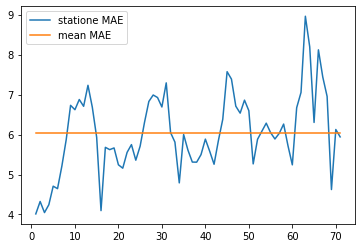

In [17]:
m = np.nanmean(score)*np.ones(71)
fig1 = plt.figure(1)
x=np.linspace(1,71,71)
plt.plot(x,score, label = 'statione MAE')
plt.plot(x,m, label = 'mean MAE')
plt.legend(loc = 2)

plt.show()

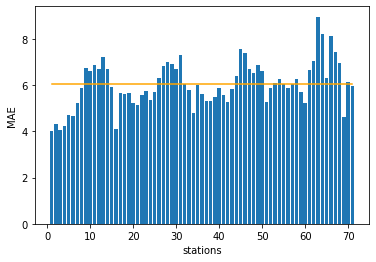

In [18]:
m = np.nanmean(score)*np.ones(71)
fig1 = plt.figure(1)
plt.bar(x,score,width=0.8)
# plt.xticks('stations')
plt.xlabel('stations')
plt.ylabel('MAE')
plt.plot(x,m, color='Orange')

plt.show()

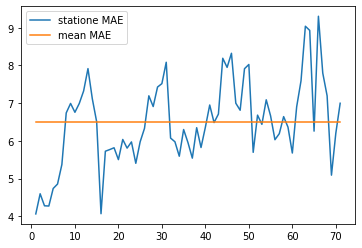

In [154]:
m = np.nanmean(score)*np.ones(71)
fig1 = plt.figure(1)
x=np.linspace(1,71,71)
plt.plot(x,score, label = 'statione MAE')
plt.plot(x,m, label = 'mean MAE')
plt.legend(loc = 2)

plt.show()

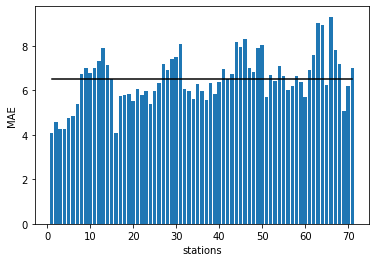

In [159]:
m = np.nanmean(score)*np.ones(71)
fig1 = plt.figure(1)
plt.bar(x,score,width=0.8)
# plt.xticks('stations')
plt.xlabel('stations')
plt.ylabel('MAE')
plt.plot(x,m, color='Orange')

plt.show()